In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import json
from collections import defaultdict
# import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go

import nltk
from nltk.corpus import wordnet 
nltk.download('stopwords')
from nltk.corpus import stopwords
# import spacy

import time
import string


# from sklearn.

# MODELS
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier

# EVALUATION METRICS and TOOLS
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import classification_report


# OTHER TOOLS
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import  HalvingGridSearchCV, RepeatedStratifiedKFold, cross_val_score, train_test_split

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from utils import main as utils, plots, preprocessing


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\alhas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Needed functions

In [2]:

with open("data/id_to_label.json", "r") as f:
    # Write the dictionary to the file in JSON format
    id_to_label = json.load(f)

In [3]:
def get_related_words(words):
    related_words = set(words)
    for word in words:
        for sset in wordnet.synsets(word):
            
            for hypernym in sset.hypernyms():
                [related_words.add(n) for n in hypernym.lemma_names()]
        
            for hyponym in sset.hyponyms():
                [related_words.add(n) for n in hyponym.lemma_names()]

    return related_words

In [4]:
def train_model(model,
                X_train, y_train,
                X_test, y_test,                
                verbose=False):  
        
    if model == 'RF':
        clf = RandomForestClassifier(n_estimators=100)
    # pipe = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(max_iter=10000))  
    elif model == 'LR':
        clf = LogisticRegression(max_iter=10000)
    elif model == 'SVM':
        clf = svm.LinearSVC(C=1.0)
    elif model == 'KN':
        clf = make_pipeline(StandardScaler(with_mean=False),
             KNeighborsClassifier(n_neighbors=16))

    if verbose:
        print("#"*10, f"Training {clf.__class__.__name__}\n")
    
    clf.fit(X_train, y_train)
    
    
    score = clf.score(X_test, y_test)
    pred = clf.predict(X_test)
    
    
    if verbose:
        print("#"*10, score)
    
    
    return clf, pred, score

In [32]:
def run(models=['LR', 'RF', 'SVM', 'KN'], **kwargs):
    # for cat in categories:
# for cat in [224, 226]:
    # print(cat)
    
    exact = kwargs.get('exact') and kwargs.get('specific_cat')
    kwargs['exact'] = exact
    
    # Load data
    df, X_train, X_test, y_train, y_test, feature_names, target_names = utils.load_dataset('data/en_data.csv',
                                                                                           target_label='ocms',
                                                                                           **kwargs)
    
    
    if kwargs.get('verbose'):
        sns.histplot([f'{id_to_label[i]} ({i})' for i in df['ocms']])
        plt.xticks(rotation=90)
        plt.show()
            
        
    dfs = []
    df_out = df.loc[y_test.index]
    top_indicators = defaultdict(list)
    # Run models
    for model in models:
        print('#'*10, kwargs.get('cat'), model, '\n')
            
        clf, pred, score = train_model(model, 
                                       X_train, y_train,
                                       X_test, y_test,
                                       verbose=True
                                       )
        
        y_pred  = pd.DataFrame(pred)

        # df_out = X_test.reset_index()
        # df_out["Actual"] = y_test.reset_index()["ocms"]
        # df_out["Prediction"] = y_pred.reset_index()[0]


#         y_test['preds'] = y_pred

#         df_out = pd.merge(df,y_test[['preds']],how = 'left',left_index = True, right_index = True)
        
        # df.loc[y_test.index, f'predicted_{model}'] = pred
        df_out[f'predicted_{model}'] = pred
        # dfs.append(df_out)

        if kwargs.get('verbose'):
            report = classification_report(y_test, pred, digits = 3)
            print(report)
            
        cm = plots.make_cm(clf, pred, y_test, target_names, to_labels=id_to_label)
        culture_plot = plots.plot_per_culture(df_out, model, top_k=10)
        
        if model == 'RF':
            # plots.plot_feature_effects(clf, X_train, fn, tn)  
            indicators = plots.plot_feature_importance(clf.feature_importances_, feature_names, 'RF')    
            # plot_feature_importance(clf, feature_names, target_names,  top_k=5)    
        else:
            if clf.coef_.shape[0] > 1:
                indicators = plots.plot_feature_effects_detailed(clf, X_train, feature_names, target_names, to_labels=id_to_label)#, top_k=5) 
            else:
                indicators = plots.plot_feature_effects(clf, X_train, feature_names, target_names, to_labels=id_to_label)#, top_k=10)
        top_indicators[model] = indicators
    return df_out, top_indicators

# Specific categories

### 224 and 226

In [46]:
iterations = 3

Iteration 1


C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 30.296s at 0.085MB/s
n_samples: 4600, n_features: 3784
n_samples: 1150, n_features: 3784


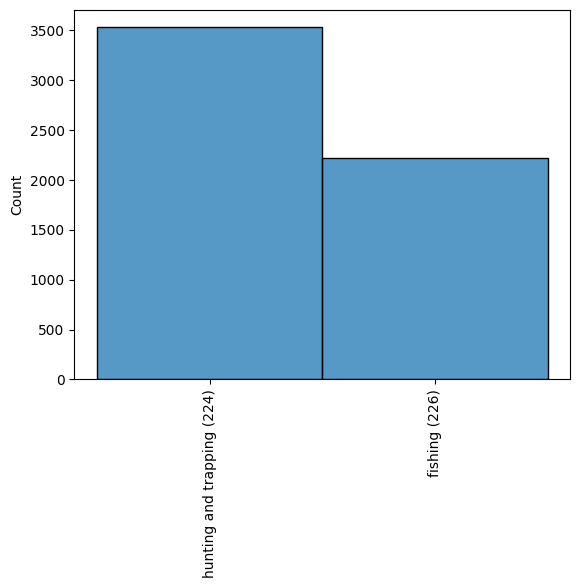

########## None LR 

########## Training LogisticRegression

########## 0.9347826086956522
              precision    recall  f1-score   support

         224      0.905     0.994     0.947       678
         226      0.990     0.850     0.914       472

    accuracy                          0.935      1150
   macro avg      0.947     0.922     0.931      1150
weighted avg      0.940     0.935     0.934      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



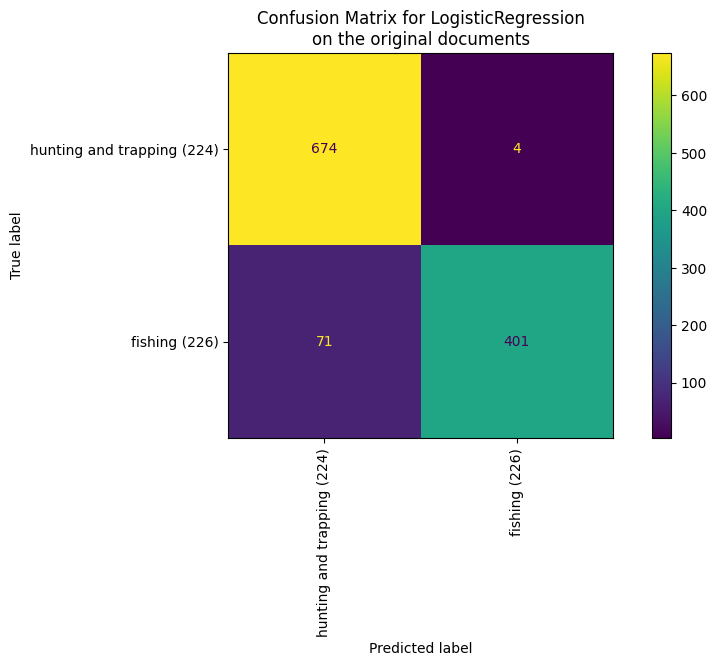

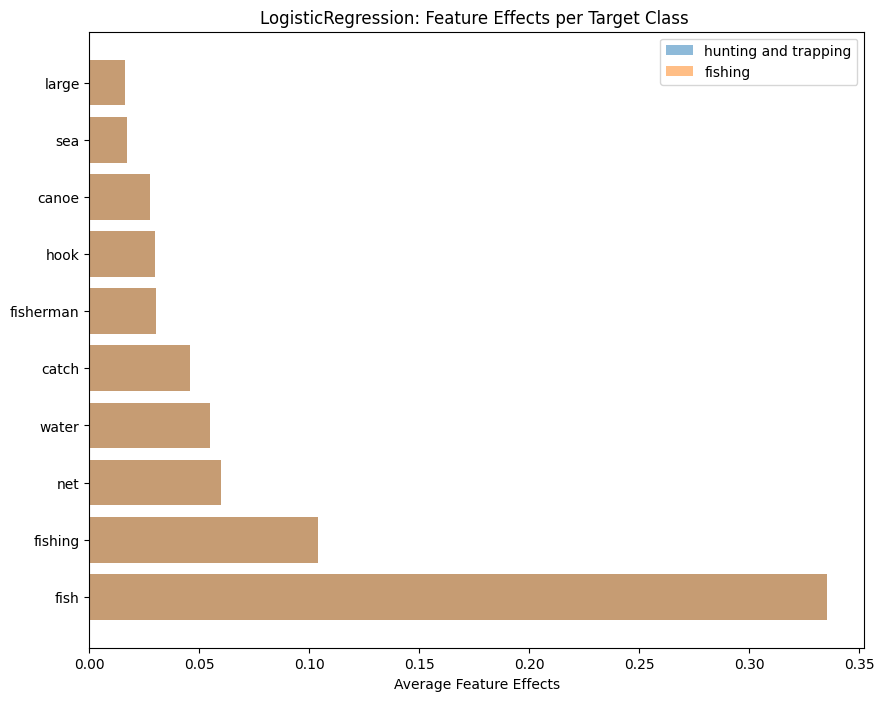

########## None SVM 

########## Training LinearSVC

########## 0.9347826086956522
              precision    recall  f1-score   support

         224      0.910     0.987     0.947       678
         226      0.978     0.860     0.915       472

    accuracy                          0.935      1150
   macro avg      0.944     0.923     0.931      1150
weighted avg      0.938     0.935     0.934      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



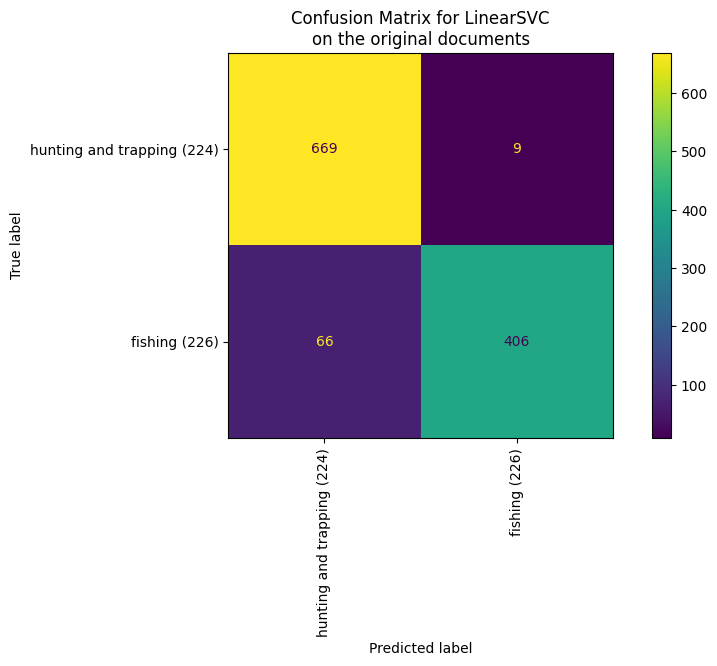

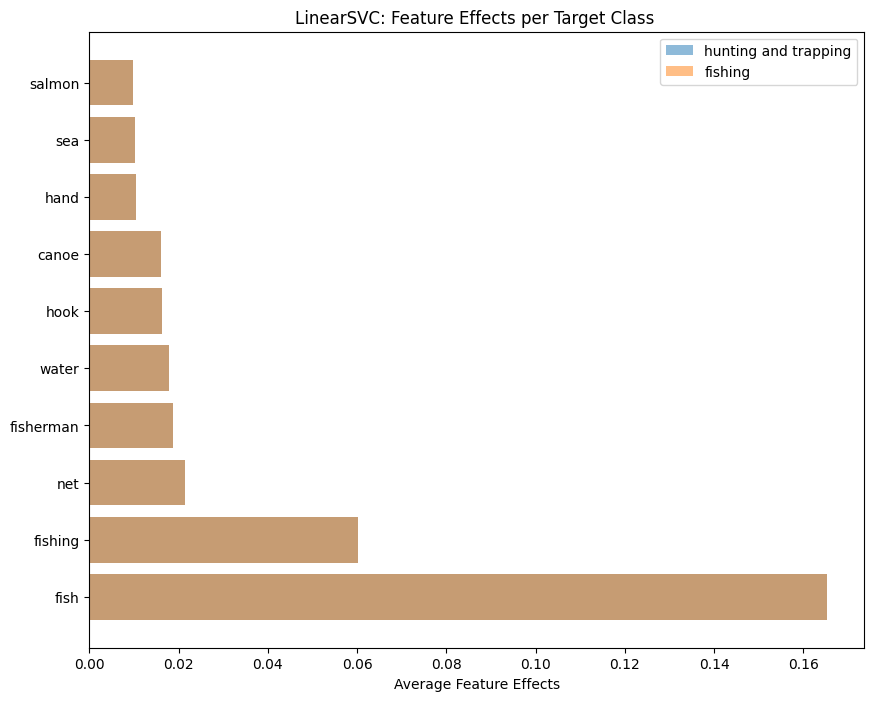

########## None RF 

########## Training RandomForestClassifier

########## 0.9339130434782609
              precision    recall  f1-score   support

         224      0.912     0.982     0.946       678
         226      0.971     0.864     0.915       472

    accuracy                          0.934      1150
   macro avg      0.942     0.923     0.930      1150
weighted avg      0.937     0.934     0.933      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


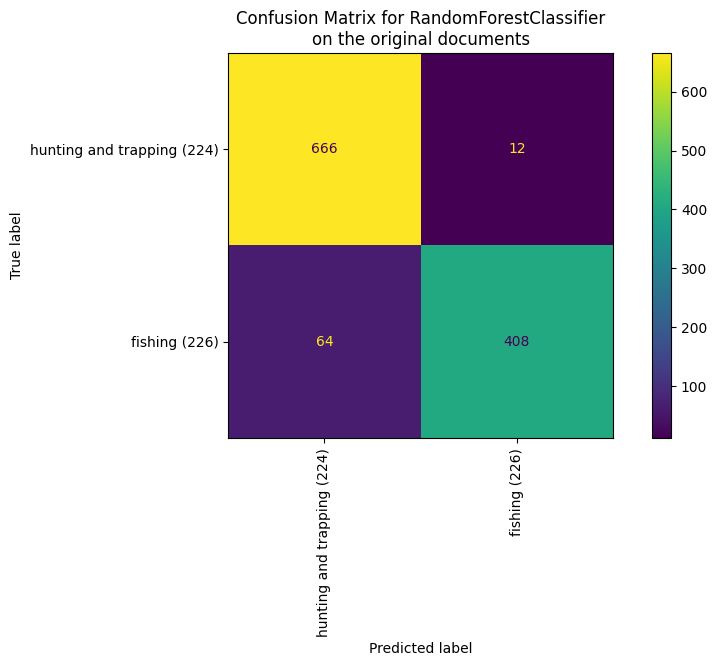

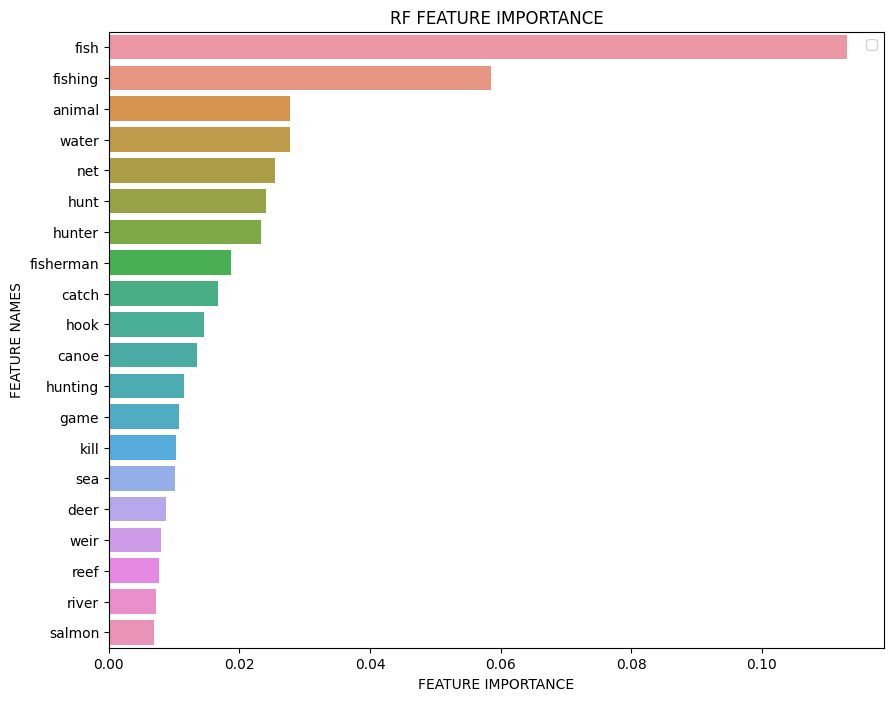

Iteration 2


C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 36.999s at 0.069MB/s
n_samples: 4600, n_features: 3766
n_samples: 1150, n_features: 3766


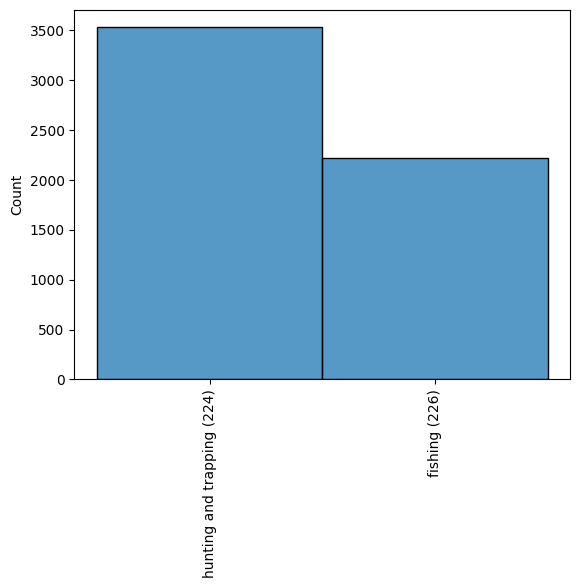

########## None LR 

########## Training LogisticRegression

########## 0.9260869565217391
              precision    recall  f1-score   support

         224      0.914     0.972     0.942       710
         226      0.949     0.852     0.898       440

    accuracy                          0.926      1150
   macro avg      0.932     0.912     0.920      1150
weighted avg      0.927     0.926     0.925      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



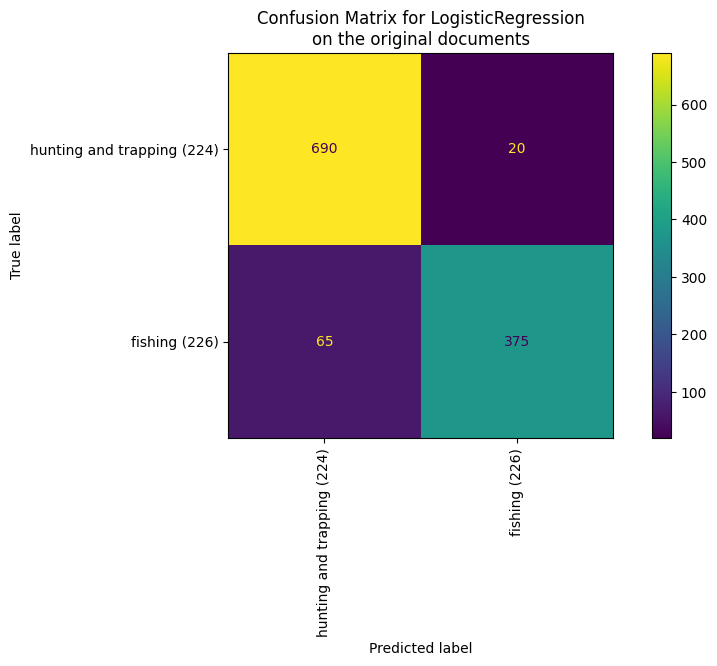

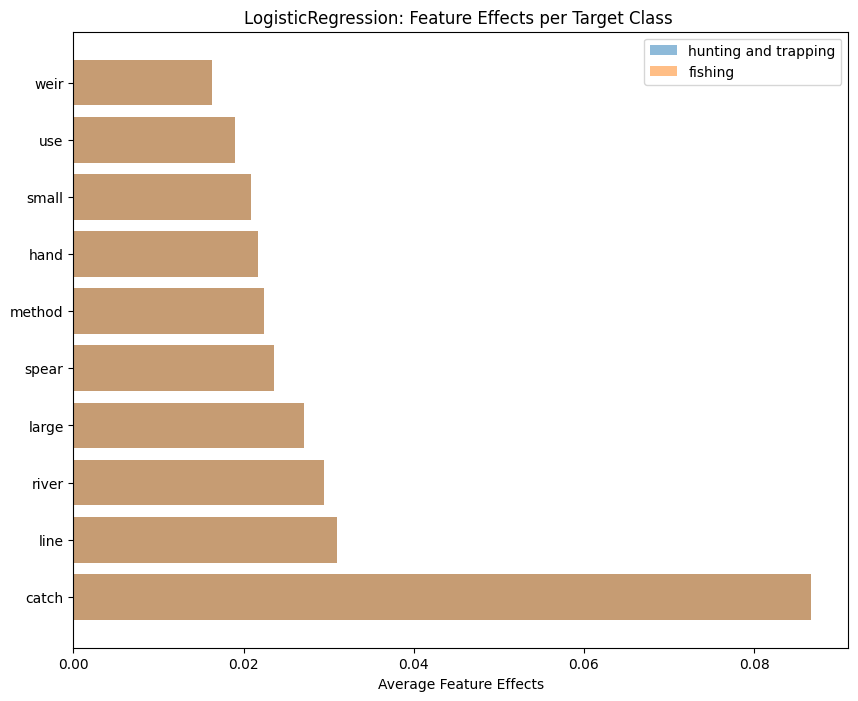

########## None SVM 

########## Training LinearSVC

########## 0.9295652173913044
              precision    recall  f1-score   support

         224      0.919     0.972     0.945       710
         226      0.950     0.861     0.903       440

    accuracy                          0.930      1150
   macro avg      0.934     0.917     0.924      1150
weighted avg      0.931     0.930     0.929      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



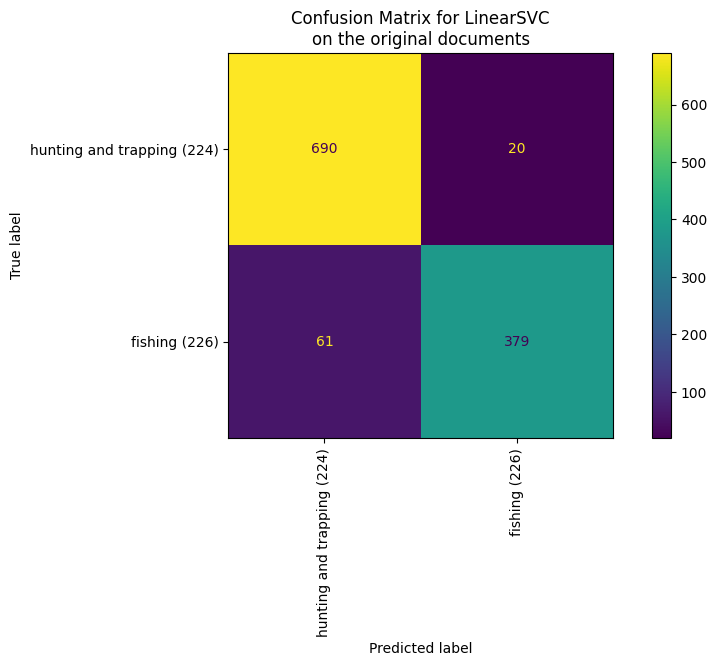

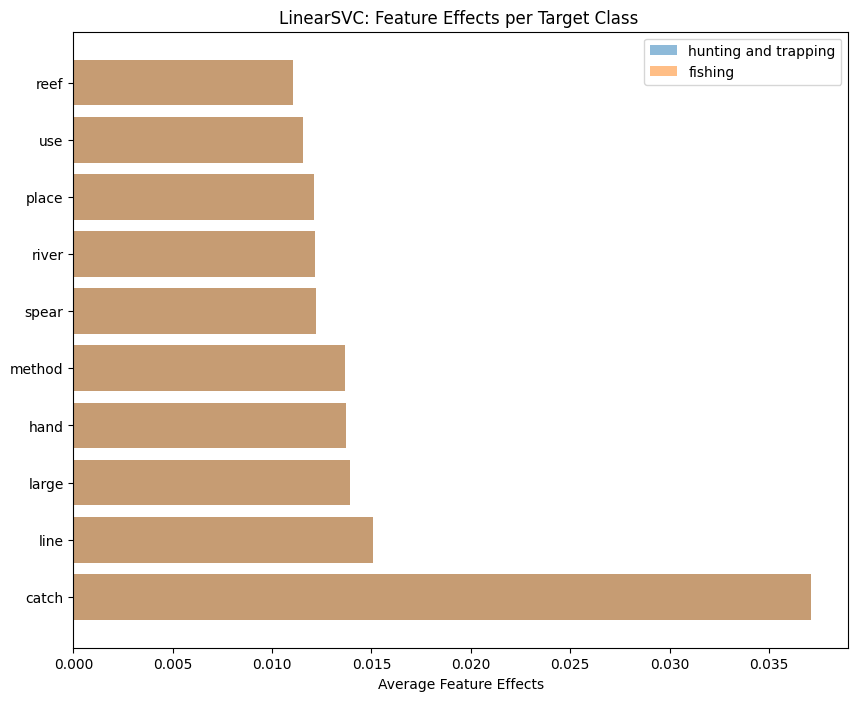

########## None RF 

########## Training RandomForestClassifier

########## 0.9208695652173913
              precision    recall  f1-score   support

         224      0.914     0.962     0.938       710
         226      0.933     0.855     0.892       440

    accuracy                          0.921      1150
   macro avg      0.924     0.908     0.915      1150
weighted avg      0.921     0.921     0.920      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


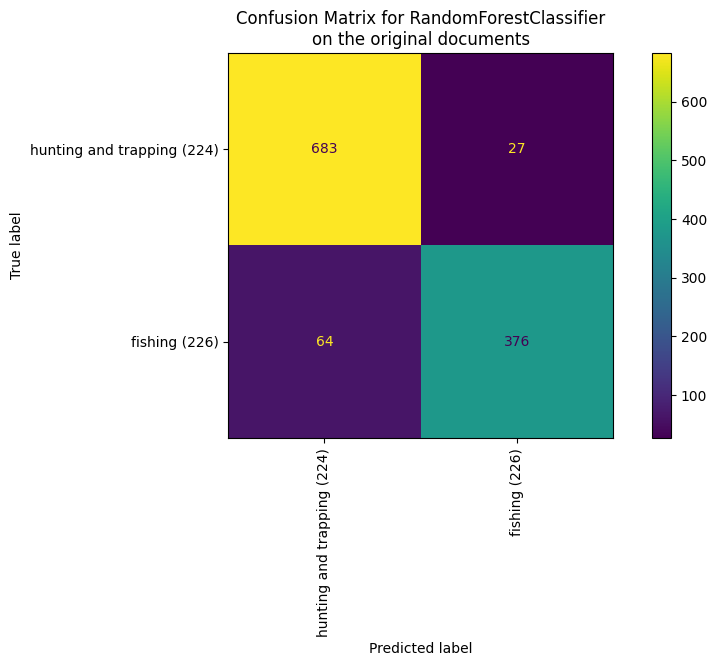

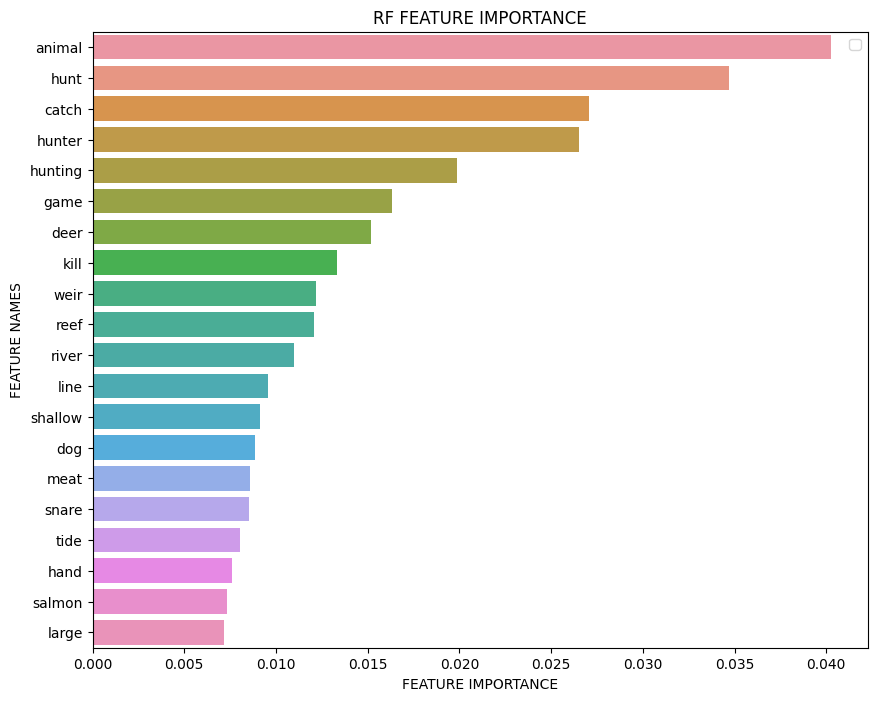

Iteration 3


C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 37.827s at 0.068MB/s
n_samples: 4600, n_features: 3757
n_samples: 1150, n_features: 3757


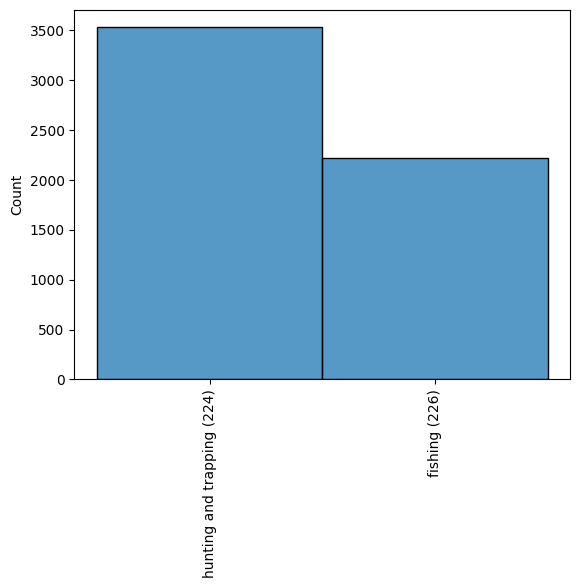

########## None LR 

########## Training LogisticRegression

########## 0.9104347826086957
              precision    recall  f1-score   support

         224      0.892     0.970     0.929       698
         226      0.946     0.819     0.878       452

    accuracy                          0.910      1150
   macro avg      0.919     0.894     0.904      1150
weighted avg      0.913     0.910     0.909      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



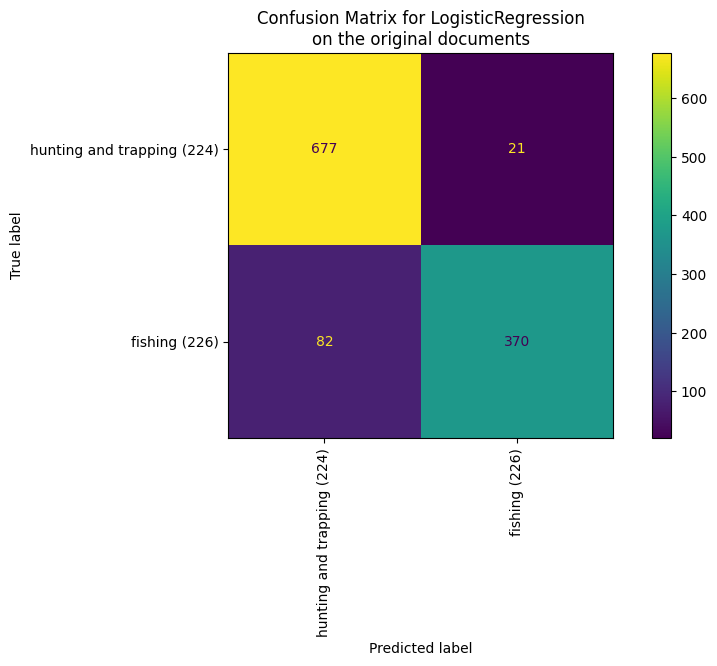

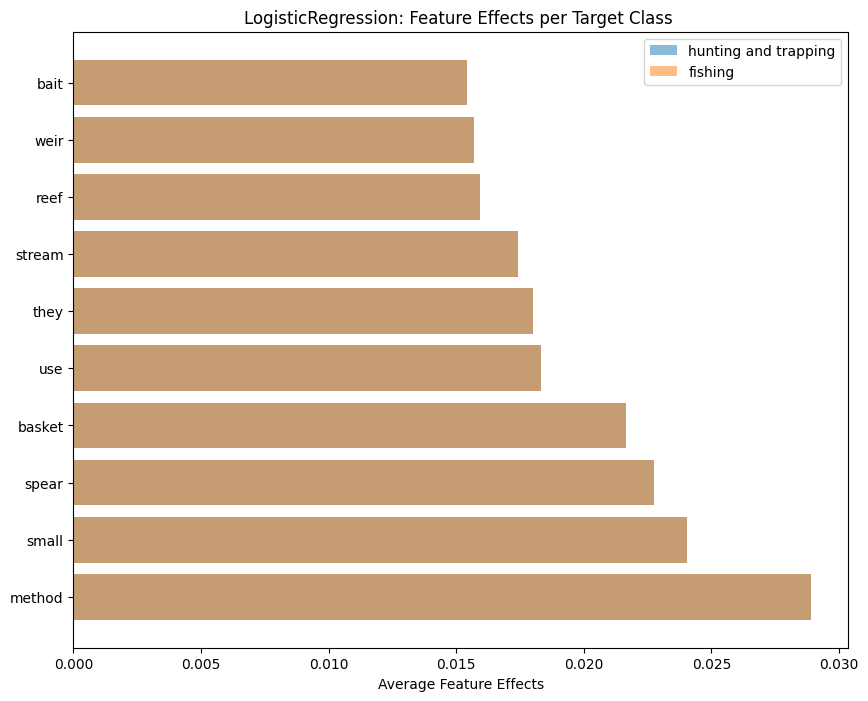

########## None SVM 

########## Training LinearSVC

########## 0.9078260869565218
              precision    recall  f1-score   support

         224      0.894     0.963     0.927       698
         226      0.935     0.823     0.875       452

    accuracy                          0.908      1150
   macro avg      0.914     0.893     0.901      1150
weighted avg      0.910     0.908     0.907      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



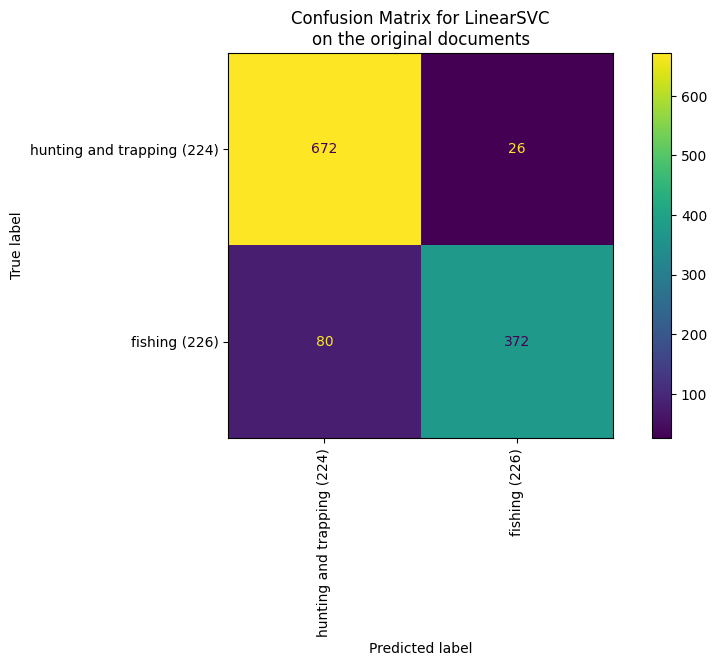

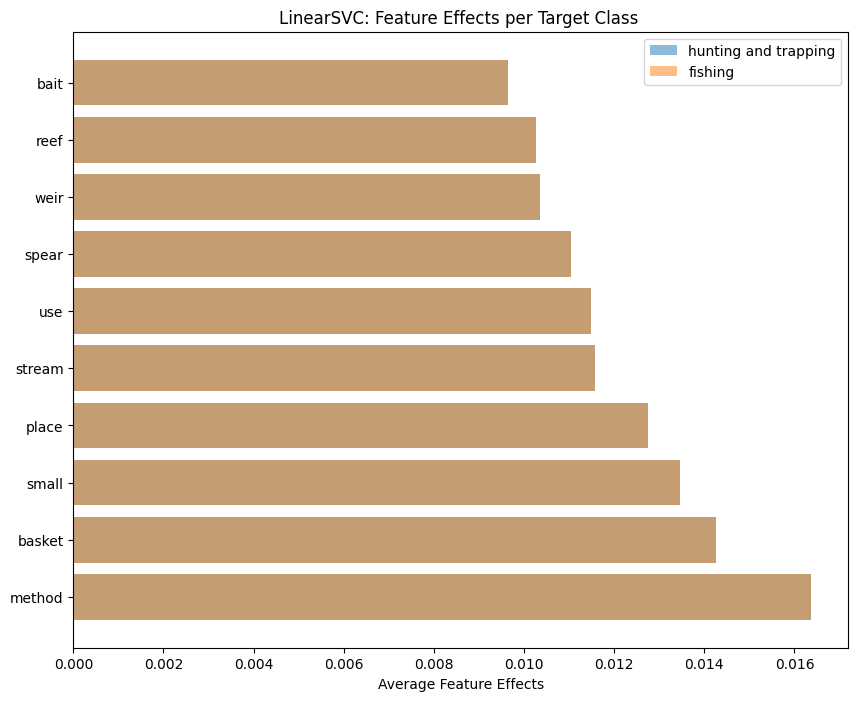

########## None RF 

########## Training RandomForestClassifier

########## 0.8904347826086957
              precision    recall  f1-score   support

         224      0.880     0.948     0.913       698
         226      0.910     0.801     0.852       452

    accuracy                          0.890      1150
   macro avg      0.895     0.875     0.882      1150
weighted avg      0.892     0.890     0.889      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


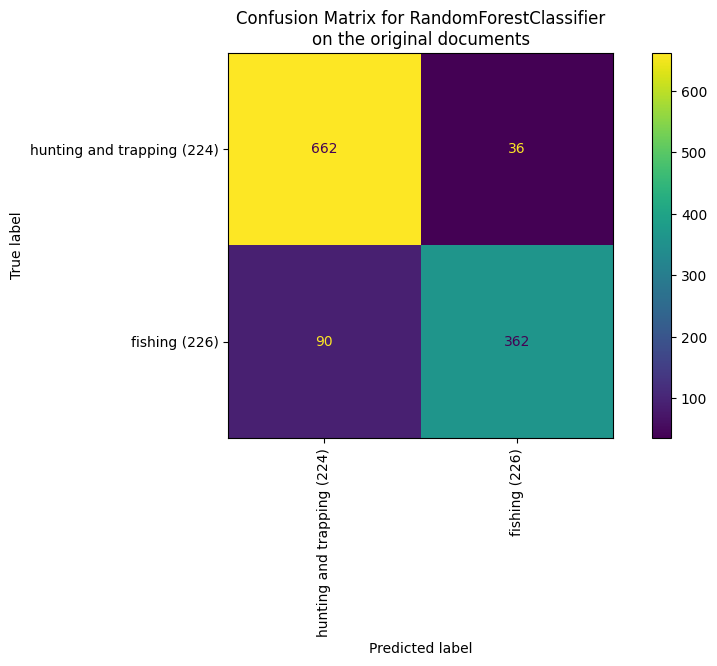

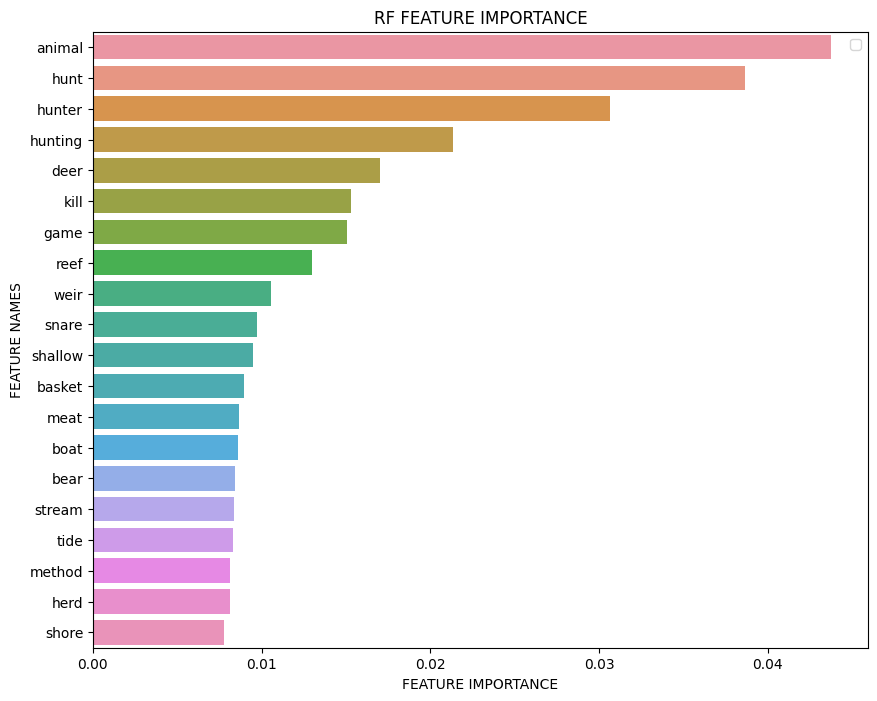

In [47]:
results = defaultdict(dict)
top_indicators = []

for i in range(iterations):
    print(f"Iteration {i+1}")

    df, curr_indicators  = run(models=['LR', 'SVM', 'RF'], 
                              chosen_categories=[224, 226], 
                              # exclude=results.get(i-1).get('indicators') if results.get(i-1) else [],
                              exclude=top_indicators,
                              verbose=True)
    results[i]['df'] = df
    top_indicators += get_common_indicators(curr_indicators)
    results[i]['indicators'] = top_indicators
    

In [50]:
top_indicators

{'LR', 'RF', 'SVM'}

Iteration 1
Exclude: set().'


C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 31.005s at 0.083MB/s
n_samples: 4600, n_features: 3784
n_samples: 1150, n_features: 3784


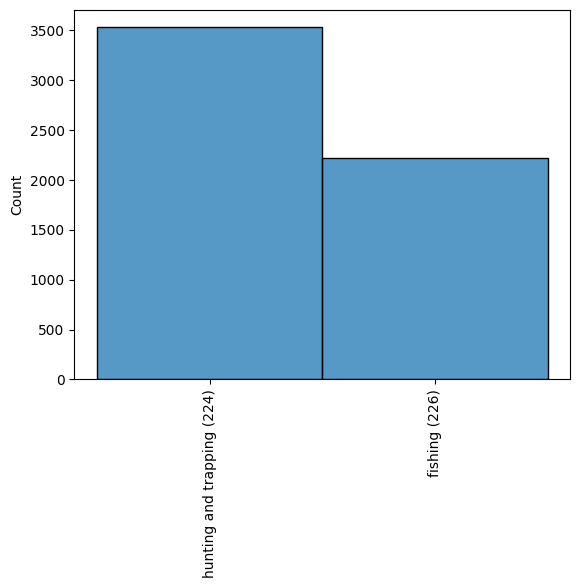

########## None LR 

########## Training LogisticRegression

########## 0.9365217391304348
              precision    recall  f1-score   support

         224      0.908     0.994     0.949       689
         226      0.990     0.850     0.915       461

    accuracy                          0.937      1150
   macro avg      0.949     0.922     0.932      1150
weighted avg      0.941     0.937     0.936      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



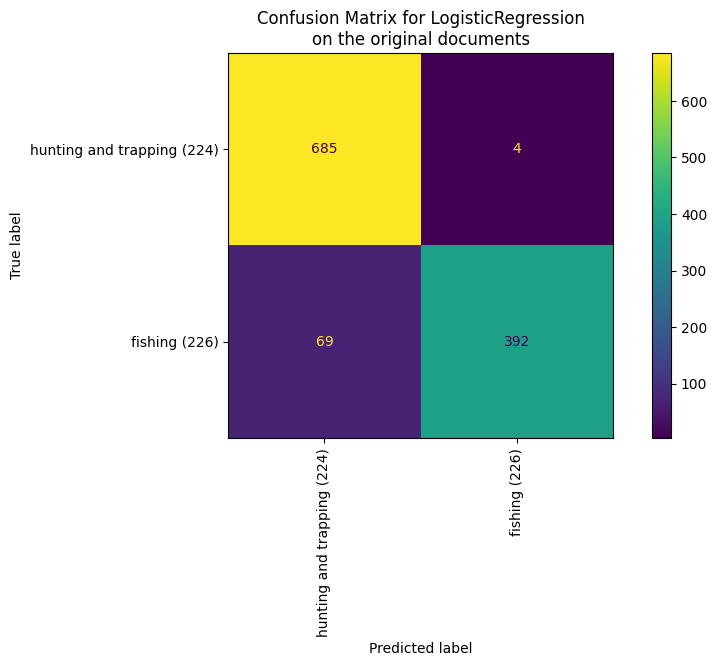

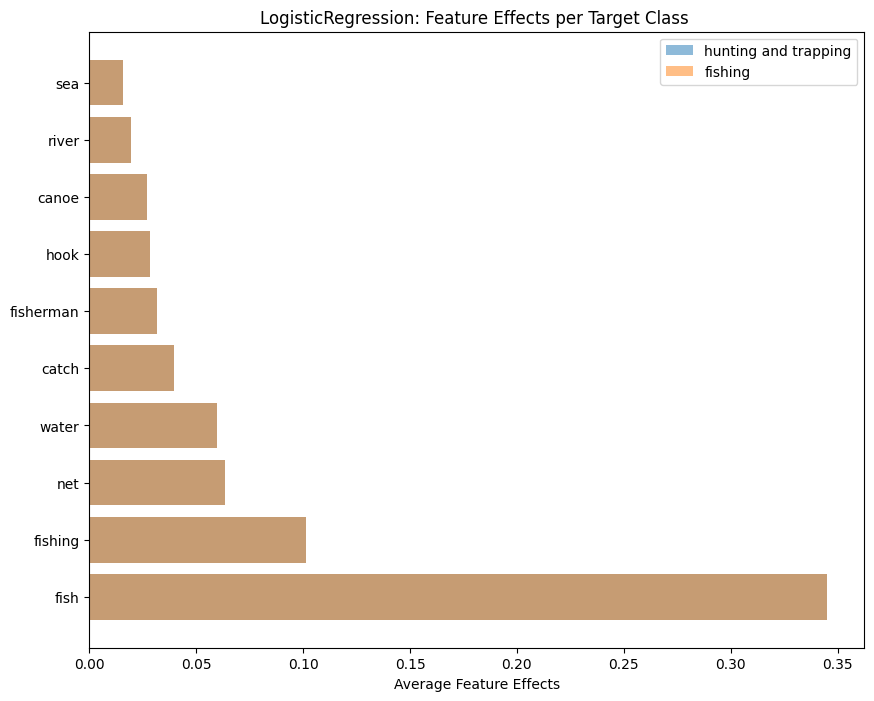

########## None SVM 

########## Training LinearSVC

########## 0.9460869565217391
              precision    recall  f1-score   support

         224      0.927     0.988     0.956       689
         226      0.981     0.883     0.929       461

    accuracy                          0.946      1150
   macro avg      0.954     0.936     0.943      1150
weighted avg      0.948     0.946     0.946      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



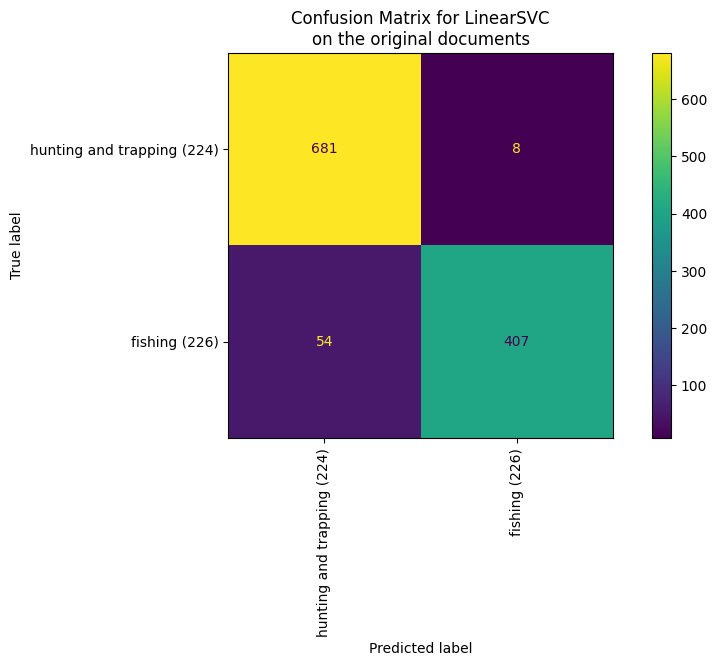

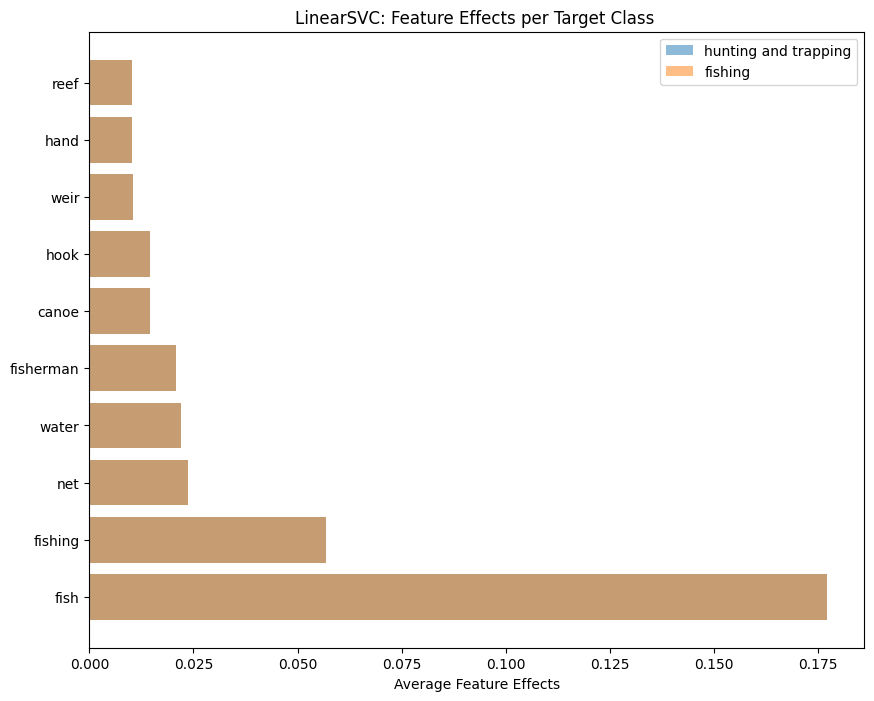

########## None RF 

########## Training RandomForestClassifier

########## 0.9330434782608695
              precision    recall  f1-score   support

         224      0.912     0.983     0.946       689
         226      0.971     0.859     0.911       461

    accuracy                          0.933      1150
   macro avg      0.941     0.921     0.929      1150
weighted avg      0.936     0.933     0.932      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


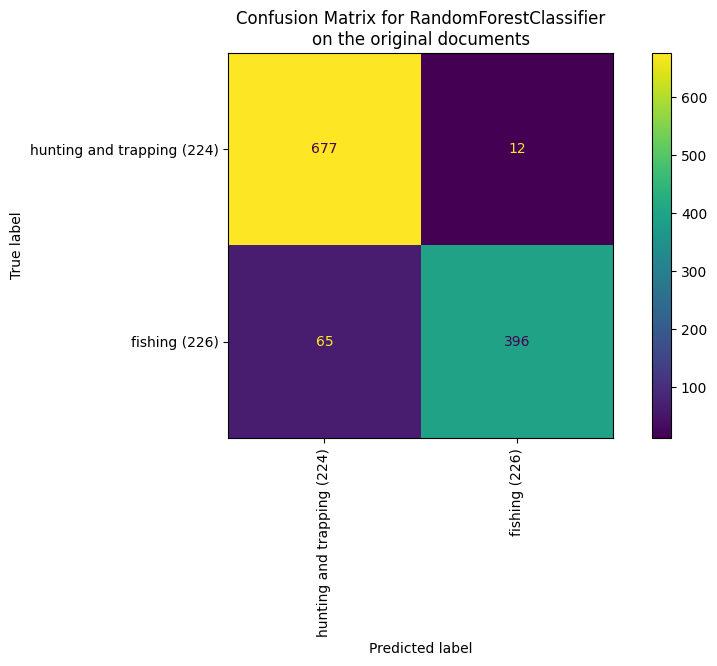

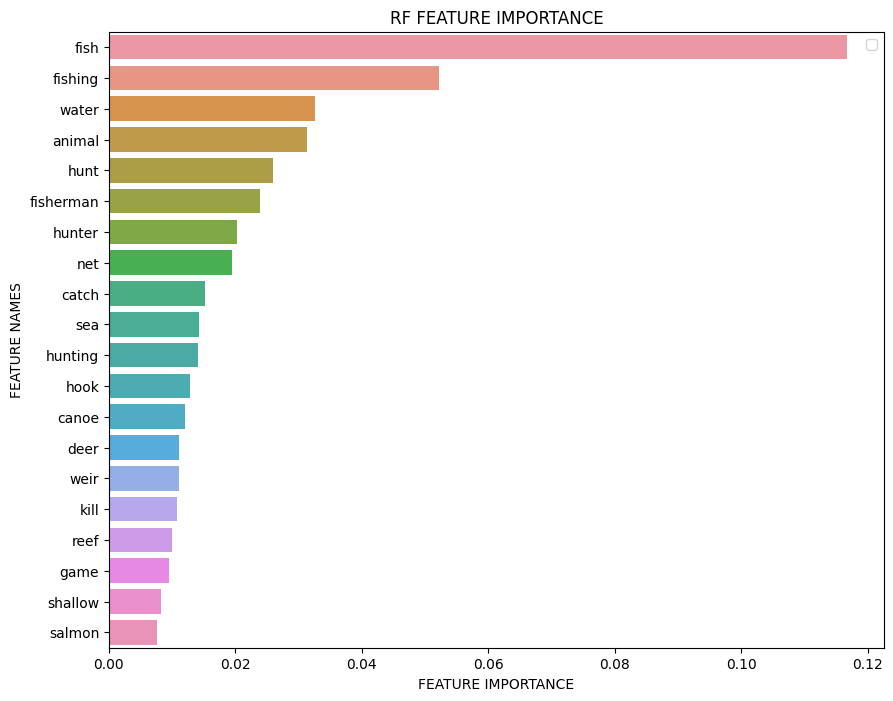

Iteration 2
Exclude: {'animal', 'catch', 'fishing', 'net', 'fisherman', 'water', 'reef', 'kill', 'canoe', 'weir', 'hunt', 'sea', 'deer', 'shallow', 'hunter', 'fish', 'hand', 'hunting', 'game', 'river', 'salmon', 'hook'}.'


C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 39.164s at 0.066MB/s
n_samples: 4600, n_features: 3745
n_samples: 1150, n_features: 3745


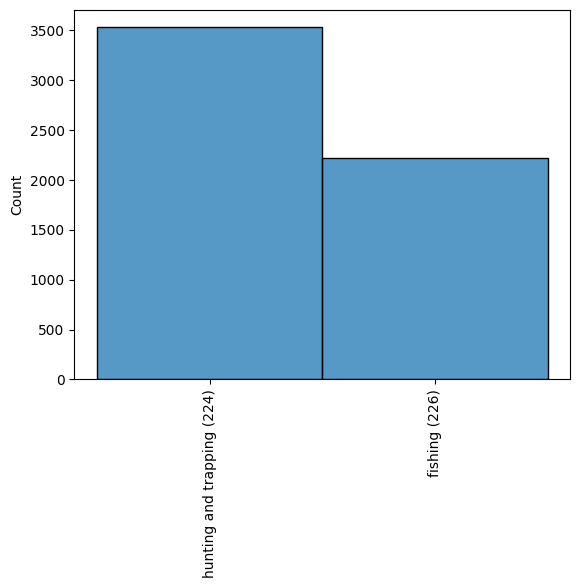

########## None LR 

########## Training LogisticRegression

########## 0.8730434782608696
              precision    recall  f1-score   support

         224      0.847     0.969     0.904       708
         226      0.935     0.719     0.813       442

    accuracy                          0.873      1150
   macro avg      0.891     0.844     0.859      1150
weighted avg      0.881     0.873     0.869      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



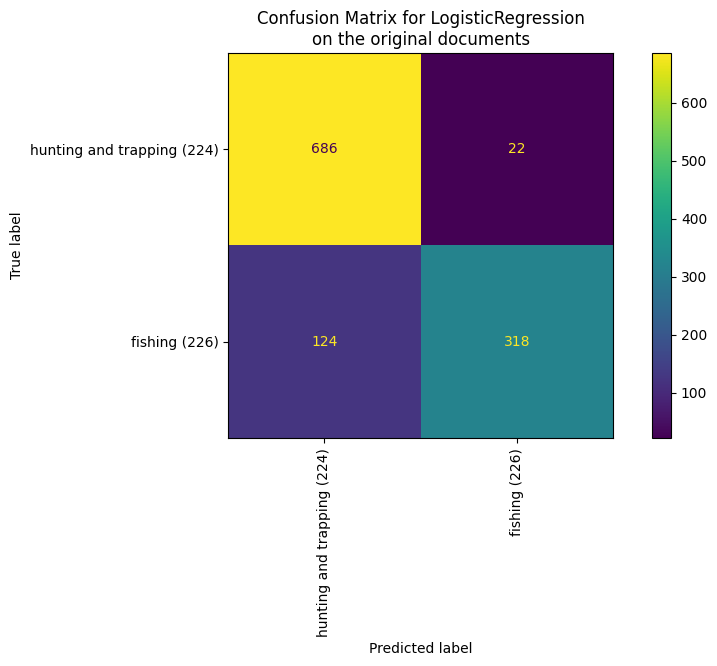

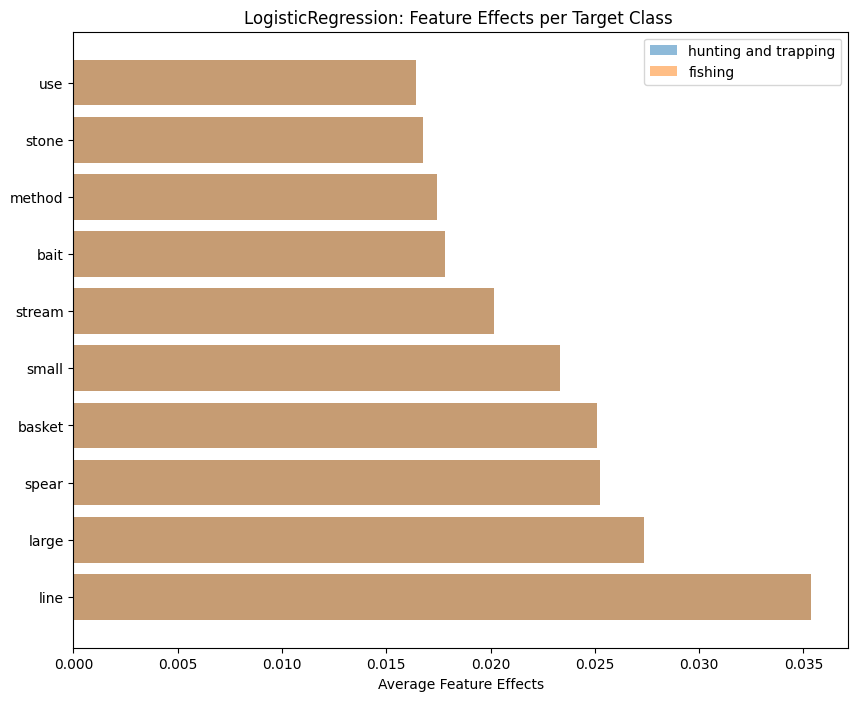

########## None SVM 

########## Training LinearSVC

########## 0.8756521739130435
              precision    recall  f1-score   support

         224      0.864     0.948     0.904       708
         226      0.901     0.760     0.825       442

    accuracy                          0.876      1150
   macro avg      0.882     0.854     0.864      1150
weighted avg      0.878     0.876     0.873      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



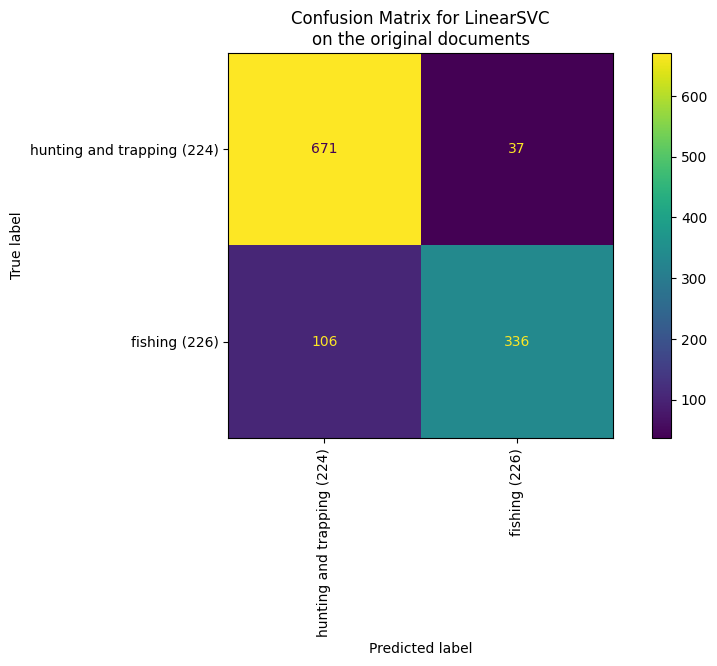

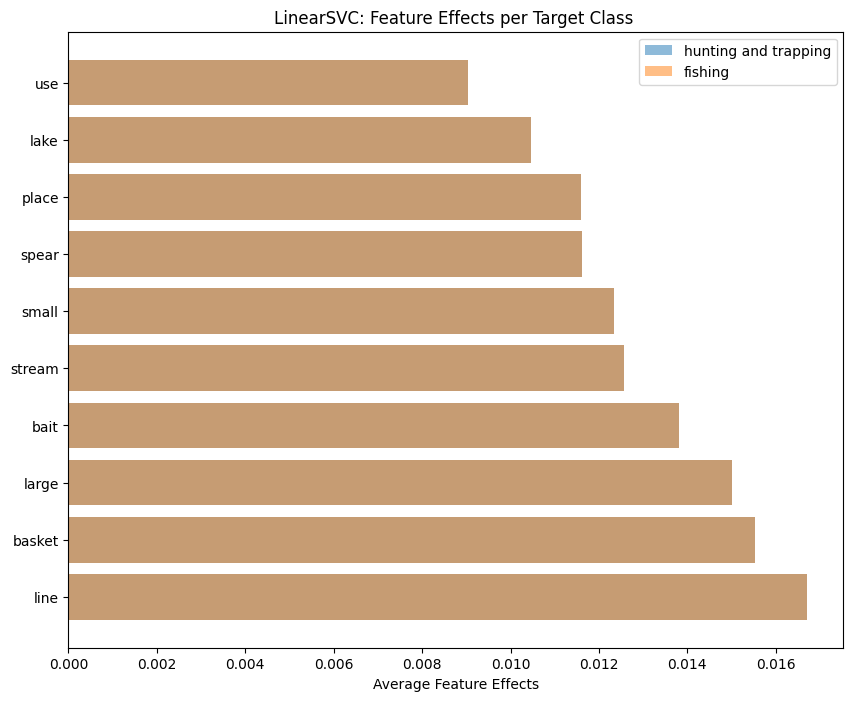

########## None RF 

########## Training RandomForestClassifier

########## 0.8452173913043478
              precision    recall  f1-score   support

         224      0.833     0.936     0.882       708
         226      0.873     0.699     0.776       442

    accuracy                          0.845      1150
   macro avg      0.853     0.818     0.829      1150
weighted avg      0.848     0.845     0.841      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


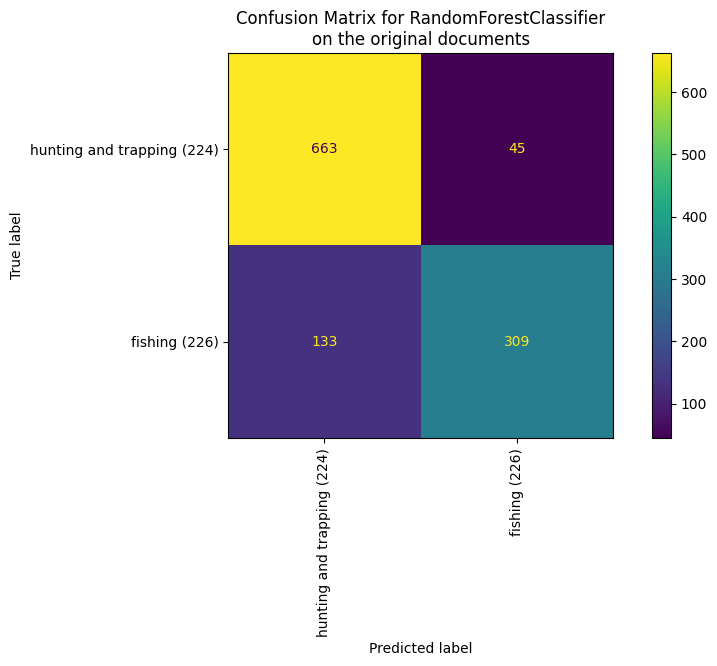

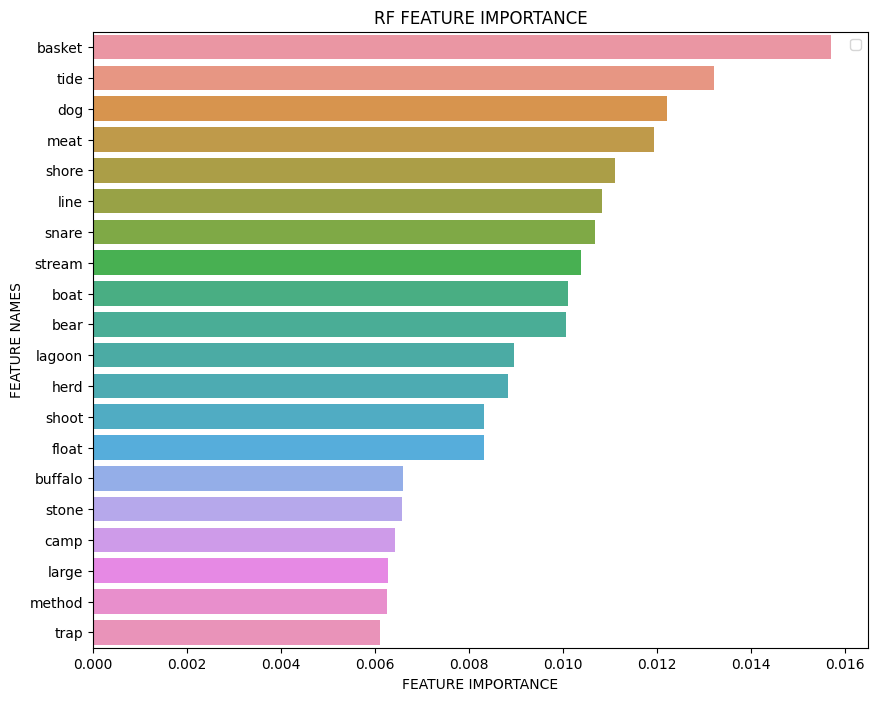

Iteration 3
Exclude: {'animal', 'herd', 'meat', 'float', 'fishing', 'net', 'fisherman', 'reef', 'kill', 'canoe', 'lagoon', 'hunt', 'sea', 'shallow', 'stone', 'buffalo', 'dog', 'fish', 'hand', 'small', 'tide', 'snare', 'hunting', 'camp', 'spear', 'use', 'trap', 'hook', 'catch', 'bear', 'water', 'weir', 'shoot', 'deer', 'shore', 'line', 'method', 'hunter', 'game', 'river', 'basket', 'boat', 'salmon', 'lake', 'large', 'stream', 'place', 'bait'}.'


C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 47.658s at 0.054MB/s
n_samples: 4600, n_features: 3708
n_samples: 1150, n_features: 3708


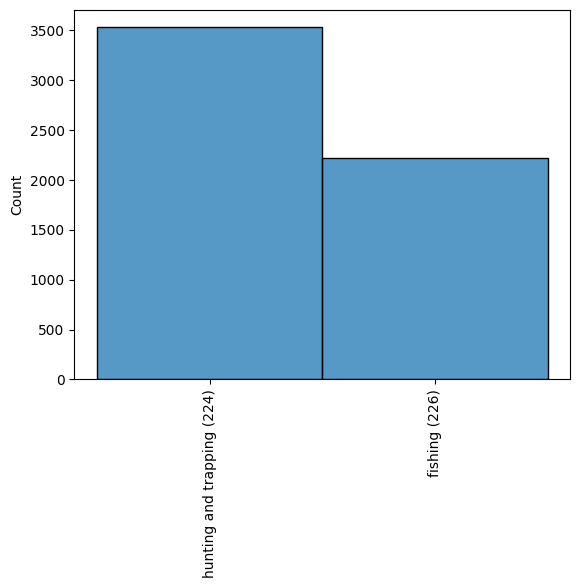

########## None LR 

########## Training LogisticRegression

########## 0.8756521739130435
              precision    recall  f1-score   support

         224      0.841     0.980     0.905       696
         226      0.959     0.716     0.820       454

    accuracy                          0.876      1150
   macro avg      0.900     0.848     0.862      1150
weighted avg      0.887     0.876     0.871      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



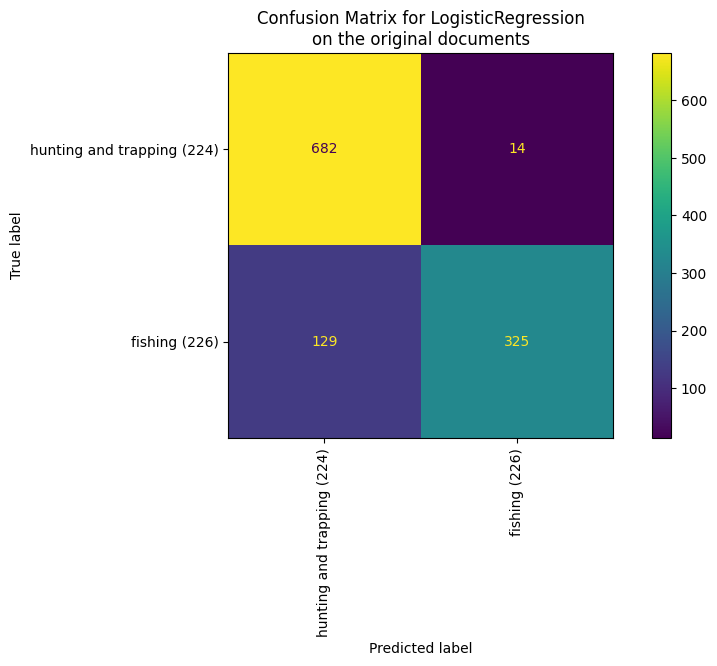

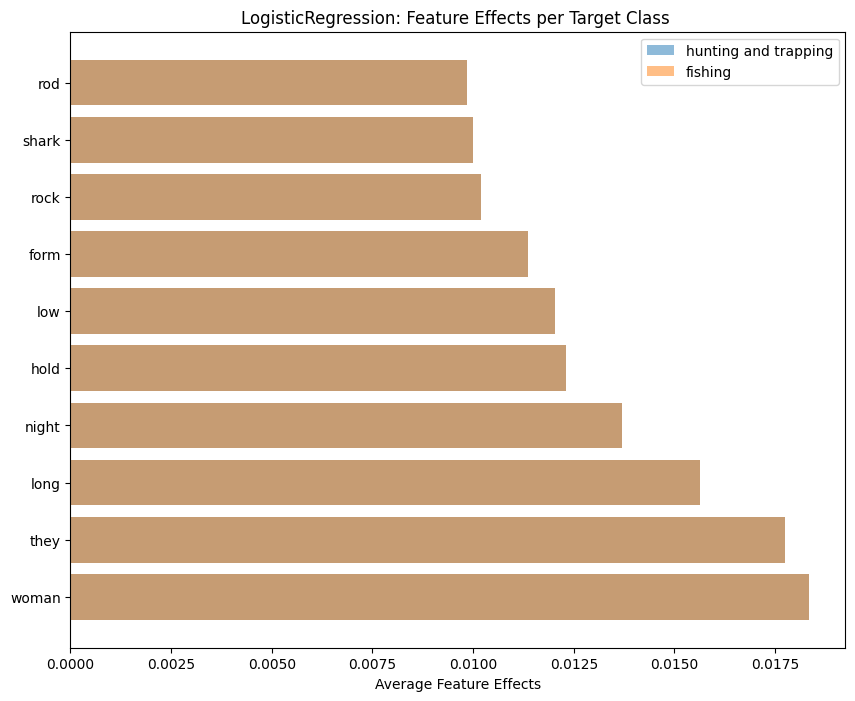

########## None SVM 

########## Training LinearSVC

########## 0.88
              precision    recall  f1-score   support

         224      0.858     0.961     0.907       696
         226      0.927     0.756     0.833       454

    accuracy                          0.880      1150
   macro avg      0.892     0.858     0.870      1150
weighted avg      0.885     0.880     0.877      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



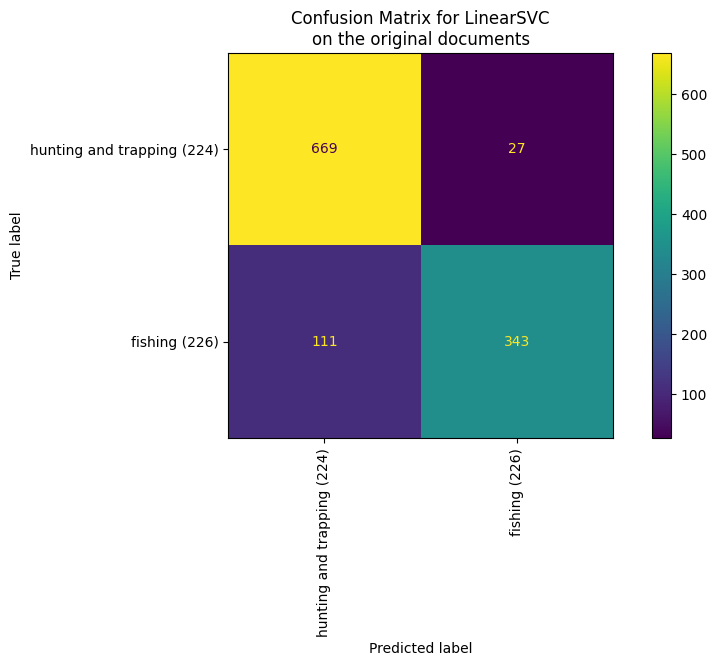

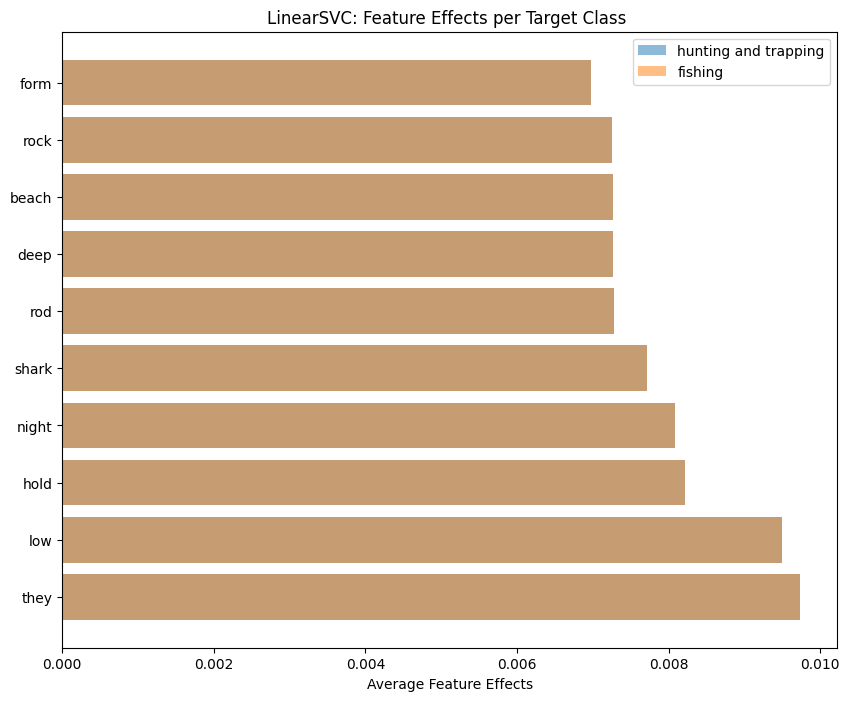

########## None RF 

########## Training RandomForestClassifier

########## 0.8539130434782609
              precision    recall  f1-score   support

         224      0.829     0.955     0.888       696
         226      0.911     0.698     0.791       454

    accuracy                          0.854      1150
   macro avg      0.870     0.827     0.839      1150
weighted avg      0.861     0.854     0.849      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


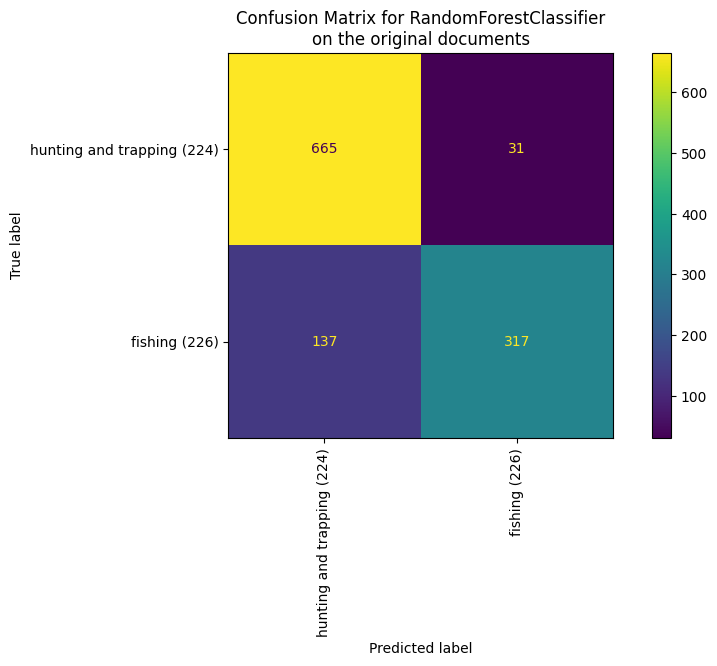

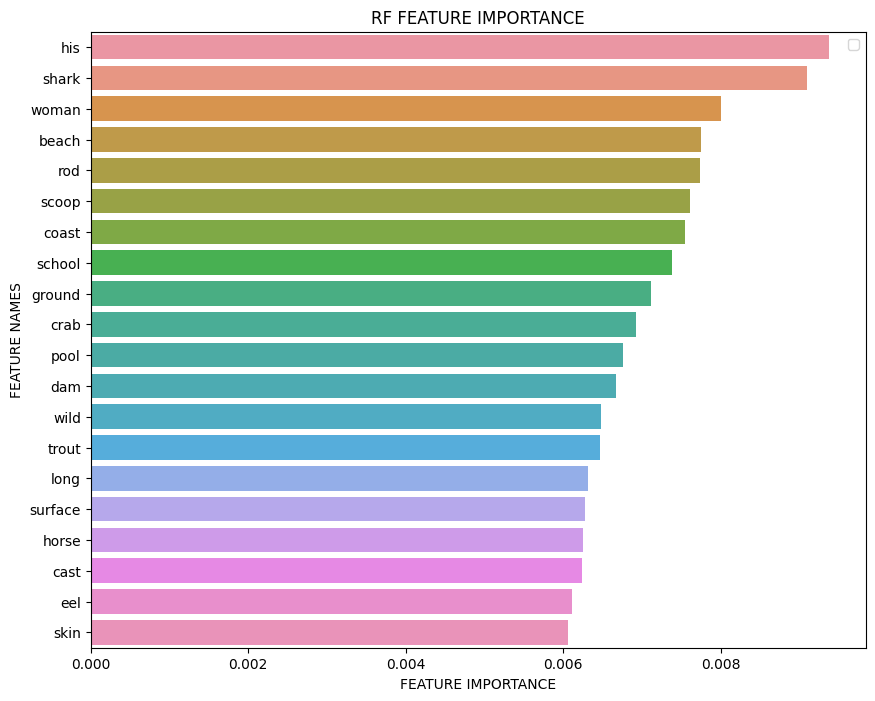

In [52]:
results = defaultdict(dict)
top_indicators = set()

for i in range(iterations):
    print(f"Iteration {i+1}\nExclude: {top_indicators}\n")

    df, curr_indicators  = run(models=['LR', 'SVM', 'RF'], 
                              chosen_categories=[224, 226], 
                              # exclude=results.get(i-1).get('indicators') if results.get(i-1) else [],
                              exclude=top_indicators,
                              verbose=True)
    results[i]['df'] = df
    # top_indicators += get_common_indicators(curr_indicators)
    
    # Get the list of arrays from the top_indicators values
    arrays = list(curr_indicators.values())
    
    top_indicators.update(set(arrays[0]).union(*arrays))
    
    results[i]['indicators'] = top_indicators
    

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



5750 documents - 2.57MB (training set)
2 categories
vectorize training done in 30.762s at 0.083MB/s
n_samples: 4600, n_features: 3784
n_samples: 1150, n_features: 3784


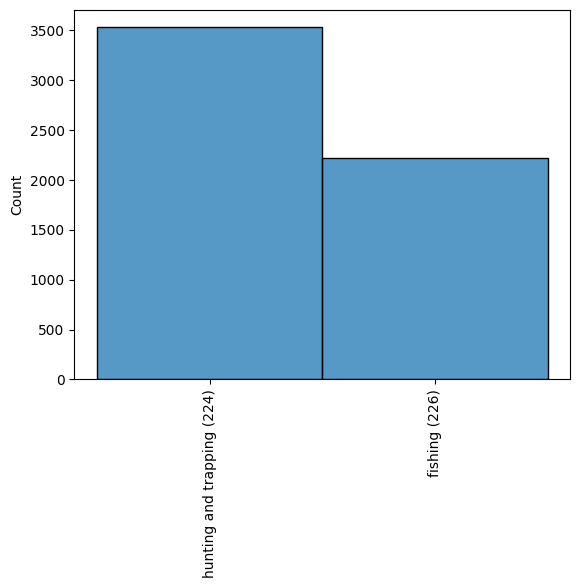

########## None LR 

########## Training LogisticRegression

########## 0.9382608695652174
              precision    recall  f1-score   support

         224      0.921     0.988     0.953       732
         226      0.975     0.852     0.909       418

    accuracy                          0.938      1150
   macro avg      0.948     0.920     0.931      1150
weighted avg      0.941     0.938     0.937      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



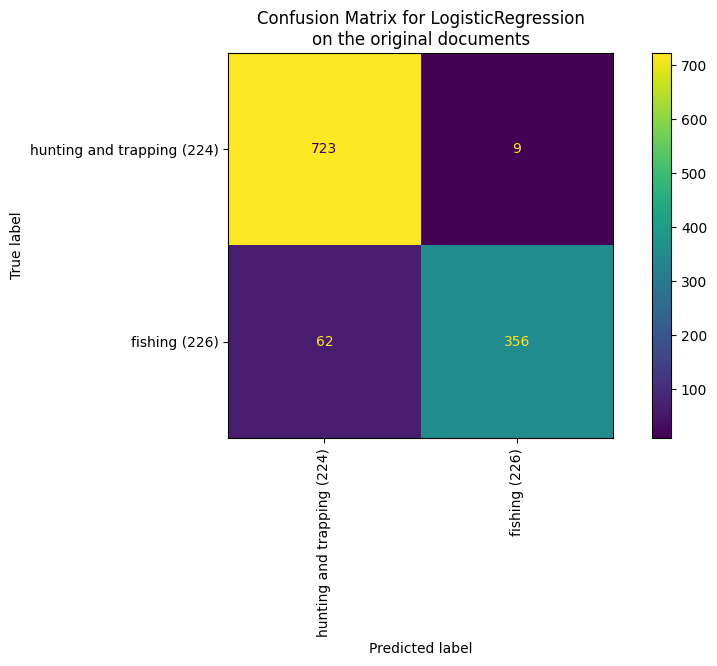

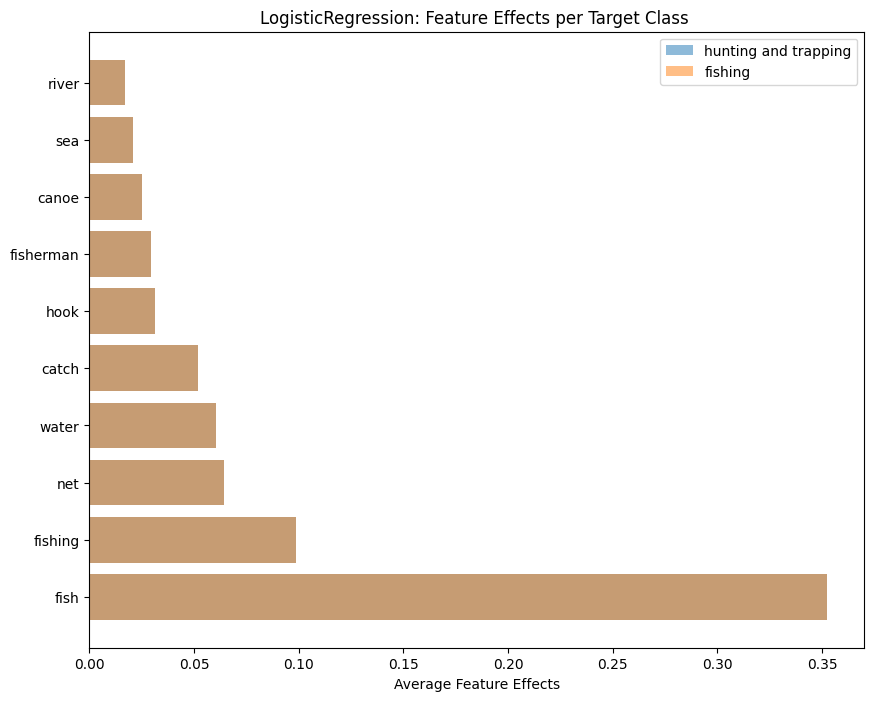

########## None SVM 

########## Training LinearSVC

########## 0.9417391304347826
              precision    recall  f1-score   support

         224      0.927     0.986     0.956       732
         226      0.973     0.864     0.915       418

    accuracy                          0.942      1150
   macro avg      0.950     0.925     0.935      1150
weighted avg      0.944     0.942     0.941      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



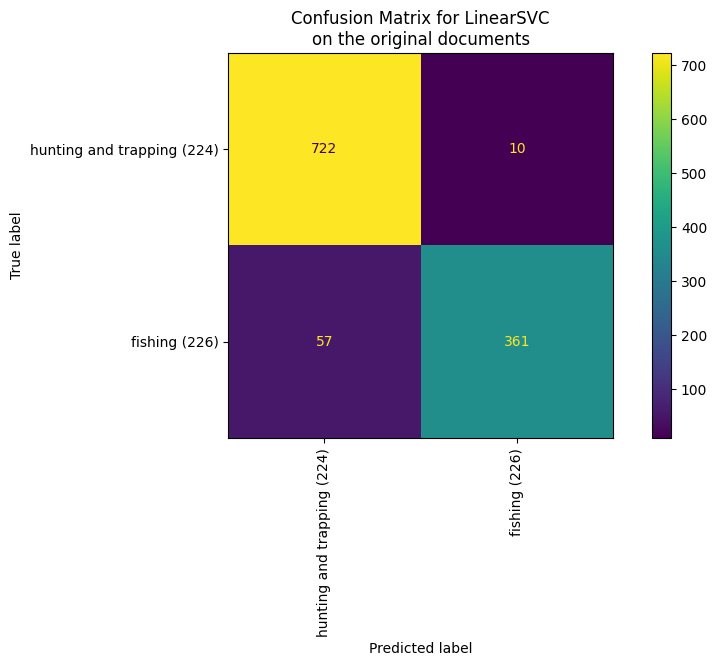

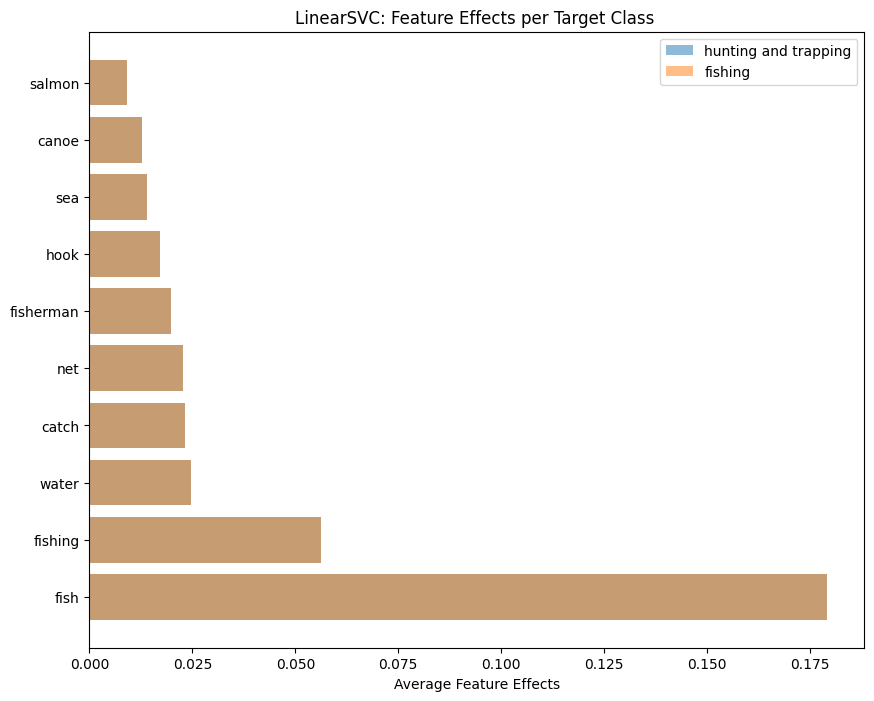

########## None RF 

########## Training RandomForestClassifier

########## 0.9365217391304348
              precision    recall  f1-score   support

         224      0.926     0.978     0.951       732
         226      0.958     0.864     0.908       418

    accuracy                          0.937      1150
   macro avg      0.942     0.921     0.930      1150
weighted avg      0.938     0.937     0.936      1150



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


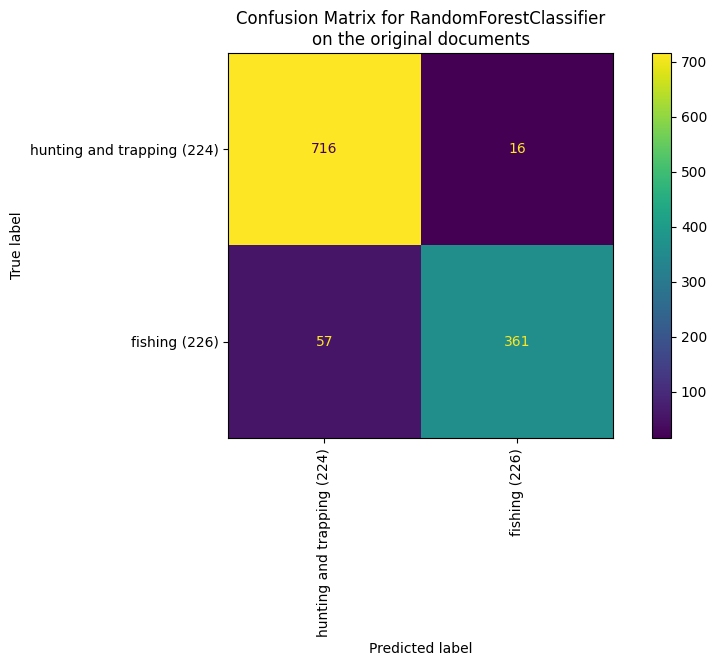

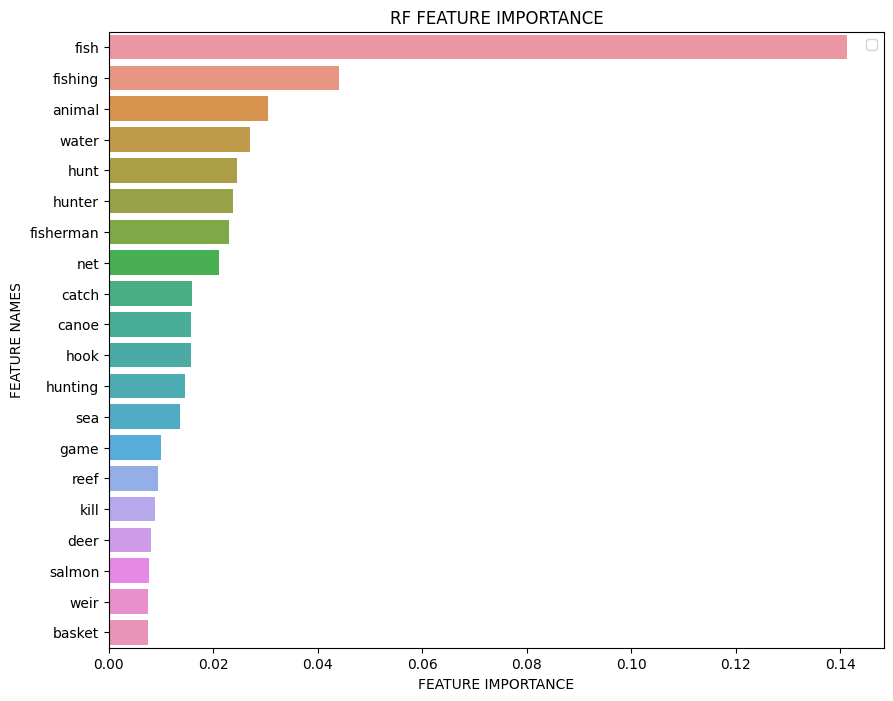

In [34]:
id_to_label['222']

df, top_indicators  = run(models=['LR', 'SVM', 'RF'], chosen_categories=[224, 226], verbose=True)

In [38]:
def get_common_indicators(top_indicators):
    # Get the list of arrays from the top_indicators values
    arrays = list(top_indicators.values())

    # Get the intersection of all arrays
    shared_elements = set(arrays[0]).intersection(*arrays)

    # Create a list to preserve the order of shared elements
    shared_elements_ordered = [x for x in arrays[0] if x in shared_elements]
    return shared_elements_ordered
    

In [16]:
df.groupby('ocms').count() 

,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,language,ocms_list,predicted_LR,predicted_SVM,predicted_RF
ocms,,,,,,,,,,,,,,,,,,,,,
224,688,688,688,542,308,688,688,688,663,688,...,688,688,688,688,688,688,688,688,688,688
226,462,462,462,394,248,462,462,462,449,462,...,462,462,462,462,462,462,462,462,462,462


In [17]:
wordnet.synonyms('alone')

[[],
 ['lone', 'lonely', 'solitary'],
 ['only'],
 ['unequaled', 'unequalled', 'unique', 'unparalleled'],
 ['entirely', 'exclusively', 'only', 'solely'],
 ['solo', 'unaccompanied']]

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


7835 documents - 3.45MB (training set)
3 categories
vectorize training done in 63.698s at 0.054MB/s
n_samples: 6268, n_features: 4576
n_samples: 1567, n_features: 4576


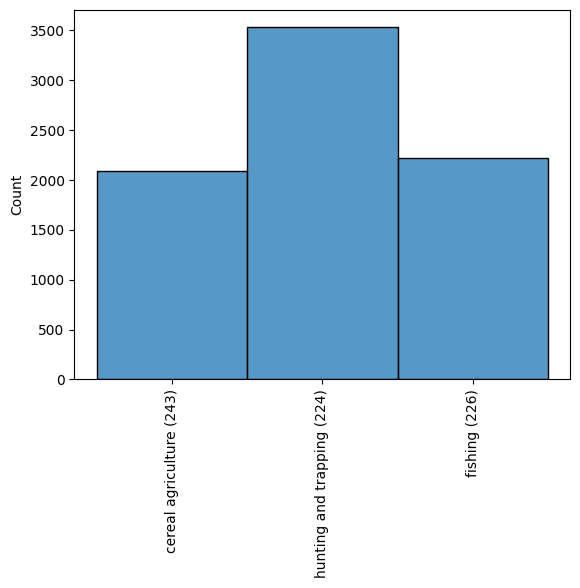

########## None LR 

########## Training LogisticRegression

########## 0.8730057434588385


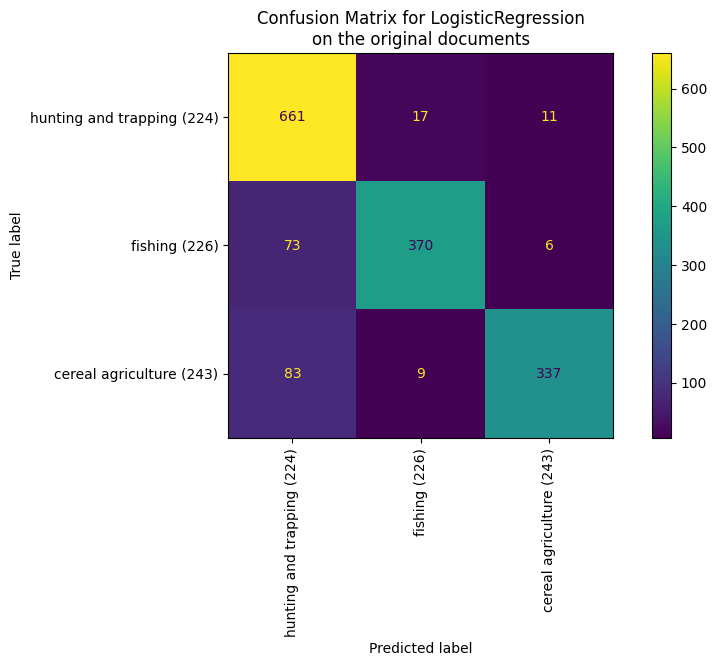

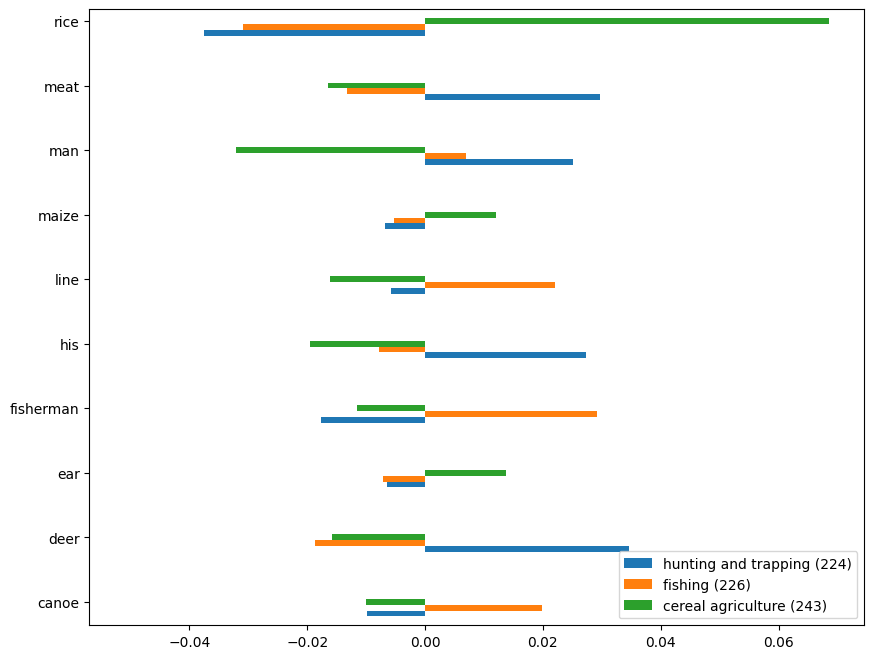

In [6]:
id_to_label['222']

df = run(models=['LR', 'SVM', 'RF'], chosen_categories=[224, 226], verbose=True, exclude=['fish', 'fishing', 'hunt', 'hunting', 'hunter', 'field', 'crop', 'catch', 'animal', 
                                                                                  'plant', 'corn', 'net', 'hook', 'kill', 'game', 
                                                                                  'harvest', 'grow', 'grain'])

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## None LR 

########## Training LogisticRegression

########## 0.824455766558592


########## None RF 

########## Training RandomForestClassifier

########## 0.7906438165817508


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


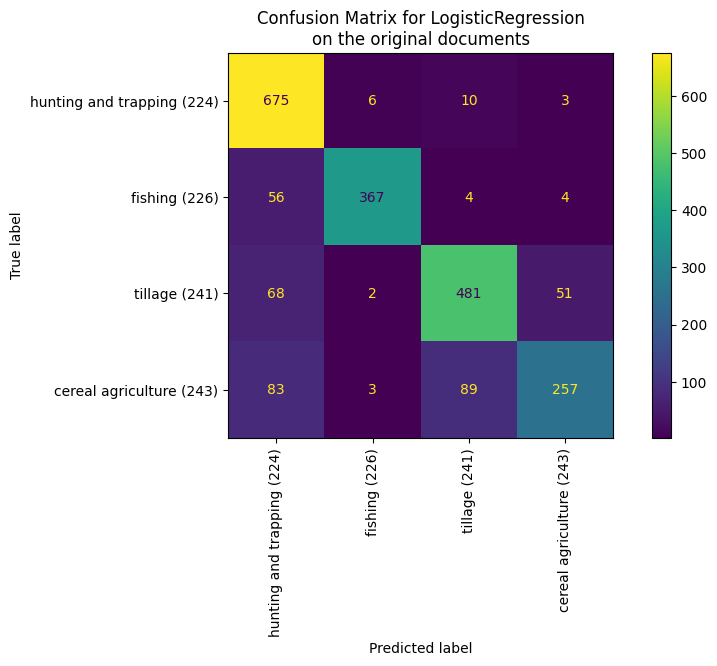

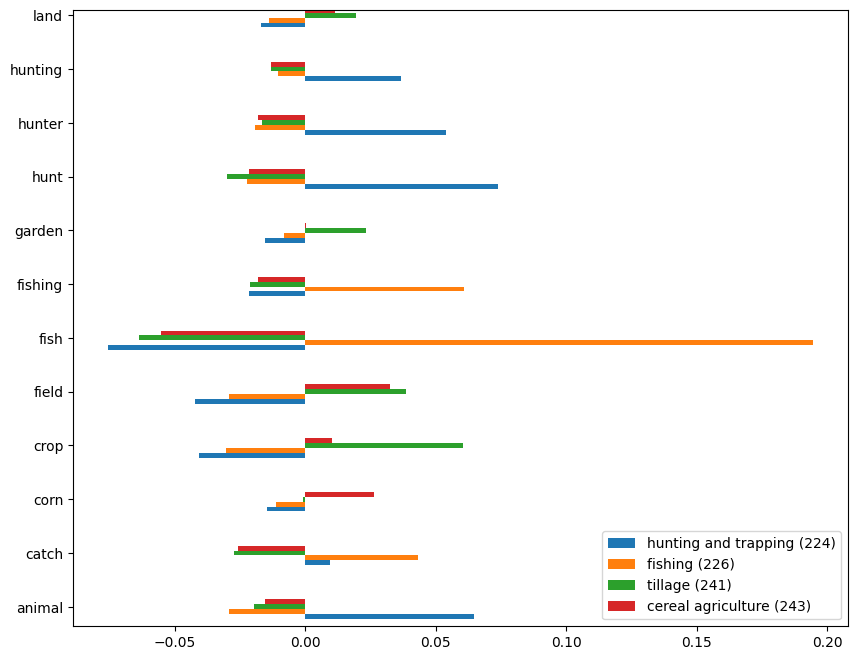

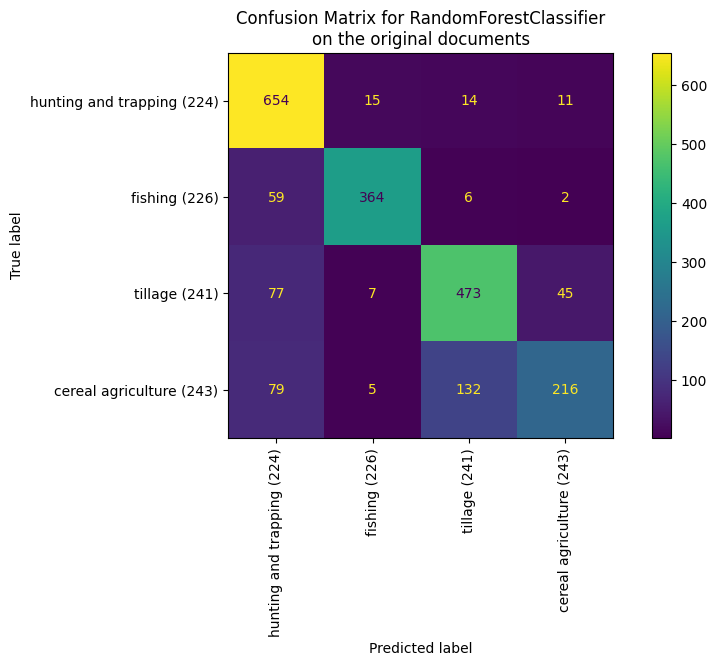

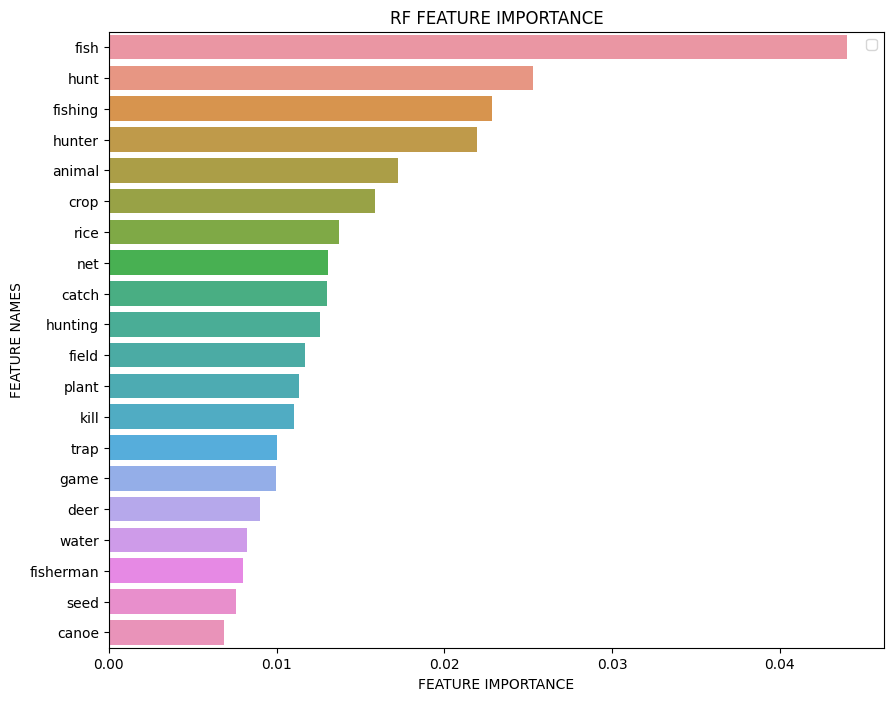

In [14]:
df = run(models=['LR', 'RF'], chosen_categories=[224, 226, 241, 243])

In [16]:
related_to_best = get_related_words(['fish', 'fishing', 'water', 'bait', 'herring', 'food', 'hunter', 'hunt', 'animal'])

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## None LR 

########## Training LogisticRegression

########## 0.77674849467346


########## None RF 

########## Training RandomForestClassifier

########## 0.7322834645669292


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


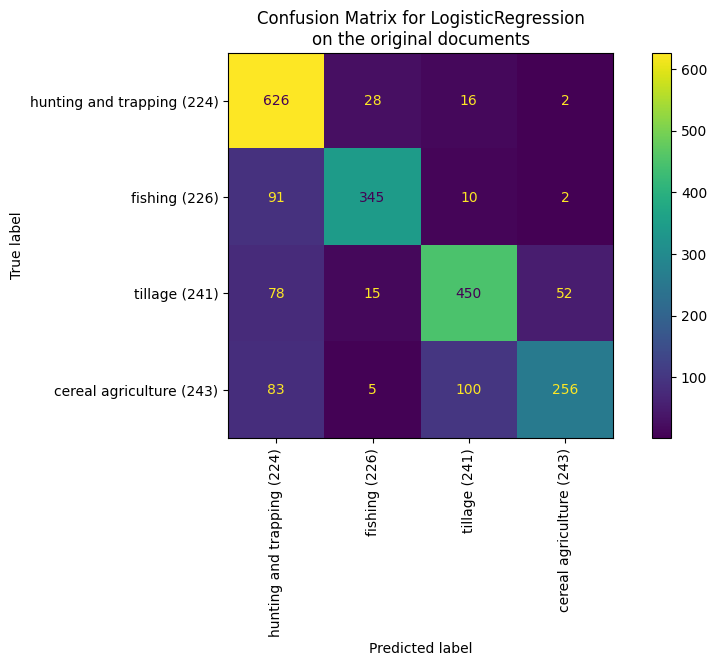

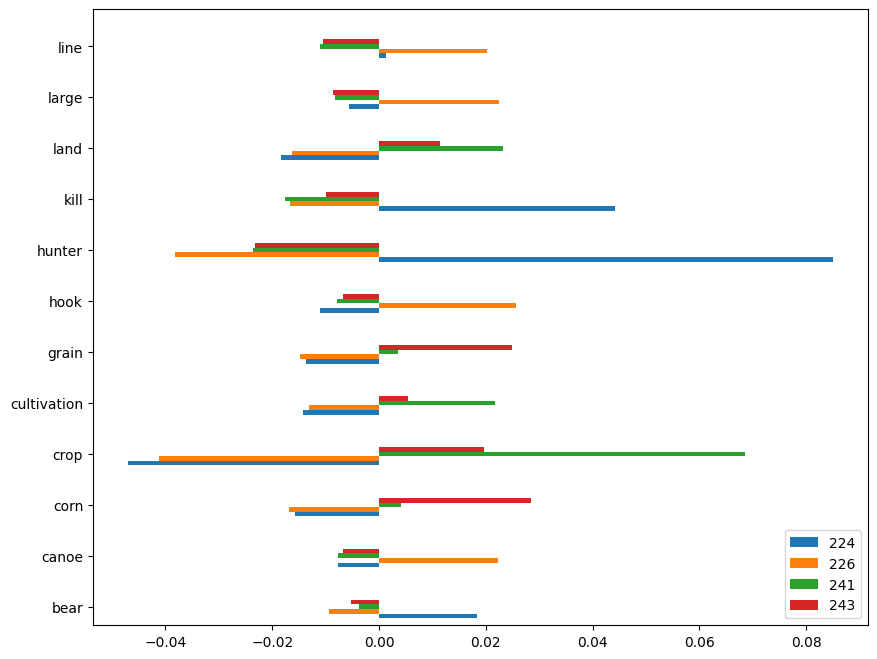

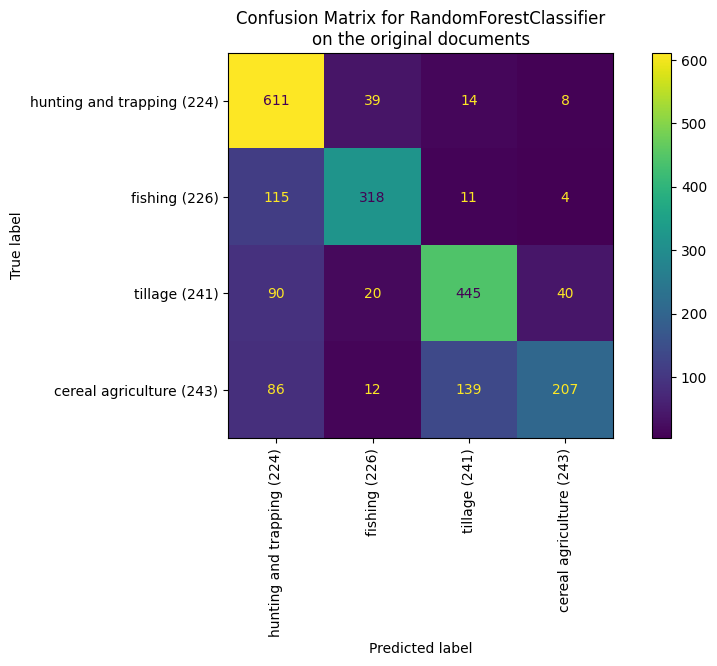

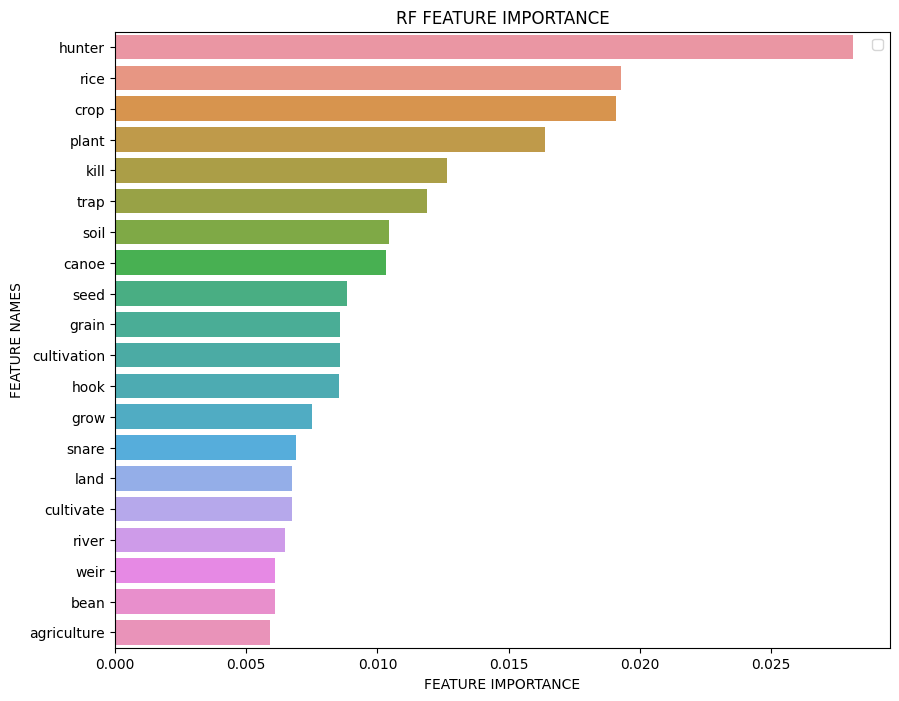

In [11]:
df = run(models=['LR', 'RF'], chosen_categories=[224, 226, 241, 243], exclude=related_to_best)

In [53]:
top_indicators

{'animal',
 'bait',
 'basket',
 'beach',
 'bear',
 'boat',
 'buffalo',
 'camp',
 'canoe',
 'cast',
 'catch',
 'coast',
 'crab',
 'dam',
 'deep',
 'deer',
 'dog',
 'eel',
 'fish',
 'fisherman',
 'fishing',
 'float',
 'form',
 'game',
 'ground',
 'hand',
 'herd',
 'his',
 'hold',
 'hook',
 'horse',
 'hunt',
 'hunter',
 'hunting',
 'kill',
 'lagoon',
 'lake',
 'large',
 'line',
 'long',
 'low',
 'meat',
 'method',
 'net',
 'night',
 'place',
 'pool',
 'reef',
 'river',
 'rock',
 'rod',
 'salmon',
 'school',
 'scoop',
 'sea',
 'shallow',
 'shark',
 'shoot',
 'shore',
 'skin',
 'small',
 'snare',
 'spear',
 'stone',
 'stream',
 'surface',
 'they',
 'tide',
 'trap',
 'trout',
 'use',
 'water',
 'weir',
 'wild',
 'woman'}

# Cat vs subcategories (binary classification)

In [63]:
r = defaultdict(defaultdict)


Iteration 1
Exclude: set()



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 48.901s at 0.079MB/s
n_samples: 6973, n_features: 4938
n_samples: 1744, n_features: 4938


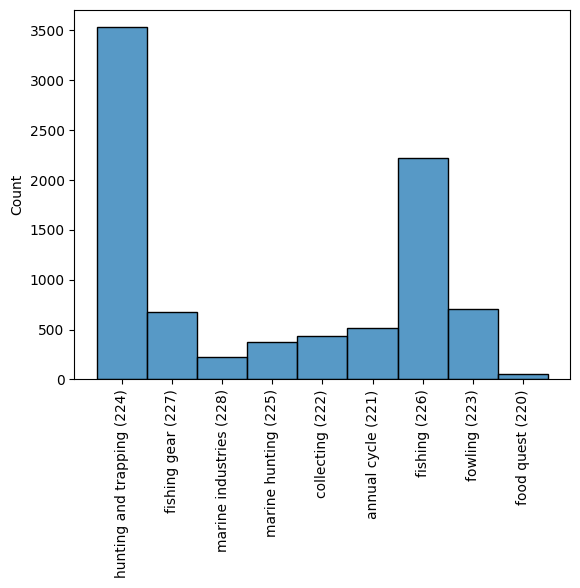

########## None LR 

########## Training LogisticRegression

########## 0.8910550458715596
              precision    recall  f1-score   support

         220      0.876     0.955     0.914      1054
         224      0.921     0.793     0.852       690

    accuracy                          0.891      1744
   macro avg      0.898     0.874     0.883      1744
weighted avg      0.894     0.891     0.889      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



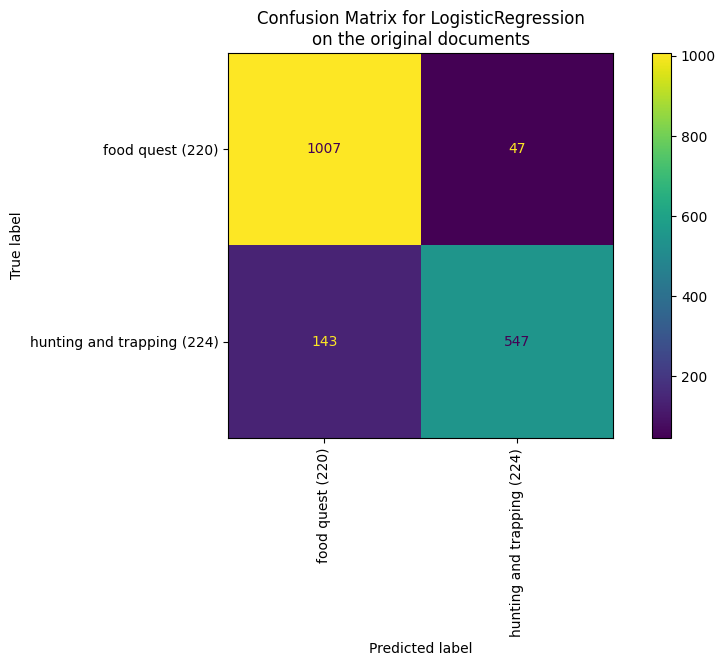

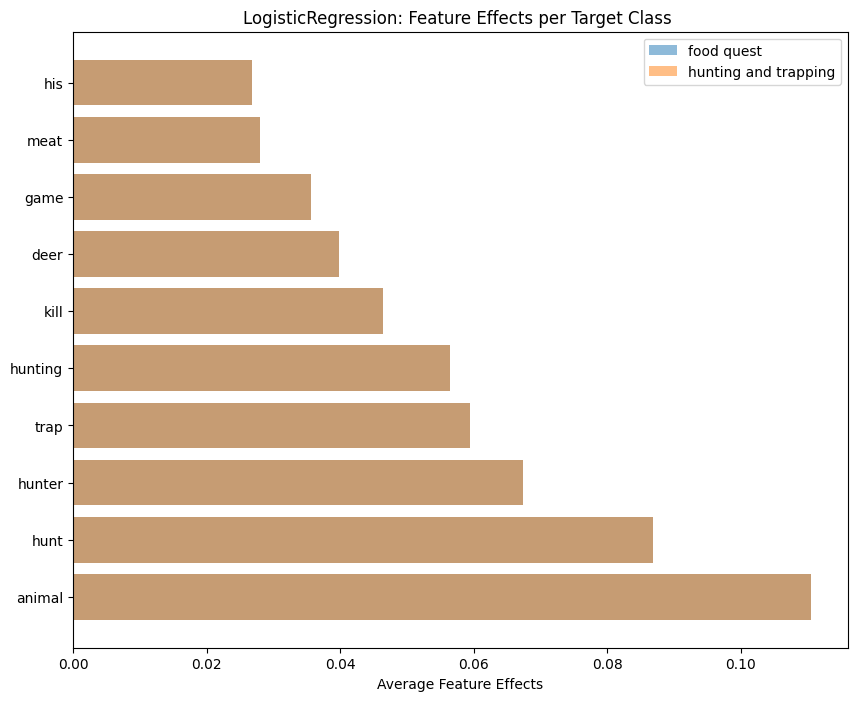

########## None SVM 

########## Training LinearSVC

########## 0.8841743119266054
              precision    recall  f1-score   support

         220      0.873     0.946     0.908      1054
         224      0.905     0.790     0.844       690

    accuracy                          0.884      1744
   macro avg      0.889     0.868     0.876      1744
weighted avg      0.886     0.884     0.883      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



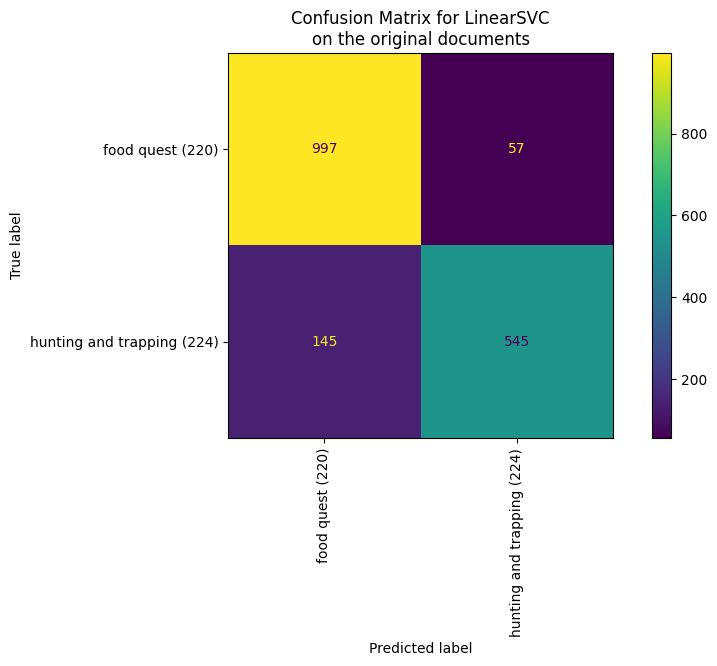

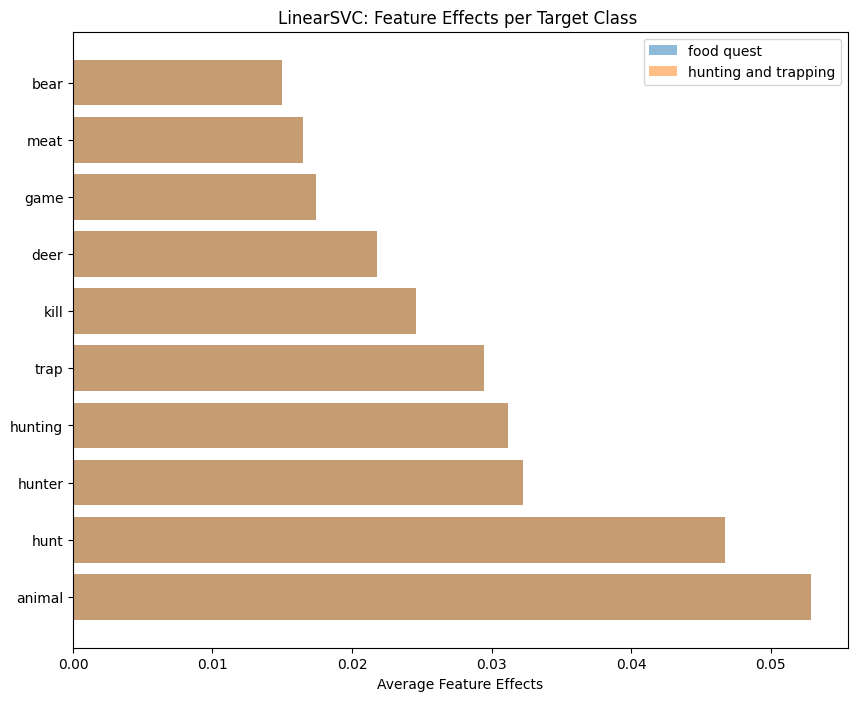

########## None RF 

########## Training RandomForestClassifier

########## 0.8715596330275229
              precision    recall  f1-score   support

         220      0.876     0.917     0.896      1054
         224      0.864     0.801     0.832       690

    accuracy                          0.872      1744
   macro avg      0.870     0.859     0.864      1744
weighted avg      0.871     0.872     0.871      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


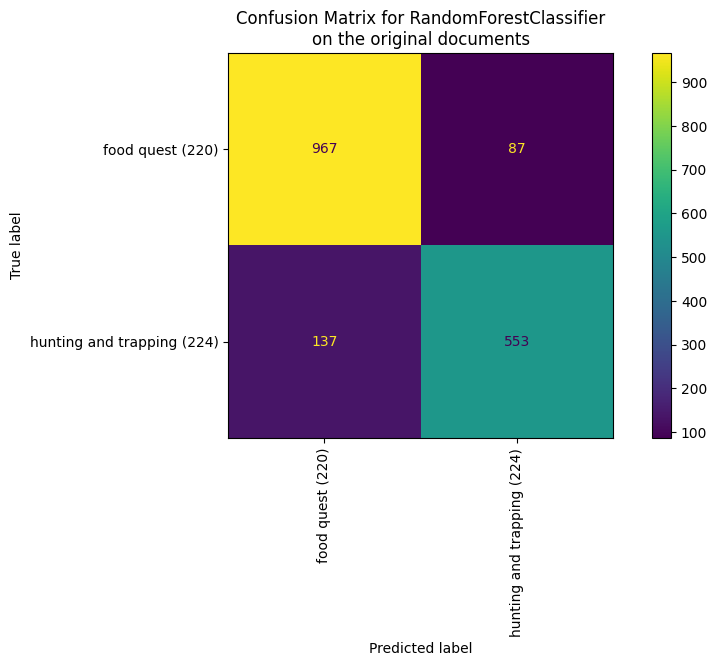

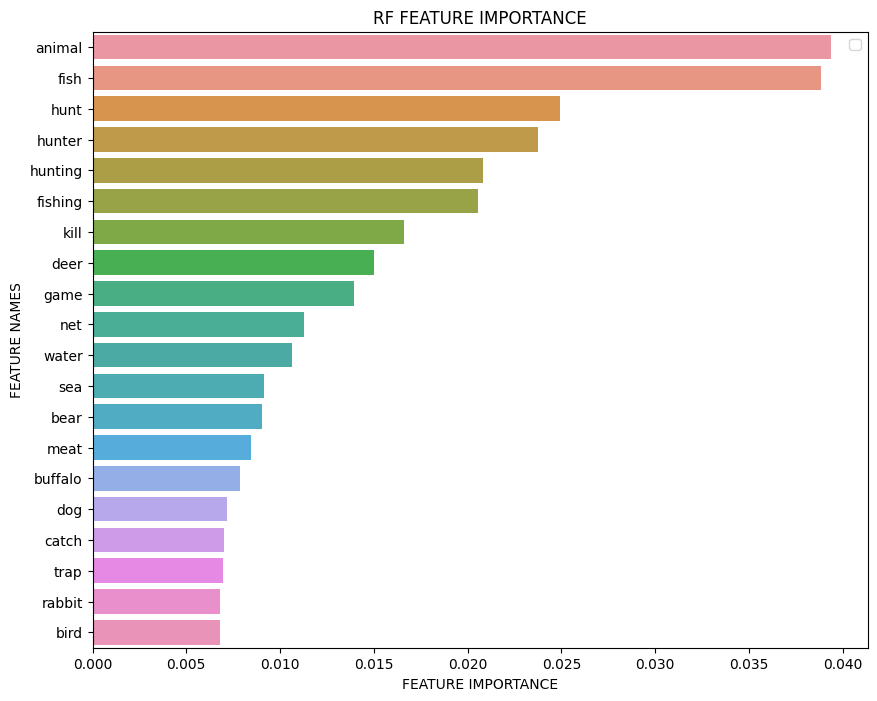

Iteration 2
Exclude: {'animal', 'meat', 'catch', 'fishing', 'net', 'bear', 'water', 'kill', 'hunt', 'sea', 'his', 'deer', 'buffalo', 'hunter', 'dog', 'fish', 'hunting', 'game', 'rabbit', 'bird', 'trap'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 58.195s at 0.066MB/s
n_samples: 6973, n_features: 4899
n_samples: 1744, n_features: 4899


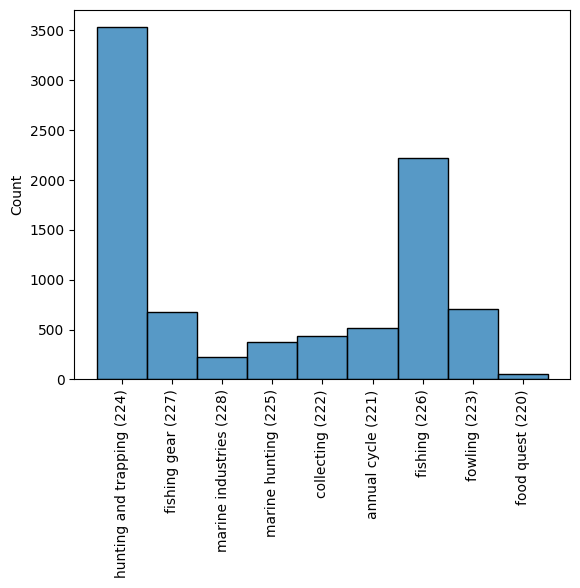

########## None LR 

########## Training LogisticRegression

########## 0.8560779816513762
              precision    recall  f1-score   support

         220      0.843     0.935     0.887      1054
         224      0.882     0.735     0.802       690

    accuracy                          0.856      1744
   macro avg      0.863     0.835     0.844      1744
weighted avg      0.859     0.856     0.853      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



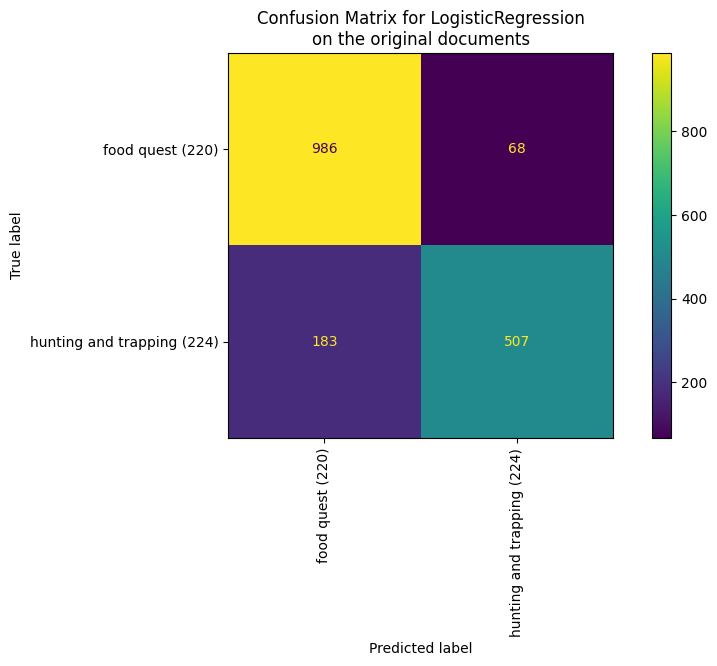

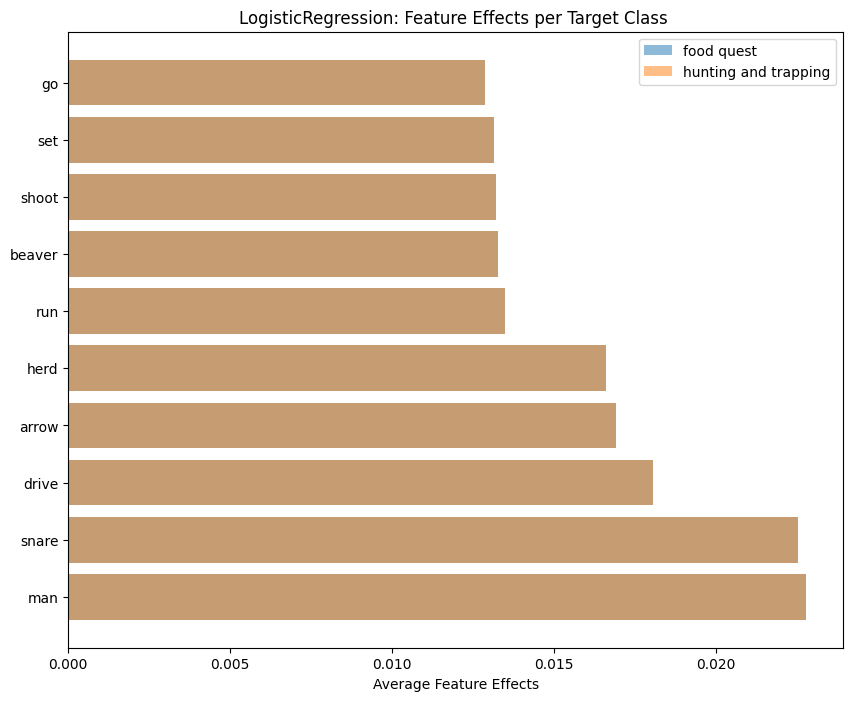

########## None SVM 

########## Training LinearSVC

########## 0.8520642201834863
              precision    recall  f1-score   support

         220      0.859     0.904     0.881      1054
         224      0.841     0.772     0.805       690

    accuracy                          0.852      1744
   macro avg      0.850     0.838     0.843      1744
weighted avg      0.851     0.852     0.851      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



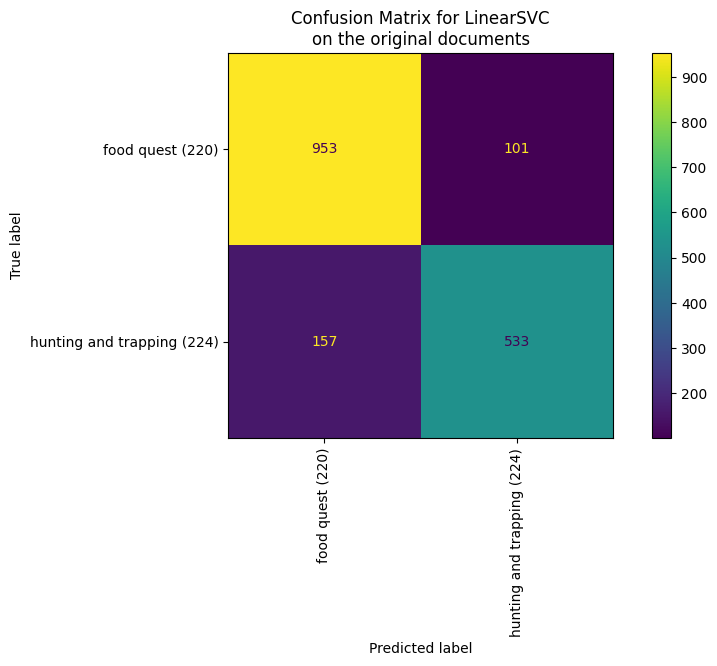

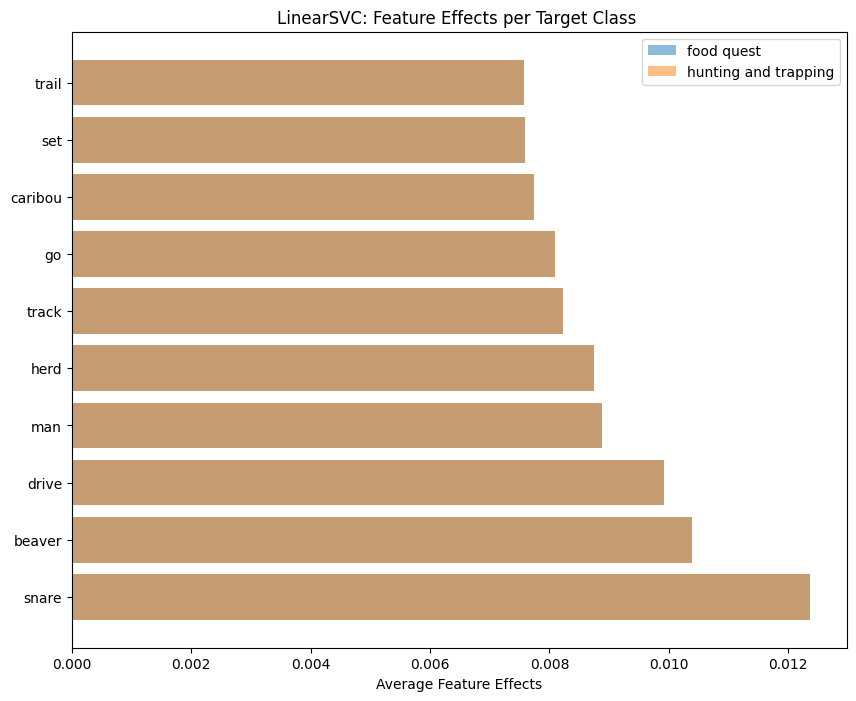

########## None RF 

########## Training RandomForestClassifier

########## 0.8342889908256881
              precision    recall  f1-score   support

         220      0.833     0.907     0.869      1054
         224      0.836     0.723     0.775       690

    accuracy                          0.834      1744
   macro avg      0.835     0.815     0.822      1744
weighted avg      0.834     0.834     0.832      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


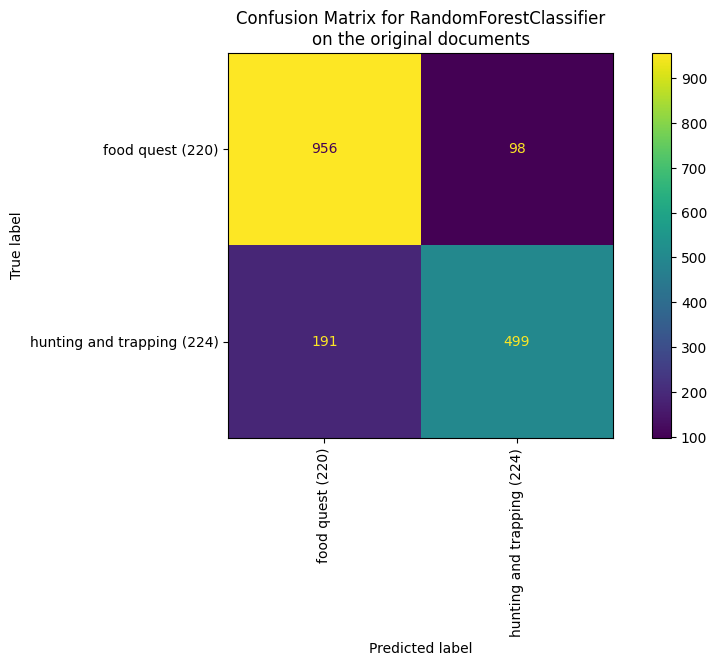

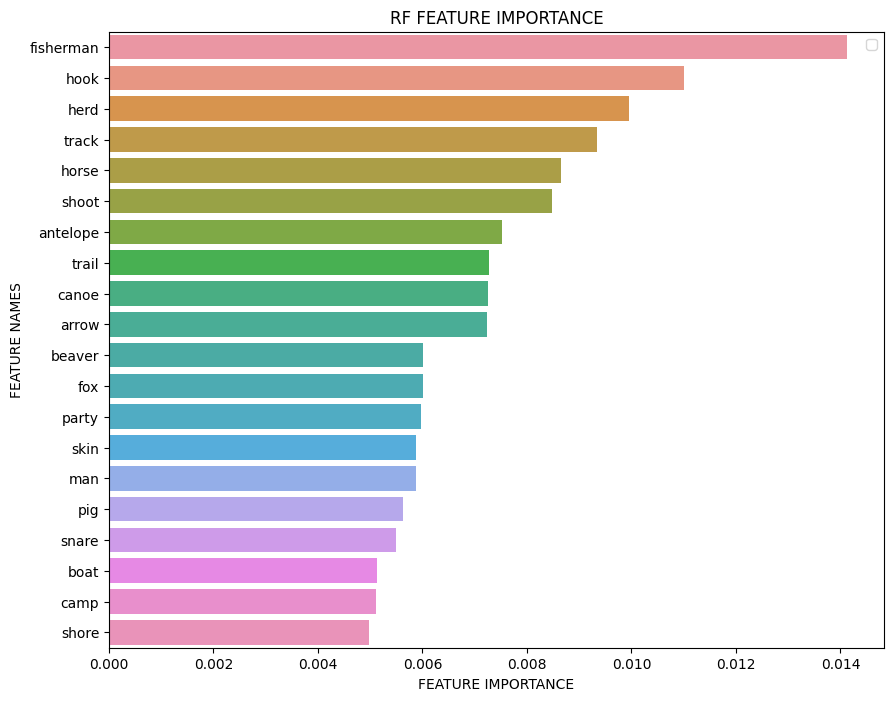

Iteration 3
Exclude: {'animal', 'herd', 'meat', 'party', 'fishing', 'horse', 'run', 'net', 'caribou', 'track', 'trail', 'kill', 'fisherman', 'beaver', 'canoe', 'hunt', 'sea', 'buffalo', 'dog', 'fish', 'arrow', 'snare', 'hunting', 'camp', 'drive', 'bird', 'trap', 'hook', 'catch', 'antelope', 'bear', 'water', 'pig', 'shoot', 'his', 'deer', 'shore', 'man', 'hunter', 'skin', 'go', 'fox', 'game', 'rabbit', 'boat', 'set'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 60.891s at 0.063MB/s
n_samples: 6973, n_features: 4861
n_samples: 1744, n_features: 4861


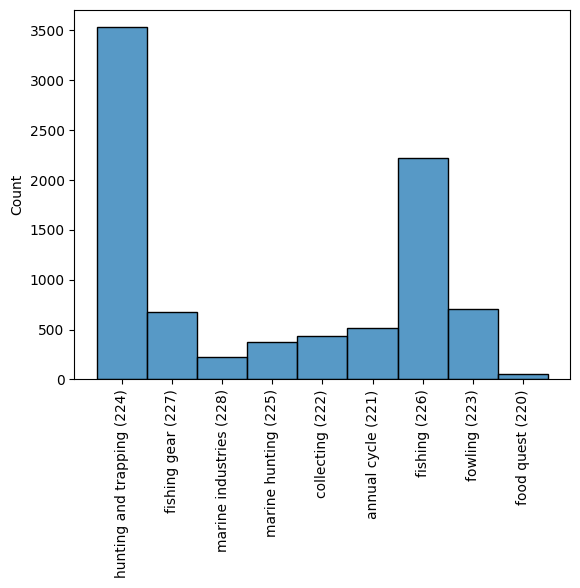

########## None LR 

########## Training LogisticRegression

########## 0.8239678899082569
              precision    recall  f1-score   support

         220      0.805     0.928     0.862      1035
         224      0.864     0.673     0.757       709

    accuracy                          0.824      1744
   macro avg      0.835     0.800     0.809      1744
weighted avg      0.829     0.824     0.819      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



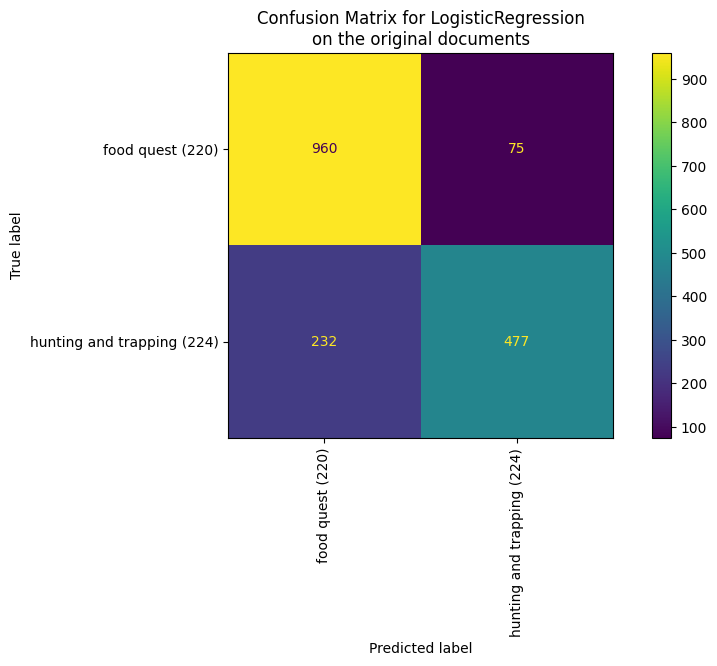

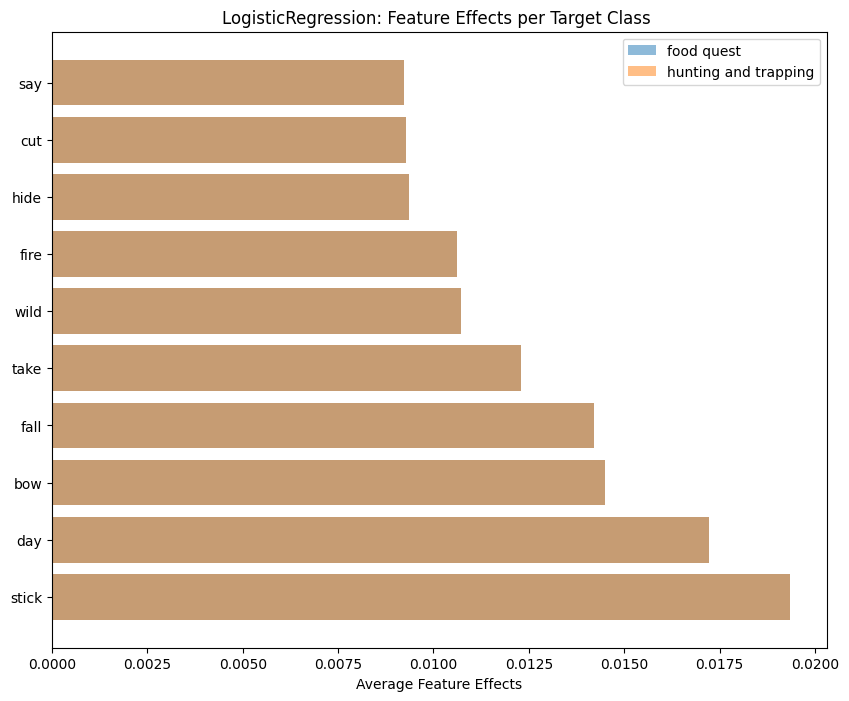

########## None SVM 

########## Training LinearSVC

########## 0.8239678899082569
              precision    recall  f1-score   support

         220      0.826     0.892     0.857      1035
         224      0.821     0.725     0.770       709

    accuracy                          0.824      1744
   macro avg      0.823     0.808     0.814      1744
weighted avg      0.824     0.824     0.822      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



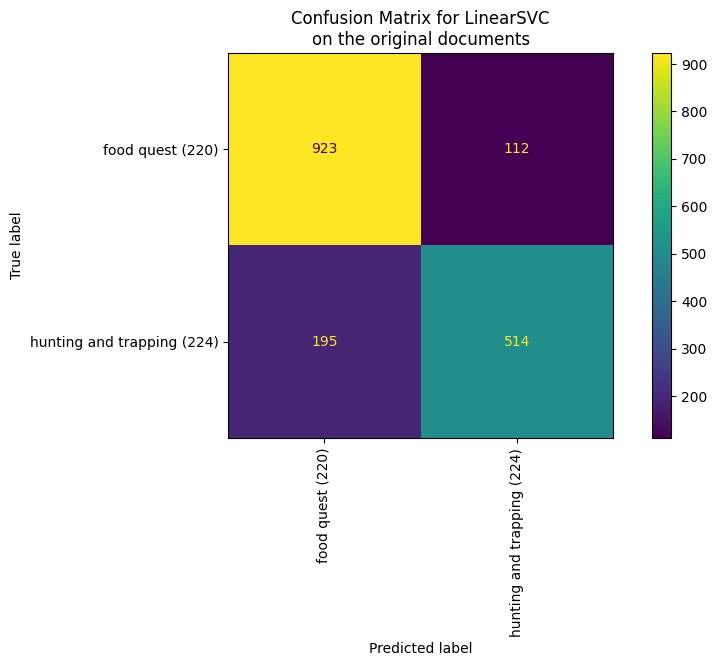

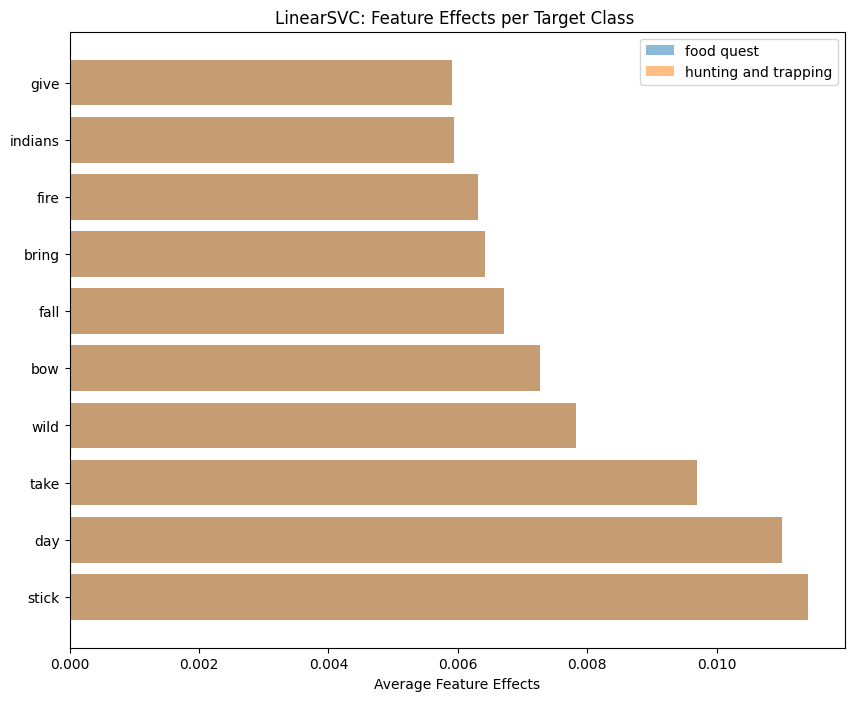

########## None RF 

########## Training RandomForestClassifier

########## 0.7958715596330275
              precision    recall  f1-score   support

         220      0.784     0.906     0.841      1035
         224      0.823     0.635     0.717       709

    accuracy                          0.796      1744
   macro avg      0.803     0.770     0.779      1744
weighted avg      0.799     0.796     0.790      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


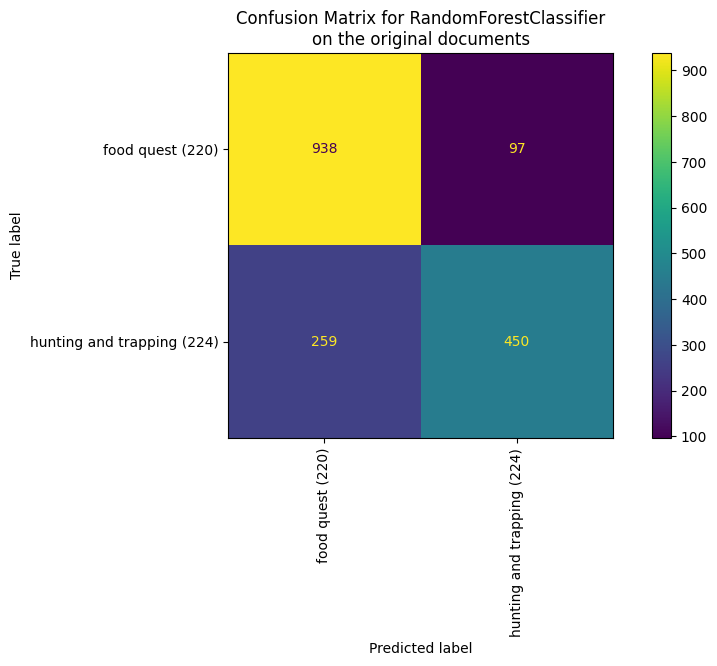

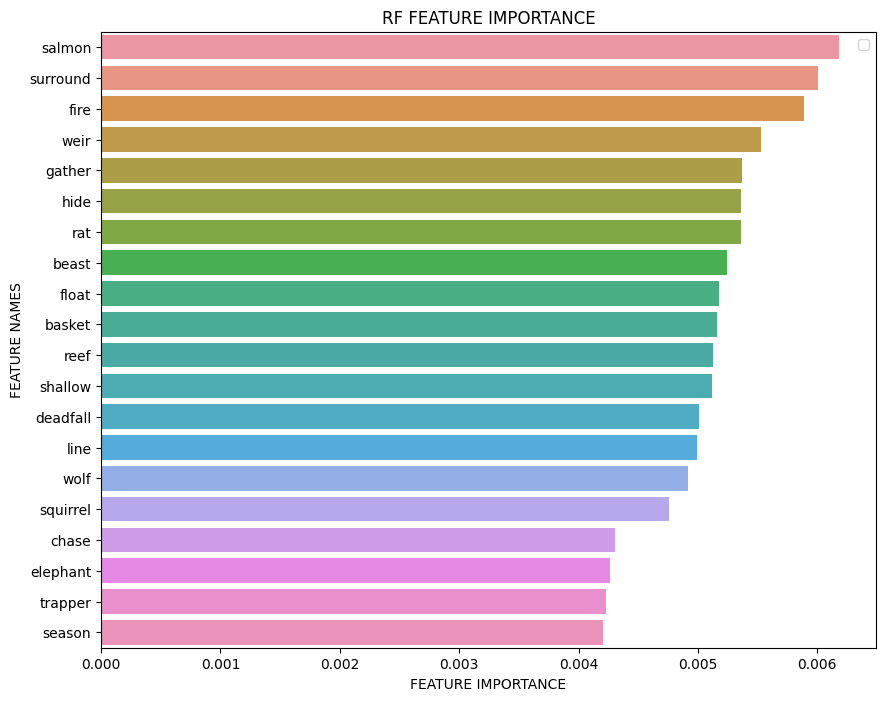

Iteration 1
Exclude: {'animal', 'party', 'run', 'net', 'fisherman', 'wolf', 'reef', 'beaver', 'bow', 'canoe', 'hunt', 'sea', 'shallow', 'say', 'dog', 'fish', 'fall', 'wild', 'give', 'drive', 'chase', 'season', 'take', 'stick', 'catch', 'water', 'shoot', 'day', 'man', 'skin', 'go', 'basket', 'beast', 'boat', 'salmon', 'set', 'trapper', 'herd', 'meat', 'hide', 'float', 'fishing', 'horse', 'caribou', 'track', 'trail', 'kill', 'bring', 'buffalo', 'rat', 'arrow', 'fire', 'snare', 'hunting', 'camp', 'bird', 'trap', 'gather', 'hook', 'deadfall', 'antelope', 'cut', 'bear', 'pig', 'weir', 'his', 'deer', 'shore', 'elephant', 'line', 'indians', 'hunter', 'surround', 'squirrel', 'fox', 'game', 'rabbit'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 68.108s at 0.057MB/s
n_samples: 6973, n_features: 4819
n_samples: 1744, n_features: 4819


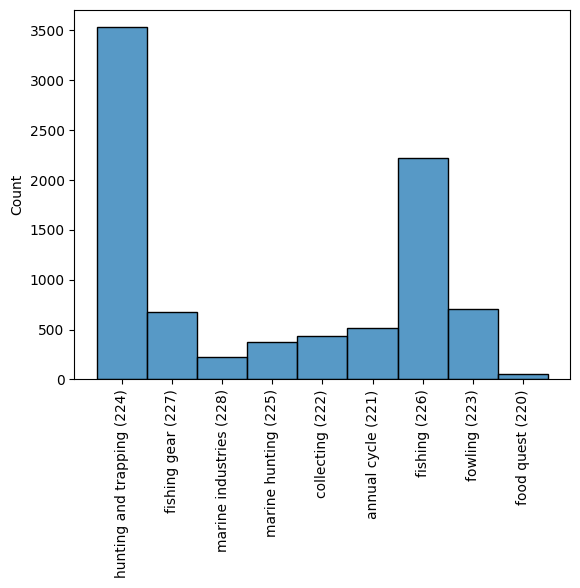

########## None LR 

########## Training LogisticRegression

########## 0.8239678899082569
              precision    recall  f1-score   support

         220      0.825     0.971     0.892      1309
         226      0.814     0.382     0.520       435

    accuracy                          0.824      1744
   macro avg      0.820     0.676     0.706      1744
weighted avg      0.822     0.824     0.799      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



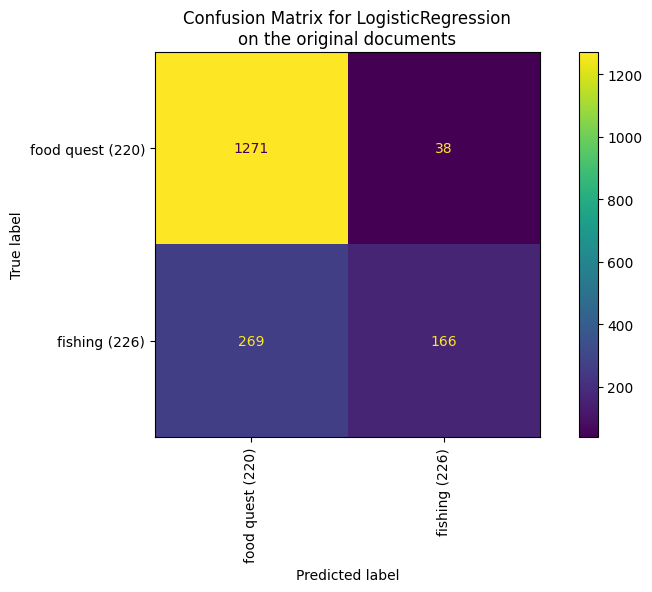

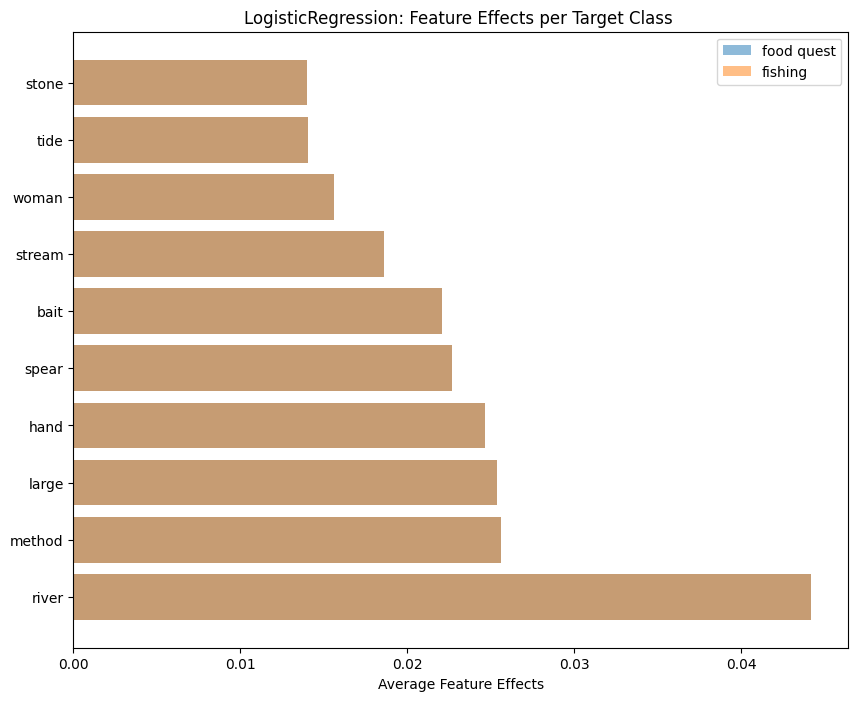

########## None SVM 

########## Training LinearSVC

########## 0.838302752293578
              precision    recall  f1-score   support

         220      0.864     0.931     0.896      1309
         226      0.730     0.559     0.633       435

    accuracy                          0.838      1744
   macro avg      0.797     0.745     0.765      1744
weighted avg      0.830     0.838     0.831      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



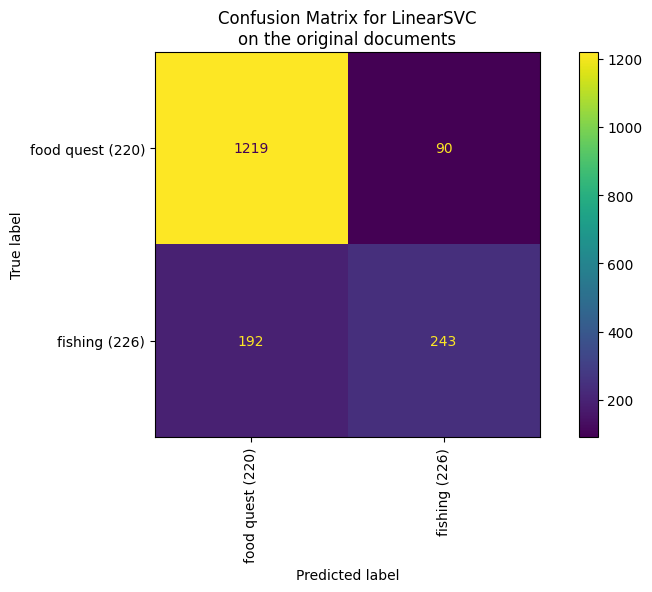

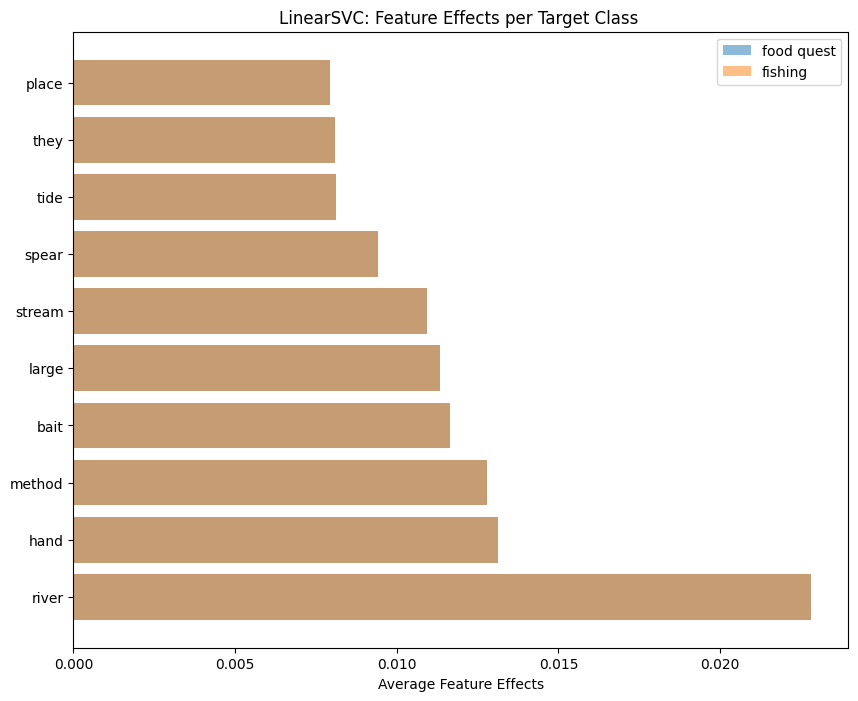

########## None RF 

########## Training RandomForestClassifier

########## 0.8130733944954128
              precision    recall  f1-score   support

         220      0.822     0.958     0.885      1309
         226      0.749     0.377     0.502       435

    accuracy                          0.813      1744
   macro avg      0.786     0.667     0.693      1744
weighted avg      0.804     0.813     0.789      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


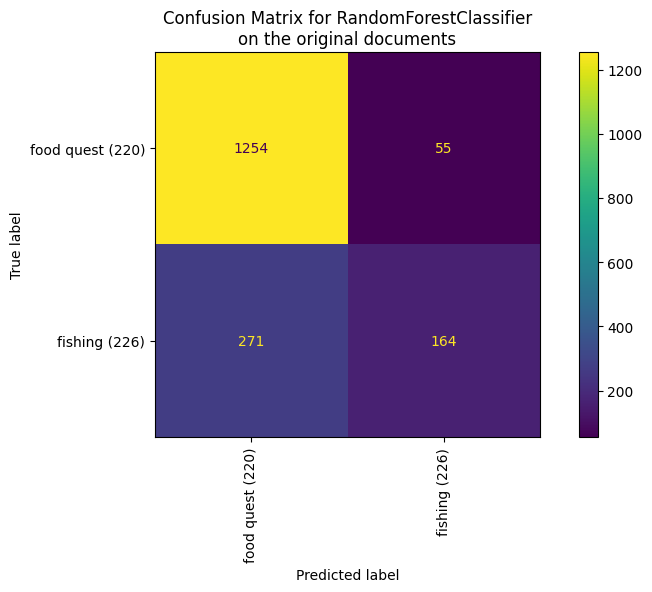

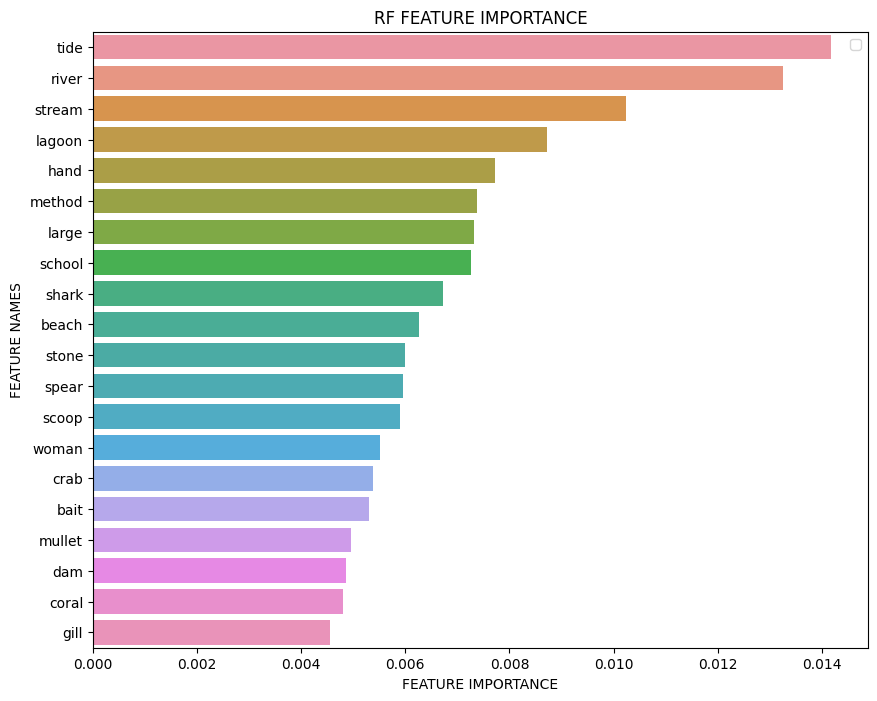

Iteration 2
Exclude: {'animal', 'party', 'run', 'net', 'fisherman', 'wolf', 'reef', 'beaver', 'bow', 'scoop', 'canoe', 'lagoon', 'hunt', 'sea', 'shallow', 'say', 'dog', 'fish', 'fall', 'hand', 'wild', 'tide', 'give', 'spear', 'drive', 'chase', 'season', 'take', 'stick', 'coral', 'catch', 'water', 'shoot', 'crab', 'day', 'school', 'man', 'skin', 'go', 'basket', 'beast', 'boat', 'salmon', 'set', 'trapper', 'shark', 'stream', 'place', 'they', 'herd', 'meat', 'hide', 'float', 'fishing', 'horse', 'caribou', 'track', 'trail', 'woman', 'kill', 'dam', 'bring', 'stone', 'mullet', 'buffalo', 'rat', 'arrow', 'fire', 'snare', 'hunting', 'camp', 'bird', 'trap', 'gather', 'hook', 'gill', 'deadfall', 'antelope', 'cut', 'bear', 'pig', 'weir', 'his', 'deer', 'shore', 'elephant', 'line', 'method', 'indians', 'hunter', 'surround', 'squirrel', 'beach', 'fox', 'game', 'rabbit', 'river', 'large', 'bait'}



C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 72.585s at 0.053MB/s
n_samples: 6973, n_features: 4790
n_samples: 1744, n_features: 4790


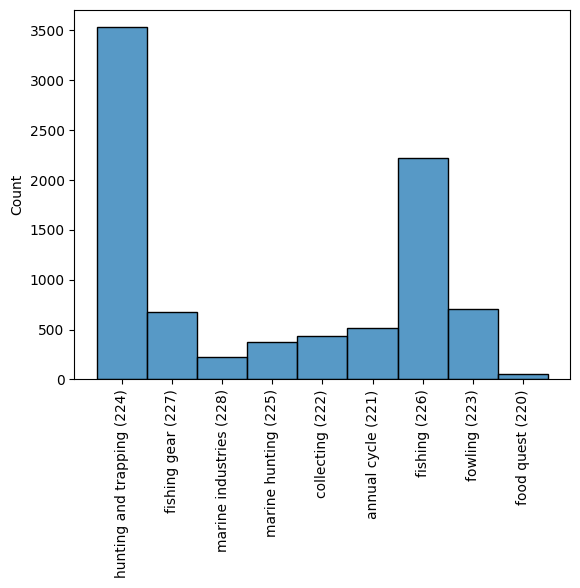

########## None LR 

########## Training LogisticRegression

########## 0.8061926605504587
              precision    recall  f1-score   support

         220      0.808     0.974     0.883      1312
         226      0.790     0.296     0.431       432

    accuracy                          0.806      1744
   macro avg      0.799     0.635     0.657      1744
weighted avg      0.803     0.806     0.771      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



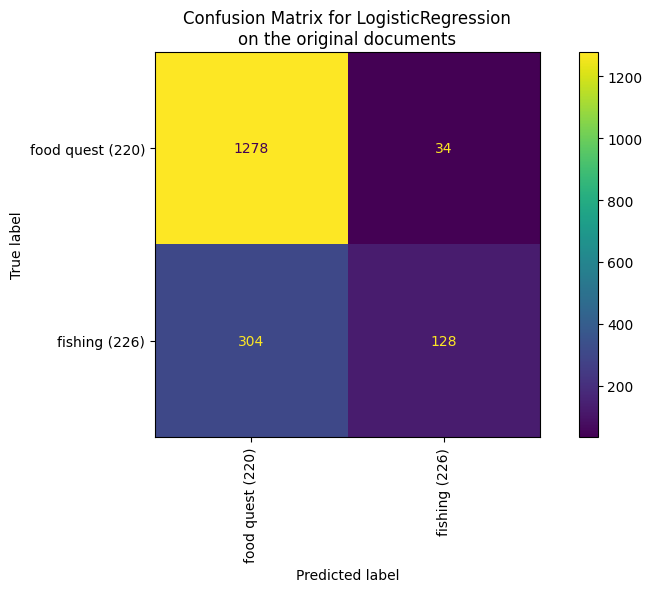

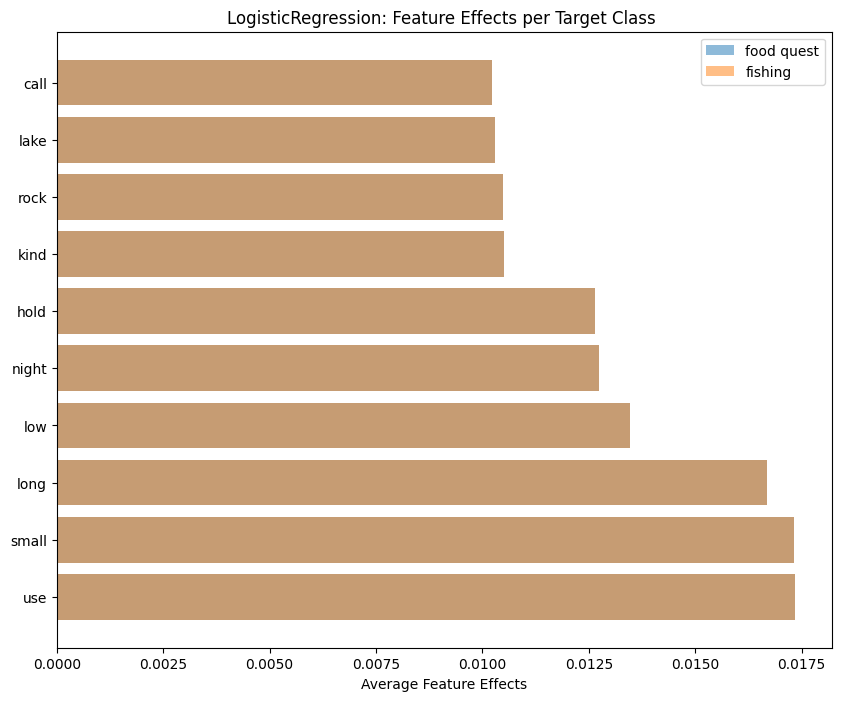

########## None SVM 

########## Training LinearSVC

########## 0.8182339449541285
              precision    recall  f1-score   support

         220      0.846     0.927     0.885      1312
         226      0.687     0.488     0.571       432

    accuracy                          0.818      1744
   macro avg      0.767     0.708     0.728      1744
weighted avg      0.807     0.818     0.807      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



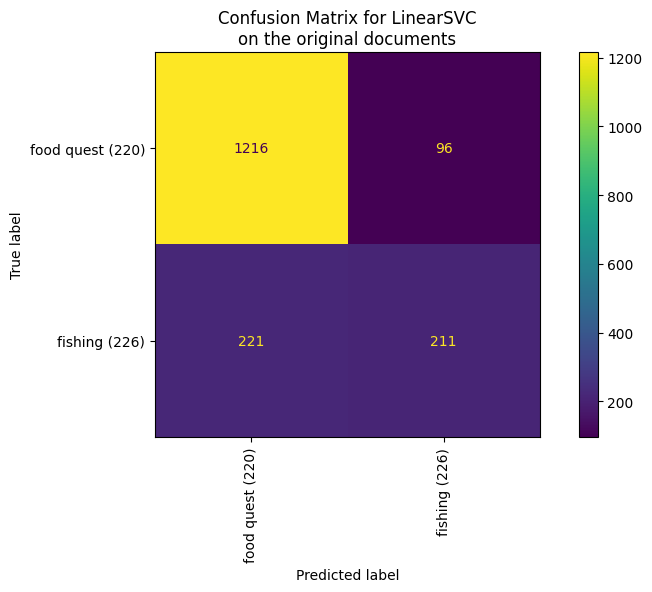

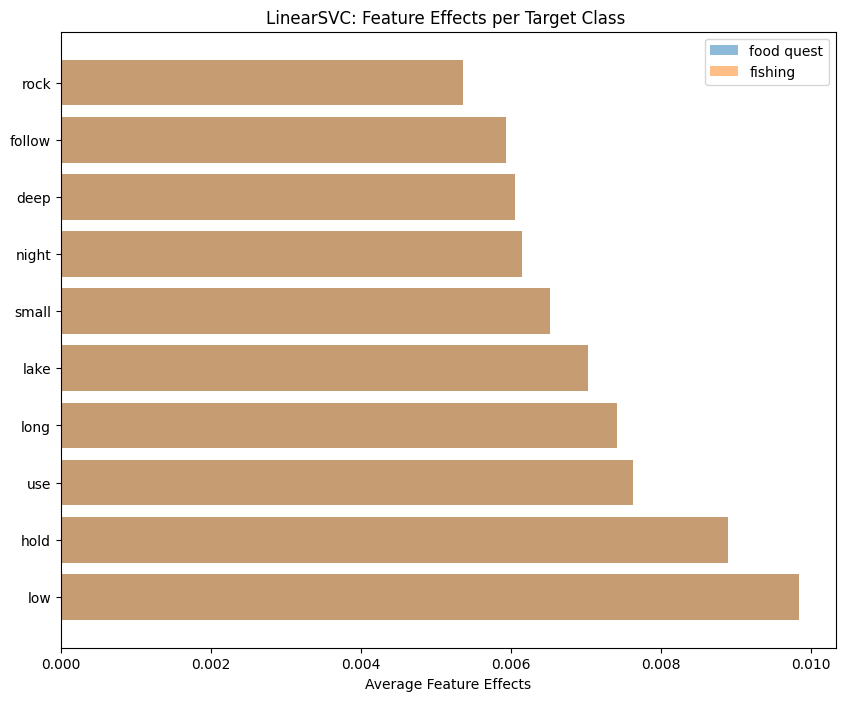

########## None RF 

########## Training RandomForestClassifier

########## 0.8021788990825688
              precision    recall  f1-score   support

         220      0.809     0.965     0.880      1312
         226      0.743     0.308     0.435       432

    accuracy                          0.802      1744
   macro avg      0.776     0.636     0.658      1744
weighted avg      0.793     0.802     0.770      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


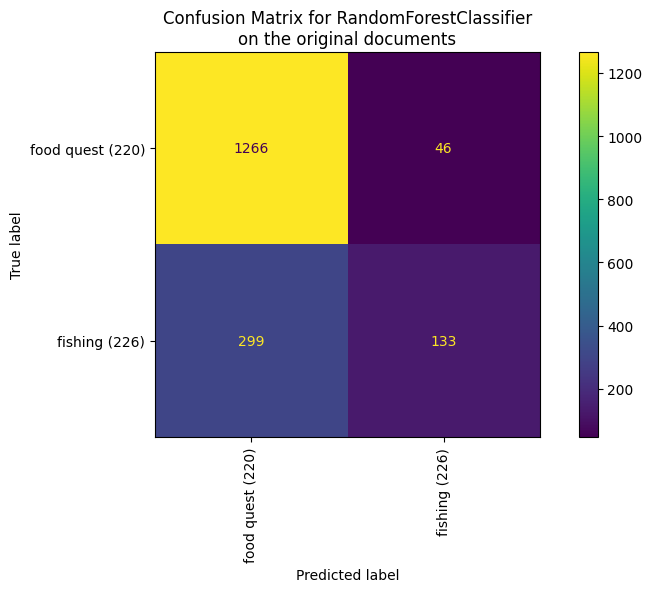

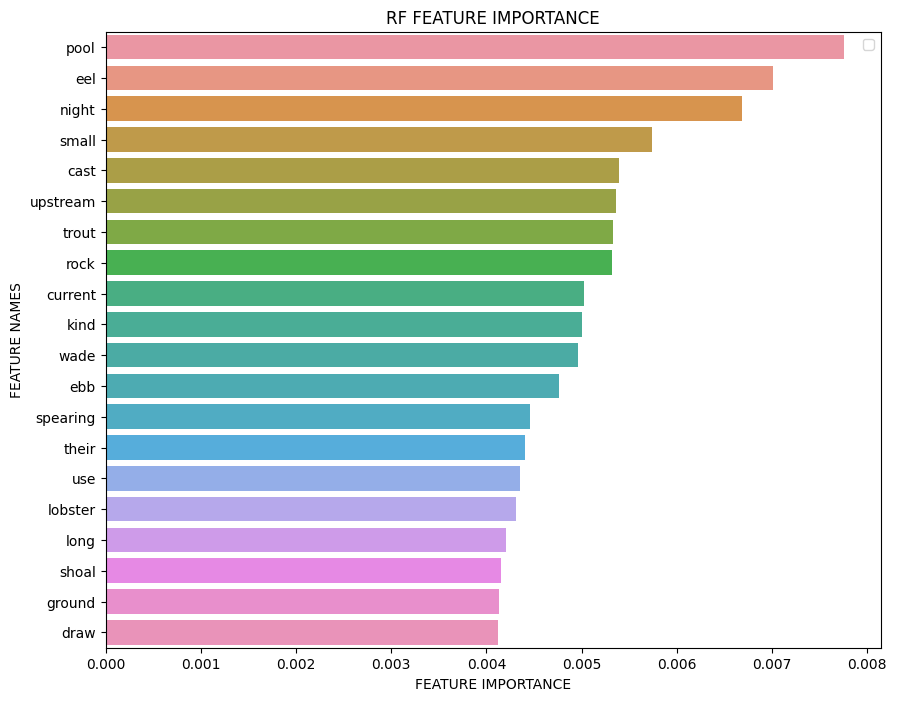

Iteration 3
Exclude: {'animal', 'party', 'run', 'net', 'fisherman', 'wolf', 'reef', 'upstream', 'beaver', 'bow', 'scoop', 'canoe', 'lagoon', 'hunt', 'sea', 'shallow', 'say', 'dog', 'fish', 'fall', 'hand', 'wild', 'tide', 'cast', 'small', 'pool', 'give', 'spear', 'eel', 'drive', 'chase', 'season', 'wade', 'take', 'current', 'stick', 'coral', 'hold', 'catch', 'deep', 'water', 'low', 'shoot', 'crab', 'day', 'school', 'man', 'skin', 'shoal', 'go', 'lobster', 'basket', 'beast', 'boat', 'follow', 'salmon', 'lake', 'set', 'trapper', 'shark', 'stream', 'place', 'they', 'herd', 'meat', 'hide', 'float', 'fishing', 'horse', 'caribou', 'track', 'trail', 'woman', 'kill', 'dam', 'ebb', 'bring', 'their', 'kind', 'stone', 'mullet', 'buffalo', 'rat', 'arrow', 'night', 'fire', 'snare', 'hunting', 'camp', 'ground', 'use', 'bird', 'trap', 'gather', 'long', 'hook', 'gill', 'deadfall', 'antelope', 'cut', 'bear', 'pig', 'draw', 'weir', 'his', 'deer', 'shore', 'elephant', 'line', 'method', 'trout', 'indians',

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 86.722s at 0.044MB/s
n_samples: 6973, n_features: 4761
n_samples: 1744, n_features: 4761


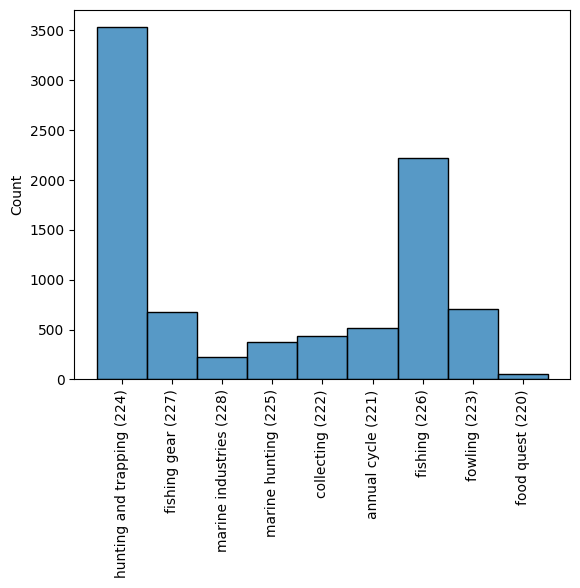

########## None LR 

########## Training LogisticRegression

########## 0.7981651376146789
              precision    recall  f1-score   support

         220      0.796     0.979     0.878      1296
         226      0.820     0.275     0.411       448

    accuracy                          0.798      1744
   macro avg      0.808     0.627     0.645      1744
weighted avg      0.802     0.798     0.758      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



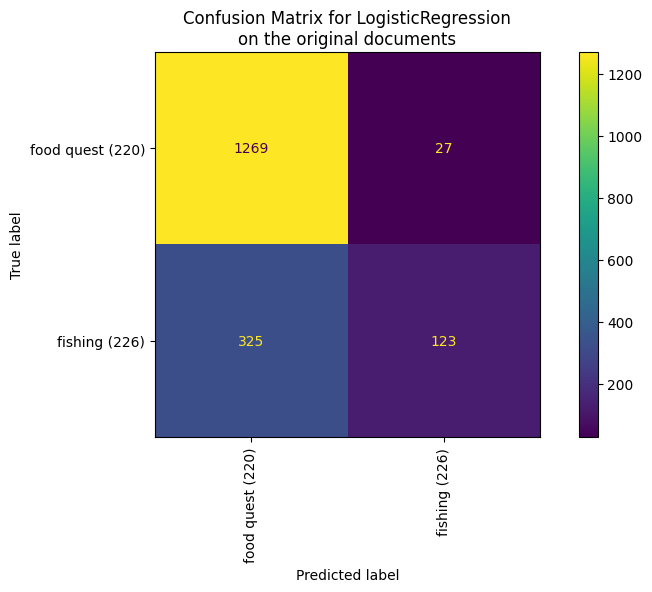

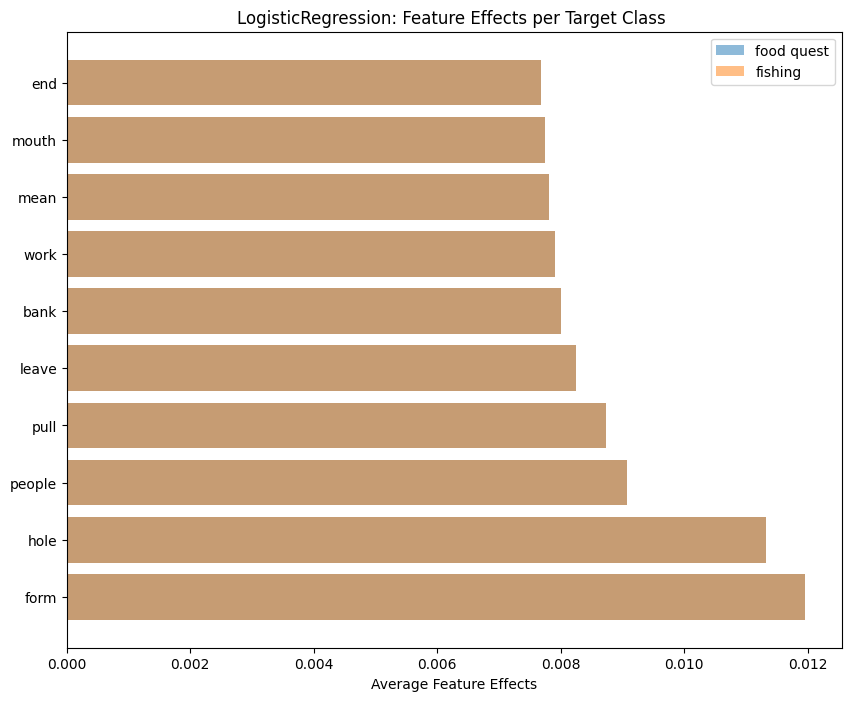

########## None SVM 

########## Training LinearSVC

########## 0.8079128440366973
              precision    recall  f1-score   support

         220      0.834     0.926     0.878      1296
         226      0.685     0.467     0.555       448

    accuracy                          0.808      1744
   macro avg      0.760     0.696     0.716      1744
weighted avg      0.796     0.808     0.795      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



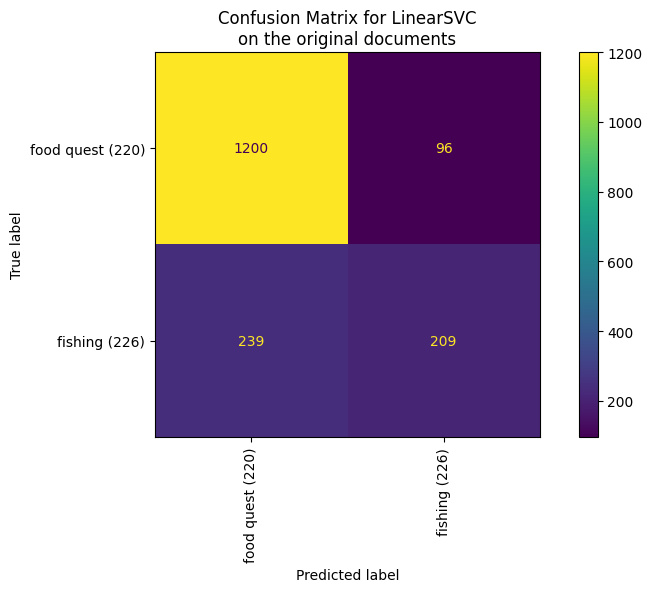

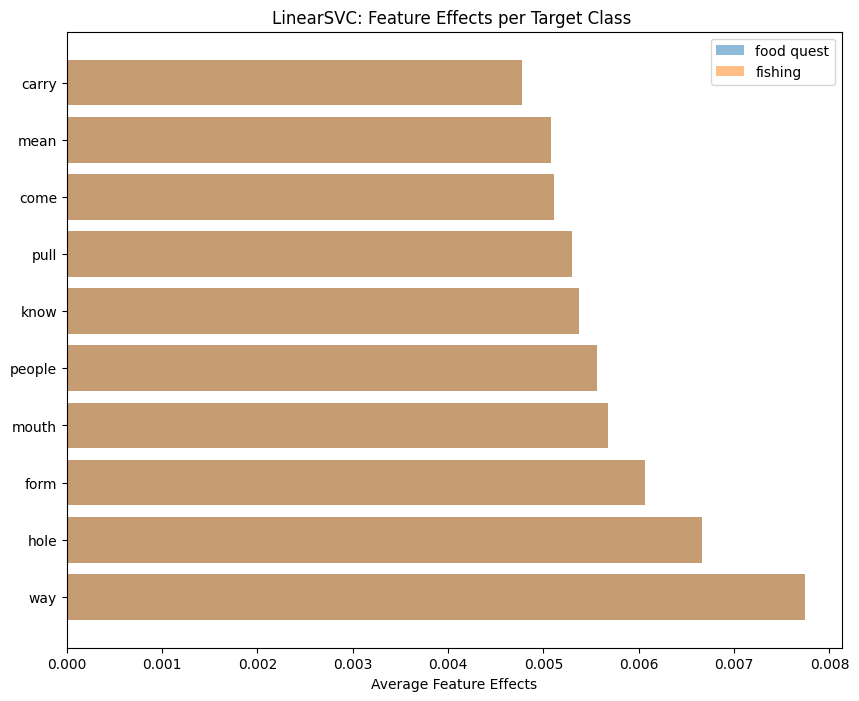

########## None RF 

########## Training RandomForestClassifier

########## 0.7861238532110092
              precision    recall  f1-score   support

         220      0.801     0.947     0.868      1296
         226      0.676     0.321     0.436       448

    accuracy                          0.786      1744
   macro avg      0.739     0.634     0.652      1744
weighted avg      0.769     0.786     0.757      1744



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


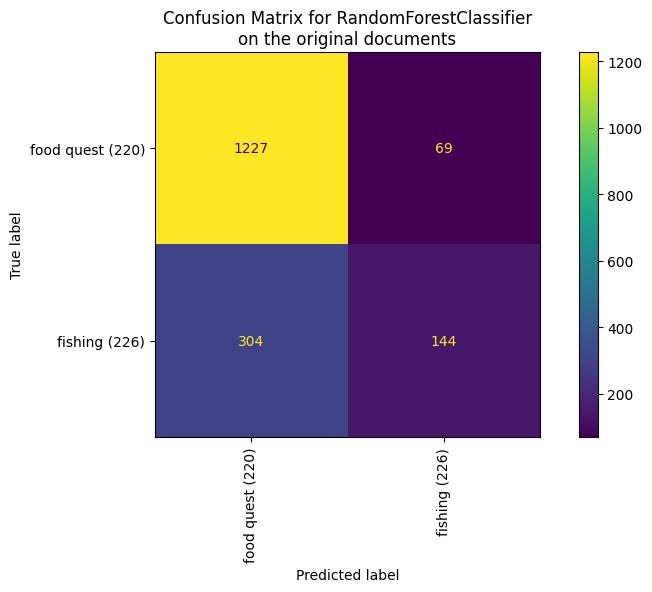

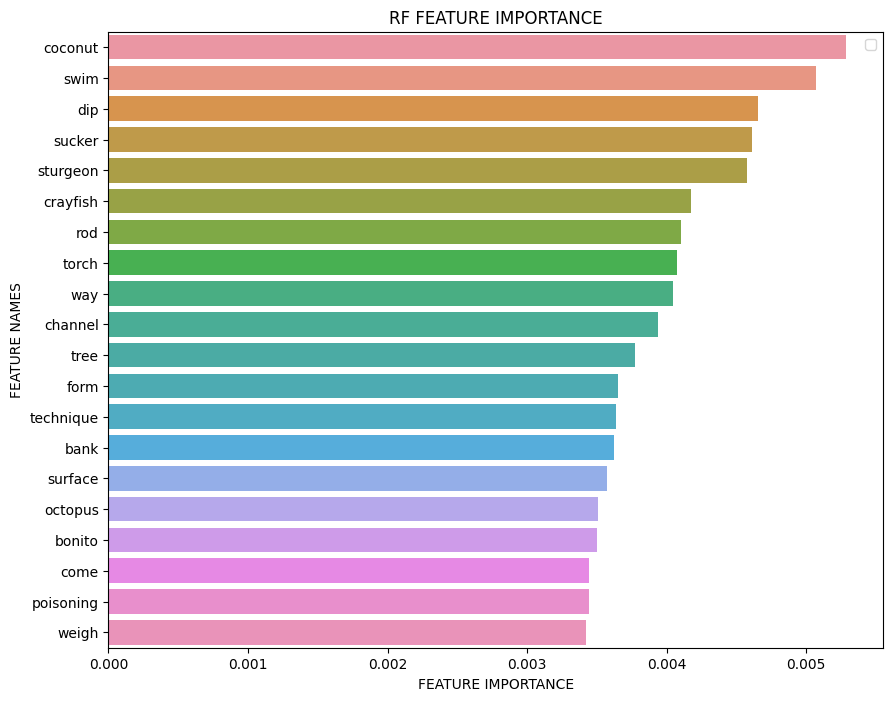

Iteration 1
Exclude: {'beaver', 'bow', 'scoop', 'canoe', 'hunt', 'sea', 'shallow', 'say', 'cast', 'fall', 'hand', 'wild', 'pool', 'give', 'spear', 'season', 'take', 'sturgeon', 'end', 'catch', 'crab', 'day', 'people', 'skin', 'shoal', 'go', 'swim', 'basket', 'beast', 'boat', 'follow', 'salmon', 'lake', 'set', 'torch', 'trapper', 'shark', 'carry', 'they', 'herd', 'float', 'fishing', 'trail', 'bring', 'work', 'arrow', 'night', 'fire', 'snare', 'hunting', 'use', 'long', 'bear', 'draw', 'bank', 'weir', 'leave', 'deer', 'trout', 'form', 'hunter', 'squirrel', 'rabbit', 'large', 'spearing', 'bait', 'animal', 'party', 'rod', 'run', 'net', 'fisherman', 'wolf', 'reef', 'upstream', 'tree', 'lagoon', 'channel', 'dog', 'fish', 'tide', 'small', 'pull', 'eel', 'drive', 'bonito', 'chase', 'wade', 'stick', 'coral', 'hold', 'mouth', 'crayfish', 'deep', 'water', 'low', 'shoot', 'know', 'school', 'man', 'dip', 'lobster', 'way', 'technique', 'octopus', 'stream', 'place', 'surface', 'sucker', 'hide', 'meat'

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
2 categories
vectorize training done in 78.760s at 0.045MB/s
n_samples: 6546, n_features: 4481
n_samples: 1637, n_features: 4481


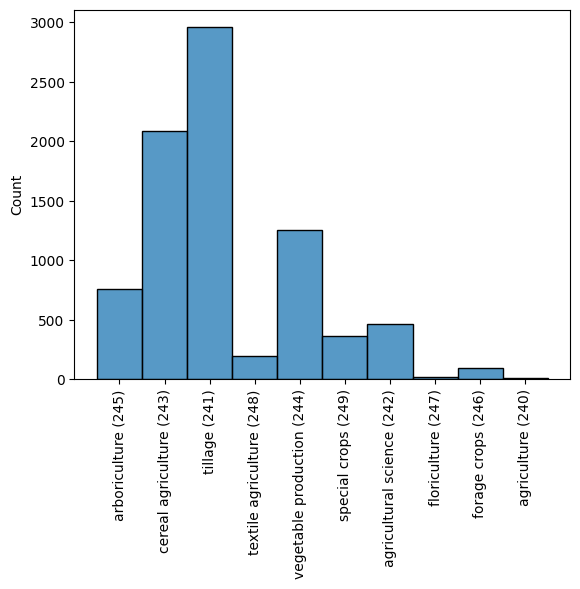

########## None LR 

########## Training LogisticRegression

########## 0.7489309712889431
              precision    recall  f1-score   support

         240      0.750     0.915     0.824      1054
         241      0.744     0.449     0.560       583

    accuracy                          0.749      1637
   macro avg      0.747     0.682     0.692      1637
weighted avg      0.748     0.749     0.730      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



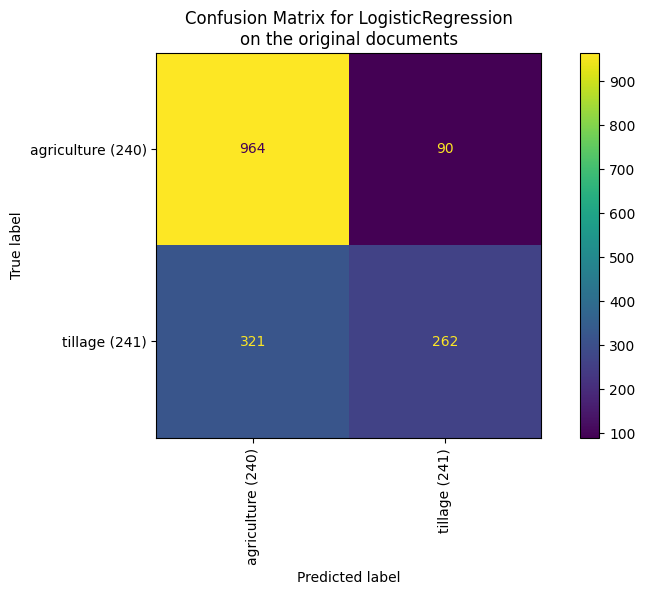

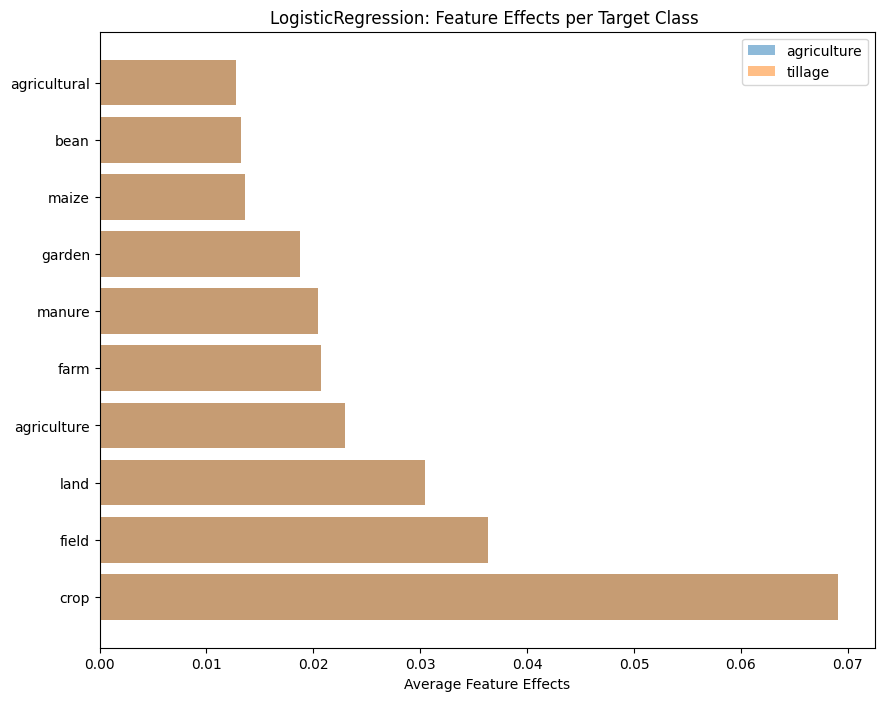

########## None SVM 

########## Training LinearSVC

########## 0.7348808796579108
              precision    recall  f1-score   support

         240      0.765     0.850     0.805      1054
         241      0.660     0.527     0.586       583

    accuracy                          0.735      1637
   macro avg      0.712     0.688     0.695      1637
weighted avg      0.727     0.735     0.727      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



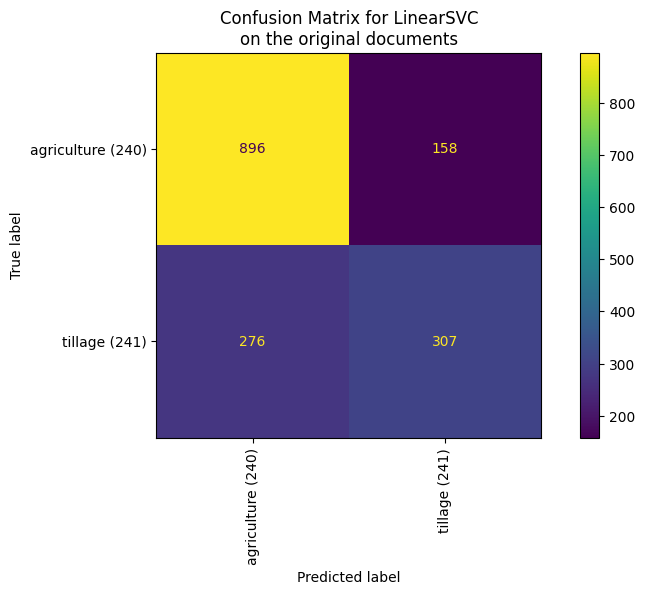

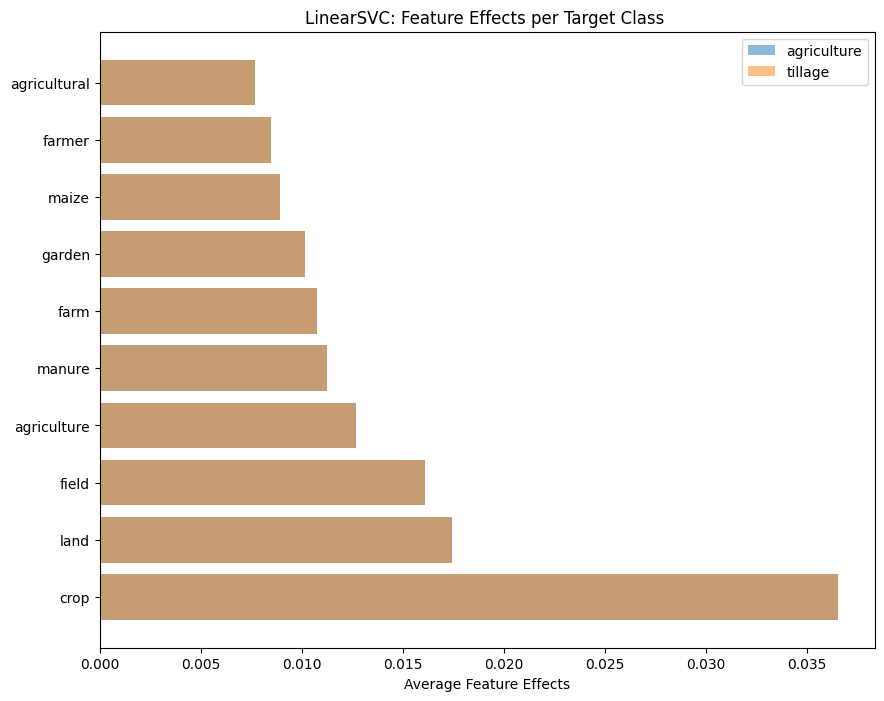

########## None RF 

########## Training RandomForestClassifier

########## 0.7361026267562615
              precision    recall  f1-score   support

         240      0.740     0.909     0.816      1054
         241      0.720     0.424     0.533       583

    accuracy                          0.736      1637
   macro avg      0.730     0.666     0.675      1637
weighted avg      0.733     0.736     0.715      1637



C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:28: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


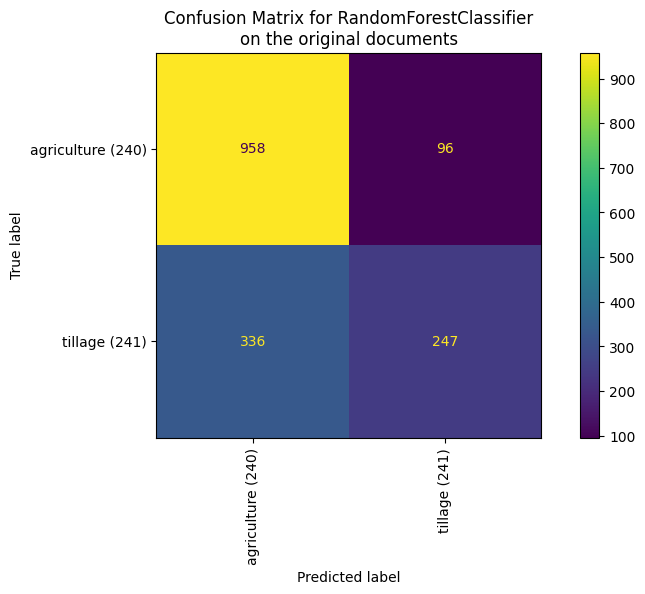

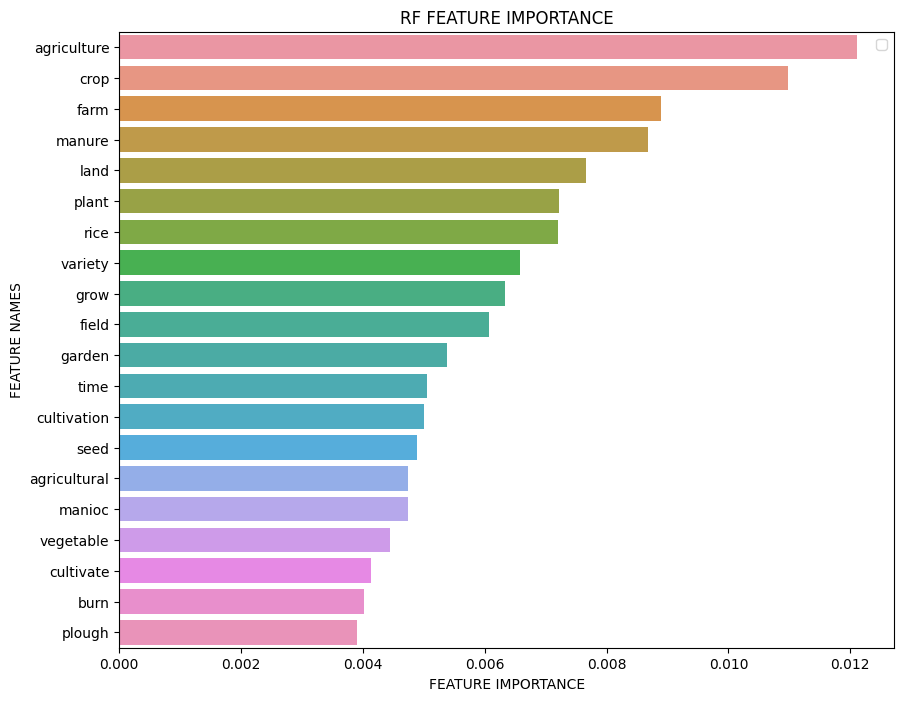

Iteration 2
Exclude: {'seed', 'beaver', 'bow', 'scoop', 'canoe', 'farm', 'hunt', 'sea', 'shallow', 'say', 'cast', 'fall', 'hand', 'wild', 'pool', 'give', 'spear', 'season', 'take', 'farmer', 'sturgeon', 'end', 'catch', 'crab', 'day', 'maize', 'time', 'people', 'skin', 'shoal', 'go', 'swim', 'basket', 'beast', 'boat', 'follow', 'salmon', 'lake', 'set', 'torch', 'trapper', 'shark', 'carry', 'they', 'herd', 'float', 'fishing', 'trail', 'bring', 'work', 'arrow', 'night', 'fire', 'snare', 'hunting', 'use', 'long', 'bear', 'draw', 'bank', 'weir', 'leave', 'deer', 'trout', 'form', 'hunter', 'squirrel', 'rabbit', 'agricultural', 'large', 'vegetable', 'spearing', 'rice', 'bait', 'animal', 'field', 'party', 'rod', 'run', 'net', 'fisherman', 'wolf', 'reef', 'upstream', 'tree', 'garden', 'lagoon', 'channel', 'dog', 'fish', 'tide', 'small', 'pull', 'bean', 'eel', 'drive', 'bonito', 'chase', 'wade', 'stick', 'coral', 'hold', 'mouth', 'crayfish', 'deep', 'water', 'manure', 'land', 'low', 'variety', '

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



KeyboardInterrupt: 

In [65]:
results2 = defaultdict(dict)

for i in [224, 226, 241, 243]:
    top_indicators = set()
    for j in range(iterations):
        results[j][i] = {}
        
        print(f"Iteration {j+1}\nExclude: {top_indicators}\n")
   
        df, curr_indicators  = run(models=['LR', 'SVM', 'RF'], 
                                  specific_cat=i, exact=True, 
                                  # exclude=results.get(i-1).get('indicators') if results.get(i-1) else [],
                                  exclude=top_indicators,
                                  verbose=True)
        results[j][i]['df'] = df
        # top_indicators += get_common_indicators(curr_indicators)
        
        # Get the list of arrays from the top_indicators values
        arrays = list(curr_indicators.values())
        
        top_indicators.update(set(arrays[0]).union(*arrays))
        
        results[j][i]['indicators'] = top_indicators

- look at the category only;
- and the culture is a sanity check for the results i have. Since certain authors write only about one culture!

In [13]:
from nltk.corpus import wordnet 



In [50]:
related_words

['aquatic_vertebrate',
 'bony_fish',
 'bottom-feeder',
 'bottom-dweller',
 'bottom_lurkers',
 'cartilaginous_fish',
 'chondrichthian',
 'climbing_perch',
 'Anabas_testudineus',
 'A._testudineus',
 'fingerling',
 'food_fish',
 'game_fish',
 'sport_fish',
 'mouthbreeder',
 'northern_snakehead',
 'rough_fish',
 'spawner',
 'young_fish',
 'food',
 'solid_food',
 'alewife',
 'anchovy',
 'eel',
 'haddock',
 'hake',
 'mullet',
 'grey_mullet',
 'gray_mullet',
 'panfish',
 'rock_salmon',
 'salmon',
 'schrod',
 'scrod',
 'shad',
 'smelt',
 'stockfish',
 'trout',
 'person',
 'individual',
 'someone',
 'somebody',
 'mortal',
 'soul',
 'search',
 'seek',
 'look_for',
 'catch',
 'grab',
 'take_hold_of',
 'angle',
 'brail',
 'crab',
 'net_fish',
 'prawn',
 'rail',
 'scallop',
 'scollop',
 'seine',
 'shark',
 'shrimp',
 'still-fish',
 'trawl']

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 1.980s at 1.949MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


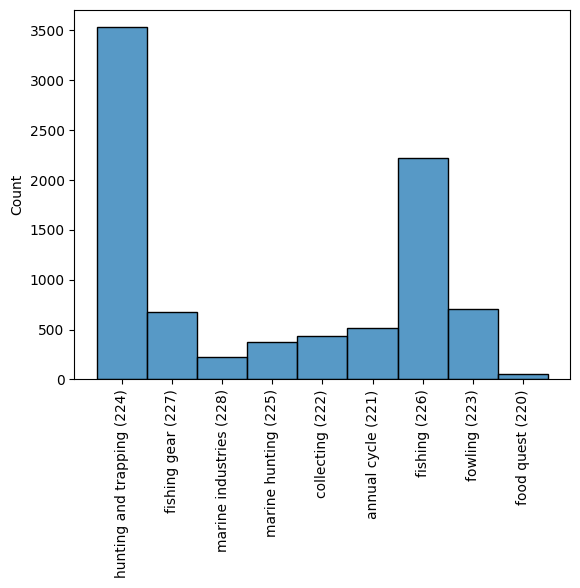

########## None LR 

########## Training LogisticRegression

########## 0.9094036697247706


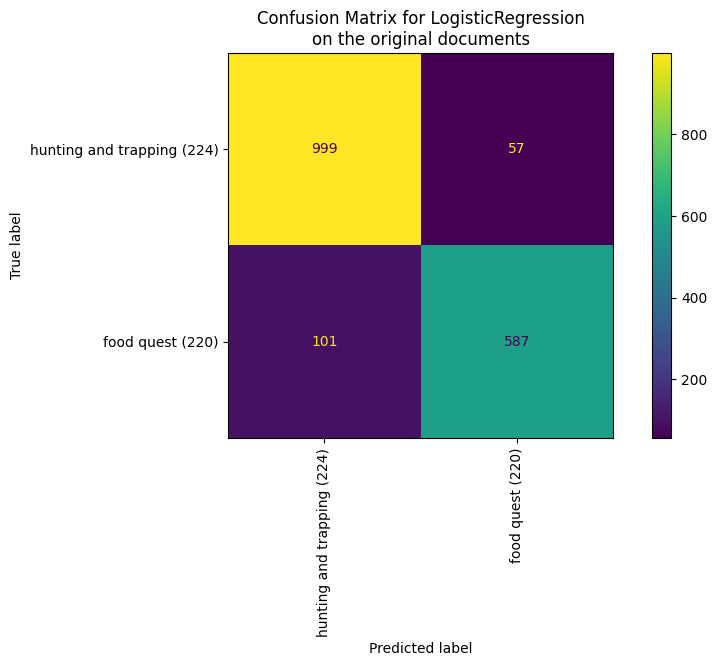

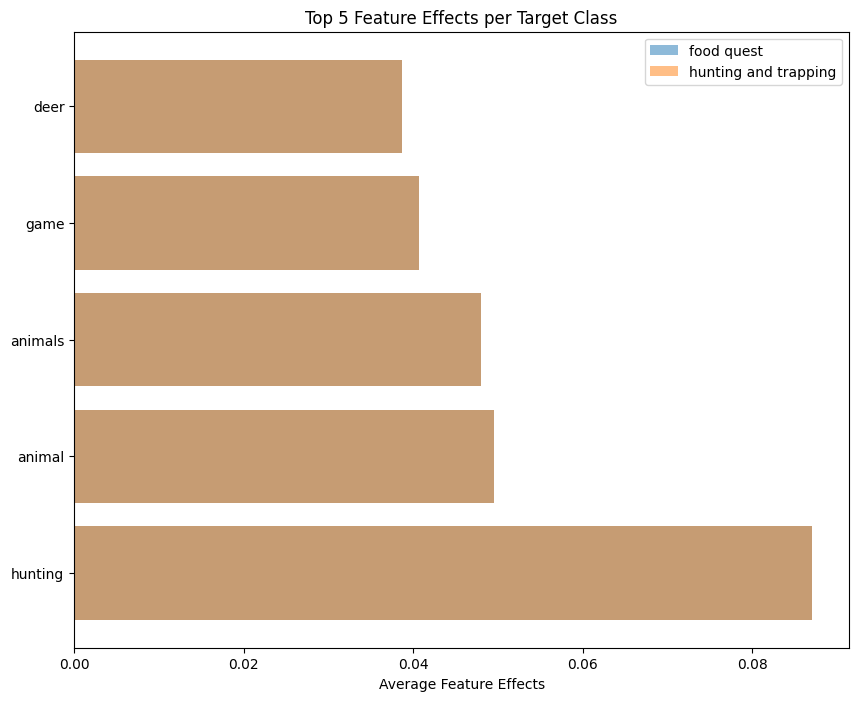

########## None RF 

########## Training RandomForestClassifier

########## 0.8876146788990825


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


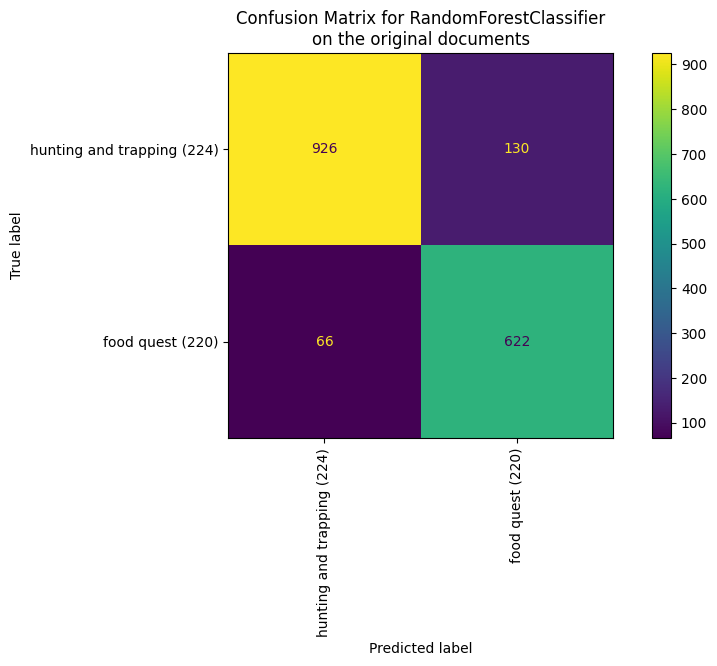

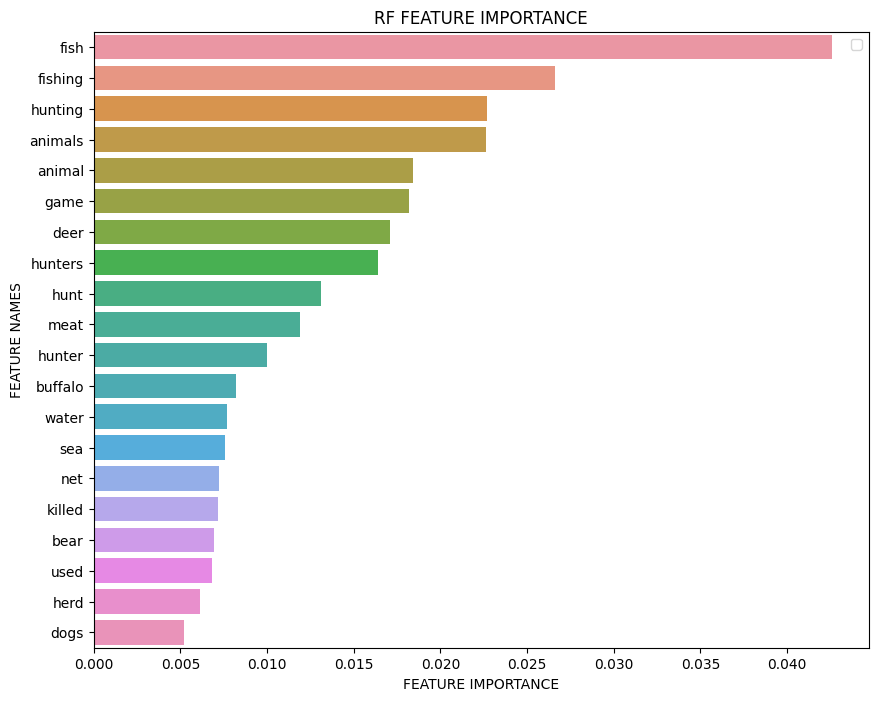

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 1.988s at 1.941MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


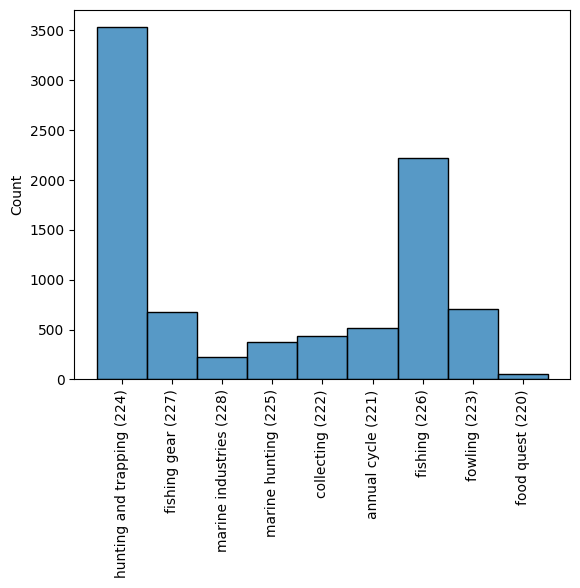

########## None LR 

########## Training LogisticRegression

########## 0.8876146788990825


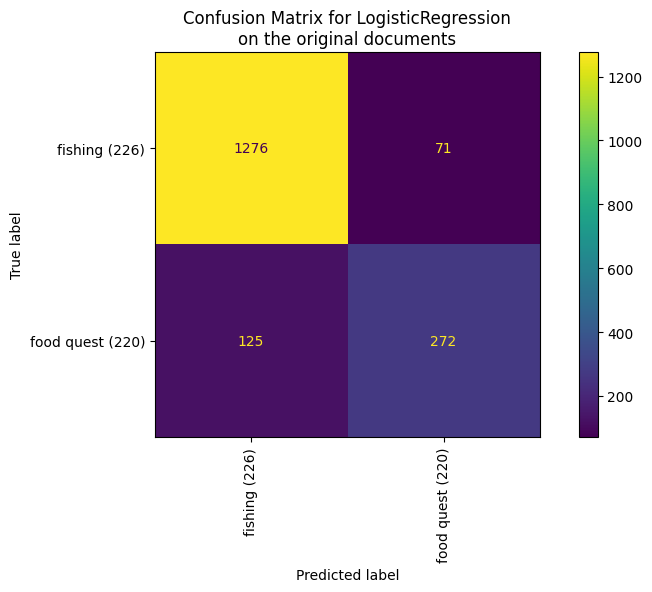

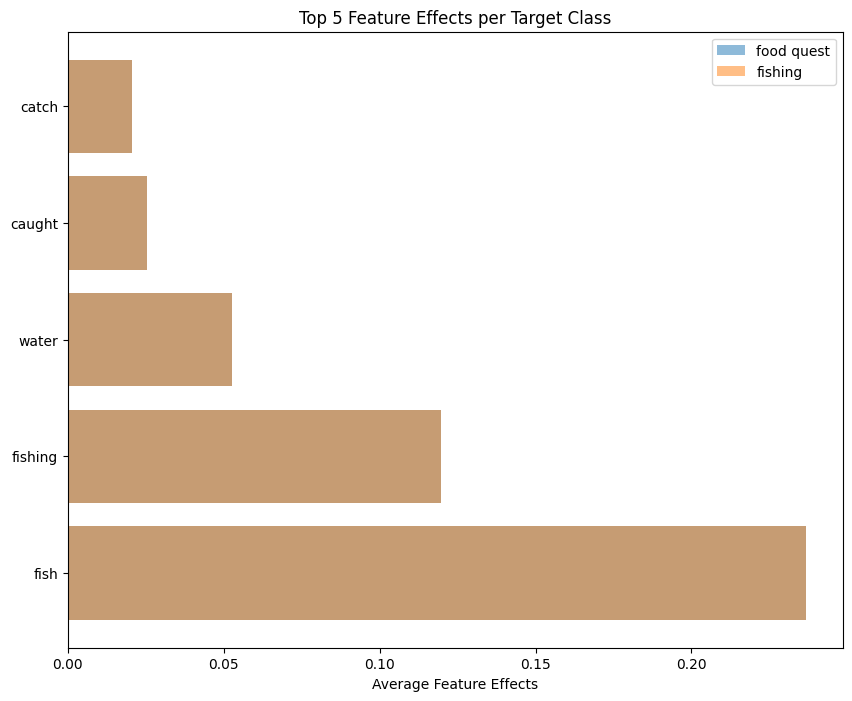

########## None RF 

########## Training RandomForestClassifier

########## 0.9025229357798165


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


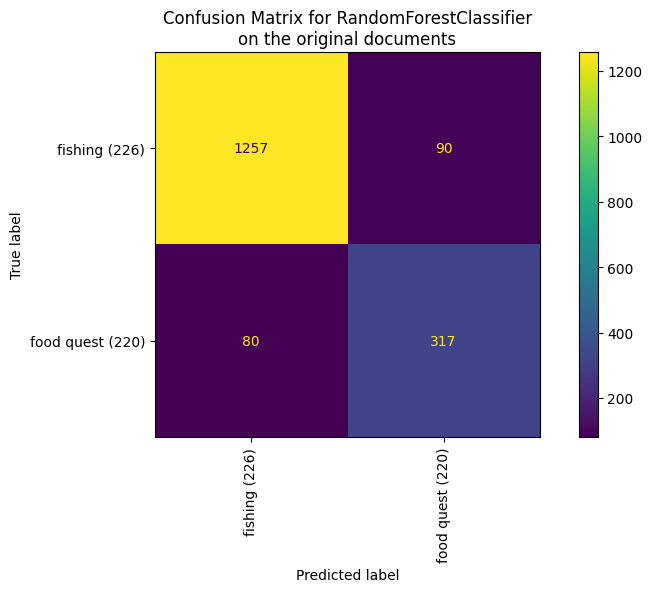

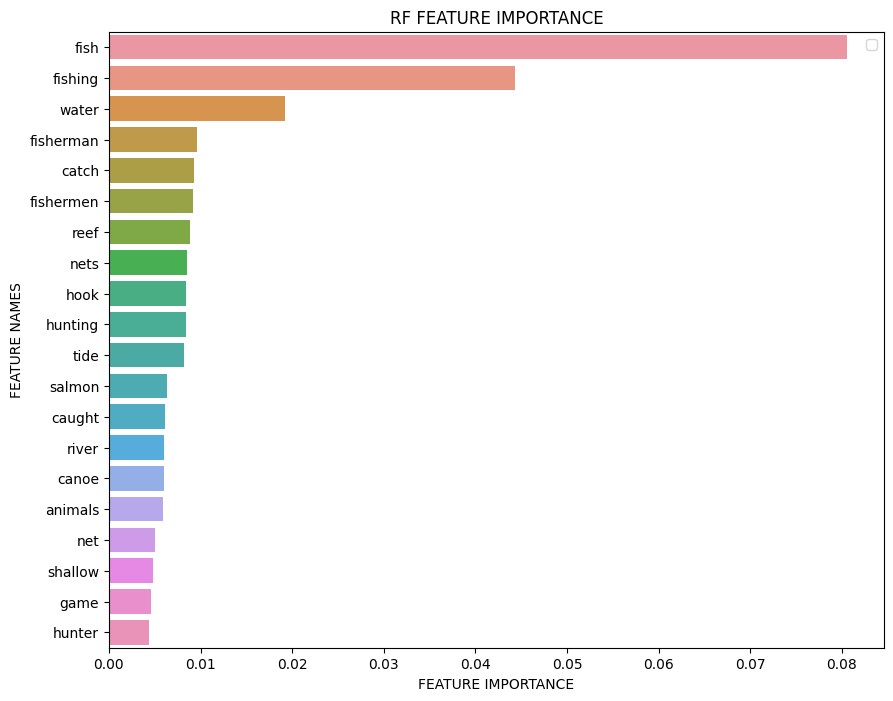

In [11]:
dfs = {}
for i in [224, 226]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=True, verbose=True)
    dfs[i] = df

In [11]:
dfs[224][dfs[224]['predicted_LR'] == 1]

,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,predicted_LR,predicted_RF
89393,99165,nf04-016-007916,nf04-016-007631,nf04-016-007489,nf04-016-002656,The Assiniboines: From the accounts of the Old...,nf04-016,Assiniboine,1961,1939,...,105,nf04-016-007899,nf04-016-007822,nf04-016-007954,"The dogs were tied up out of sight, and all th...",224,en,[224],1,0
162045,177306,oz04-002-020554,oz04-002-019336,NaN,NaN,The Maori: volume 2,oz04-002,Maori,1924,ca.1870-1920,...,479,oz04-002-020519,oz04-002-020478,oz04-002-020578,The ~~puaka~~ trap was really a noosing method...,223,en,[223],1,0
95875,105892,ng06-061-010890-0,ng06-061-010562,ng06-061-010223,ng06-061-009977,The Round Lake Ojibwa,ng06-061,Ojibwa,1962,July 1958-July 1959,...,c37,ng06-061-010873,ng06-061-010821,ng06-061-010896,{{224}} in which beaver may be trapped. Occasi...,224,en,[224],1,0
57325,63407,fo32-012-002576,fo32-012-002497,fo32-012-002281,fo32-012-000096,"Hunting of the Boyela, slash-and-burn agricult...",fo32-012,Mongo,1983,"1976-1977, 1978-1979",...,47,fo32-012-002546,fo32-012-002480,fo32-012-002599,a) Drive: Drive strategy is employed in one of...,224,en,"[128, 224]",1,0
78874,88138,na08-001-021158,na08-001-021070,na08-001-002260,na08-001-002018,Ingalik material culture,na08-001,Ingalik,1970,"1934, 1937",...,240,na08-001-021148,na08-001-021093,na08-001-021227,~~Variations in use~~ . Sometimes a rabbit sna...,224,en,[224],1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164378,179665,rv02-055-000328,rv02-055-000203,rv02-055-000085,NaN,The Dolgans,rv02-055,Yakut,1964,no date,...,659,rv02-055-000306,rv02-055-000273,rv02-055-000376,{{224}} {{177}} Polar-fox hunting was of quit...,224,en,"[177, 224]",1,0
90061,99833,nf06-006-002205,nf06-006-002123,nf06-006-002036,NaN,Modern Blackfeet- Montanans on a reservation,nf06-006,Blackfoot,[1972],1959-1967,...,39,nf06-006-002195,nf06-006-002141,nf06-006-002245,The most common technique for hunting buffalo ...,224,en,"[224, 492]",1,0
21647,22470,ar20-001-006810,ar20-001-006582,ar20-001-002813,ar20-001-002810,The Lakhers,ar20-001,Mara,1932,1924-1928,...,152,ar20-001-006784,ar20-001-006759,ar20-001-006818,[% TRAP FOR RATS AND SQUIRRELS LEIKA [graphi...,224,en,[224],1,1
36278,38916,ep04-017-002697-0,ep04-017-001994,ep04-017-000097,NaN,The Lapps in Finland up to 1945. Vol. 2,ep04-017,Saami,"1984, c1948",1913-1947,...,99,ep04-017-002682,ep04-017-002661,ep04-017-002705,fifteen cm. is fastened to the downward-pointi...,224,en,[224],1,0


In [22]:

df = pd.read_csv('data/en_data.csv', encoding='utf-8')

df['ocms_list'] = df['ocms'].str.split()
df['ocms_list'] = df['ocms_list'].apply(lambda x: [int(i) for i in x])


In [39]:
'241 223'.

0

In [ ]:
np.split()

In [50]:
np.array('241 223'.split())[np.argwhere(np.array('241 223'.split()) == '241')][0][0]

'241'

In [77]:
def filter_other_ocms(df, cat):
    parent_cat = utils.get_parent_category_i(cat)
    
    df['filtered_ocms'] = df['ocms_list'].apply(lambda x: list(filter(lambda i: parent_cat == utils.get_parent_category_i(i), x))[0])

    return df

In [67]:
list(filter(lambda x: 226 == x, [136, 226, 228]))

[226]

In [59]:
df['test'] = df['ocms'].apply(lambda x: np.any([i == '241' for i in x.split()])
                 and 
                 np.array(x.split())[np.argwhere(np.array(x.split()) == '241')][0][0])

In [75]:
df[ df['ocms_list'].map(lambda x: (224 not in x and len([cat for cat in x if utils.get_parent_category_i(cat) == utils.get_parent_category_i(224)]) == 1 )) ]

,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,pub.lang,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,test
11,11,aa01-001-005037,aa01-001-004389,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,167,aa01-001-005015,aa01-001-004985,aa01-001-005061,{{175}} {{656}} {{316}} {{228}} “Mining con...,175 228 316 656,en,"[175, 228, 316, 656]",False
12,12,aa01-001-006589,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,219,aa01-001-006579,aa01-001-006532,aa01-001-006599,{{175}} {{425}} {{226}} “As the year advance...,175 226 425,en,"[175, 226, 425]",False
13,13,aa01-001-006882,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,230,aa01-001-006872,aa01-001-006845,aa01-001-006890,{{651}} {{226}} “Korean fisheries annually re...,226 651,en,"[226, 651]",False
18,18,aa01-001-007956,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,270,aa01-001-007926,aa01-001-007909,aa01-001-007971,{{222}} {{276}} “A wild variety of this plant...,222 276,en,"[222, 276]",False
20,20,aa01-001-007981,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,270-271,aa01-001-007971,aa01-001-007926,aa01-001-007990,{{226}} {{262}} “Another great Korean industr...,226 262,en,"[226, 262]",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183188,199727,sv03-011-006185,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,103,sv03-011-006123,sv03-011-006065,sv03-011-006192,{{222 262}} Plant picking is not of much impor...,222 262,en,"[222, 262]",False
183189,199728,sv03-011-006202,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,104,sv03-011-006192,sv03-011-006123,sv03-011-006278,"{{222 262}} A few wild plants, however, become...",222 262,en,"[222, 262]",False
183206,199745,sv03-011-008485,sv03-011-008472,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,139,sv03-011-008473,sv03-011-008399,sv03-011-008545,"{{226 262}} Despite the proximity of the sea, ...",226 262,en,"[226, 262]",False
183207,199746,sv03-011-008622,sv03-011-008585,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,141,sv03-011-008605,sv03-011-008545,sv03-011-008675,{{262 226}} Mention has already been made of t...,226 262,en,"[226, 262]",False


In [78]:
filter_other_ocms(df[ df['ocms_list'].map(lambda x: (224 not in x and len([cat for cat in x if utils.get_parent_category_i(cat) == utils.get_parent_category_i(224)]) == 1 )) ], 226)

C:\Users\alhas\AppData\Local\Temp\ipykernel_11560\2002507869.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,test,filtered_ocms
11,11,aa01-001-005037,aa01-001-004389,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,167,aa01-001-005015,aa01-001-004985,aa01-001-005061,{{175}} {{656}} {{316}} {{228}} “Mining con...,175 228 316 656,en,"[175, 228, 316, 656]",False,228
12,12,aa01-001-006589,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,219,aa01-001-006579,aa01-001-006532,aa01-001-006599,{{175}} {{425}} {{226}} “As the year advance...,175 226 425,en,"[175, 226, 425]",False,226
13,13,aa01-001-006882,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,230,aa01-001-006872,aa01-001-006845,aa01-001-006890,{{651}} {{226}} “Korean fisheries annually re...,226 651,en,"[226, 651]",False,226
18,18,aa01-001-007956,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,270,aa01-001-007926,aa01-001-007909,aa01-001-007971,{{222}} {{276}} “A wild variety of this plant...,222 276,en,"[222, 276]",False,222
20,20,aa01-001-007981,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,270-271,aa01-001-007971,aa01-001-007926,aa01-001-007990,{{226}} {{262}} “Another great Korean industr...,226 262,en,"[226, 262]",False,226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183188,199727,sv03-011-006185,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,103,sv03-011-006123,sv03-011-006065,sv03-011-006192,{{222 262}} Plant picking is not of much impor...,222 262,en,"[222, 262]",False,222
183189,199728,sv03-011-006202,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,104,sv03-011-006192,sv03-011-006123,sv03-011-006278,"{{222 262}} A few wild plants, however, become...",222 262,en,"[222, 262]",False,222
183206,199745,sv03-011-008485,sv03-011-008472,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,139,sv03-011-008473,sv03-011-008399,sv03-011-008545,"{{226 262}} Despite the proximity of the sea, ...",226 262,en,"[226, 262]",False,226
183207,199746,sv03-011-008622,sv03-011-008585,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,141,sv03-011-008605,sv03-011-008545,sv03-011-008675,{{262 226}} Mention has already been made of t...,226 262,en,"[226, 262]",False,226


In [85]:
filter_other_ocms(df[ df['ocms_list'].map(lambda x: (224 in x and 
                                                     not np.any([224 != cat and utils.get_parent_category_i(cat) == utils.get_parent_category_i(224) for cat in x]) )
                                         )], 224)

C:\Users\alhas\AppData\Local\Temp\ipykernel_11560\2002507869.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,test,filtered_ocms
6,6,aa01-001-000606,aa01-001-000028,NaN,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,21-22,aa01-001-000596,aa01-001-000580,aa01-001-000616,{{136}} {{224}} {{476}} “So much for domesti...,136 224 476,en,"[136, 224, 476]",False,224
7,7,aa01-001-000636,aa01-001-000028,NaN,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,22,aa01-001-000616,aa01-001-000596,aa01-001-000648,{{136}} {{224}} {{278}} {{237}} “Deer are c...,136 224 237 278,en,"[136, 224, 237, 278]",False,224
8,8,aa01-001-000706,aa01-001-000028,NaN,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,23-24,aa01-001-000696,aa01-001-000666,aa01-001-000714,"{{136}} {{224}} “For its bird life, especiall...",136 224,en,"[136, 224]",False,224
14,14,aa01-001-006900,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,230-231,aa01-001-006890,aa01-001-006872,aa01-001-006909,{{655}} {{224}} “Furs have always been an imp...,224 655,en,"[224, 655]",False,224
21,21,aa01-001-008162,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,275,aa01-001-008145,aa01-001-008126,aa01-001-008169,{{224}} “The primitive occupations of hunting ...,224,en,[224],False,224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181141,197628,st13-013-008935,st13-013-008917,st13-013-000729,st13-013-000079,The ethnobotany of the Island Caribs of Dominica,st13-013,Island Carib,1957,1930-1956,...,602,st13-013-008876,st13-013-008766,st13-013-009006,Caribs crush the bark of bois tan ( ~~Byrsonim...,224 824,en,"[224, 824]",False,224
181844,198337,su01-001-035257,su01-001-034961,su01-001-034175,su01-001-030711,The people of Puerto Rico: a study in social a...,su01-001,Puerto Ricans (Island),1956,1948-1949,...,[p. 363-A],su01-001-035219,su01-001-035150,su01-001-035264,{{224}} A third supplementary economic activit...,224 857,en,"[224, 857]",False,224
181845,198338,su01-001-035257-0,su01-001-034961,su01-001-034175,su01-001-030711,The people of Puerto Rico: a study in social a...,su01-001,Puerto Ricans (Island),1956,1948-1949,...,[p. 363-A],su01-001-035219,su01-001-035150,su01-001-035264,{{224}} food and of reducing damage to the can...,224 857,en,"[224, 857]",False,224
181846,198339,su01-001-035277,su01-001-034961,su01-001-034175,su01-001-030711,The people of Puerto Rico: a study in social a...,su01-001,Puerto Ricans (Island),1956,1948-1949,...,[p. 363-B],su01-001-035264,su01-001-035219,su01-001-035311,{{262 231 438}} Crabs are usually not eaten as...,224 231 262 438 577 685 857,en,"[224, 231, 262, 438, 577, 685, 857]",False,224


In [60]:
df['test']

0           241
1         False
2         False
3         False
4         False
          ...  
183215      241
183216      241
183217    False
183218      241
183219    False
Name: test, Length: 183220, dtype: object

In [15]:
dfs[224]['ocms'].str.split

152067    [226]
155721    [226]
159205    [226]
158461    [225]
86251     [223]
          ...  
95797     [226]
92007     [221]
68565     [223]
172653    [221]
76449     [226]
Name: ocms, Length: 1744, dtype: object

# Cat vs subcategories (multi-label classification)

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 1.871s at 2.063MB/s
n_samples: 6973, n_features: 6588
n_samples: 1744, n_features: 6588


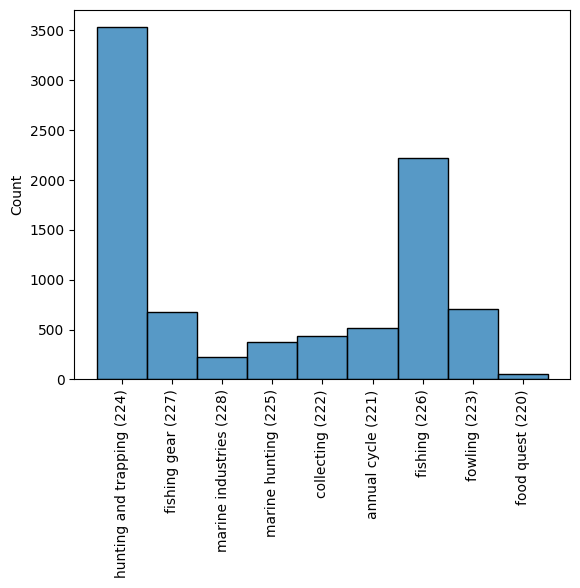

########## None LR 

########## Training LogisticRegression

########## 0.7568807339449541


6588 [[-0.04149707  0.09760917 -0.00680812 ... -0.0034448  -0.01100974
  -0.01492088]
 [-0.17576595 -0.27620896  0.01878018 ... -0.0189395  -0.07123426
   0.4489107 ]
 [-0.04895008  0.10312413 -0.03545108 ... -0.01752379  0.57886867
  -0.06188645]
 ...
 [-0.30805714 -0.04576085 -0.09537761 ... -0.17682852 -0.14354767
   0.08550778]
 [ 0.50284053 -0.08420313 -0.00703685 ... -0.02244814 -0.06030139
  -0.07634123]
 [ 0.29879094  0.35956597 -0.02139299 ... -0.01163683 -0.0312702
  -0.06526408]] ['224' '227' '228' '225' '222' '221' '226' '223' '220'] ['10' '100' '11' ... 'zebra' 'zingg' 'zone']
top 5 keywords per class:
       224     227       228     225      222      221      226   223      220
0     fish  winter      wild   birds  hunting      sea     fish  fish  fishing
1  hunting  season      tree    bird   animal     seal  fishing  used     fish
2   winter    time     fruit     net  animals   animal    water   net     nets
3     line  summer     women  caught     deer  animals   caug

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


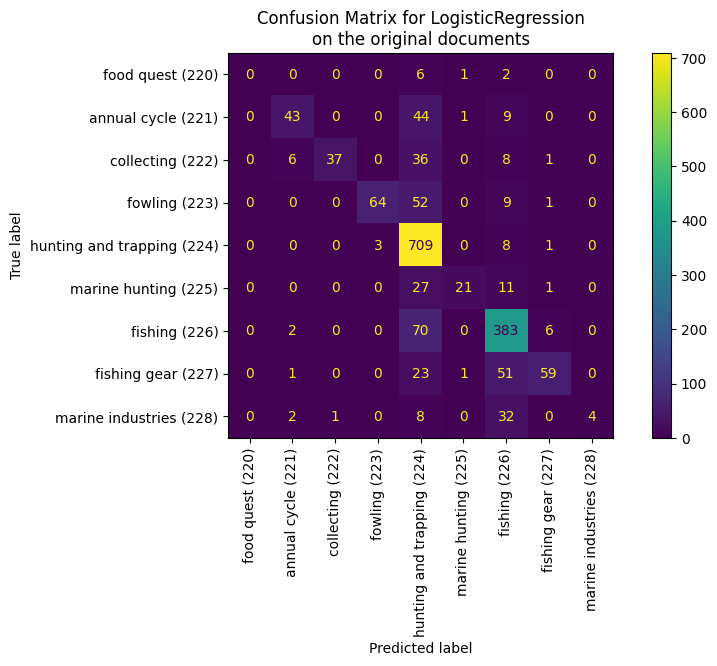

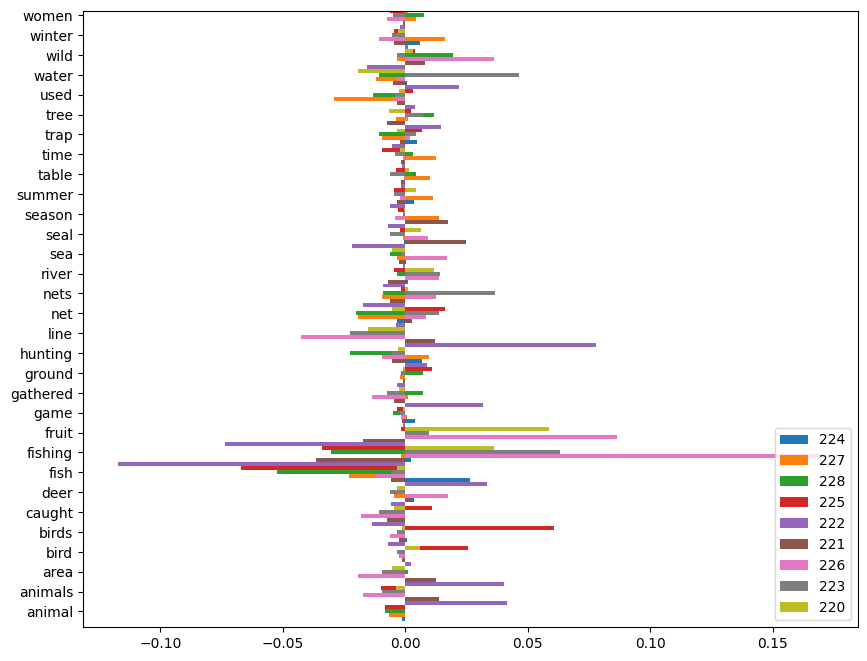

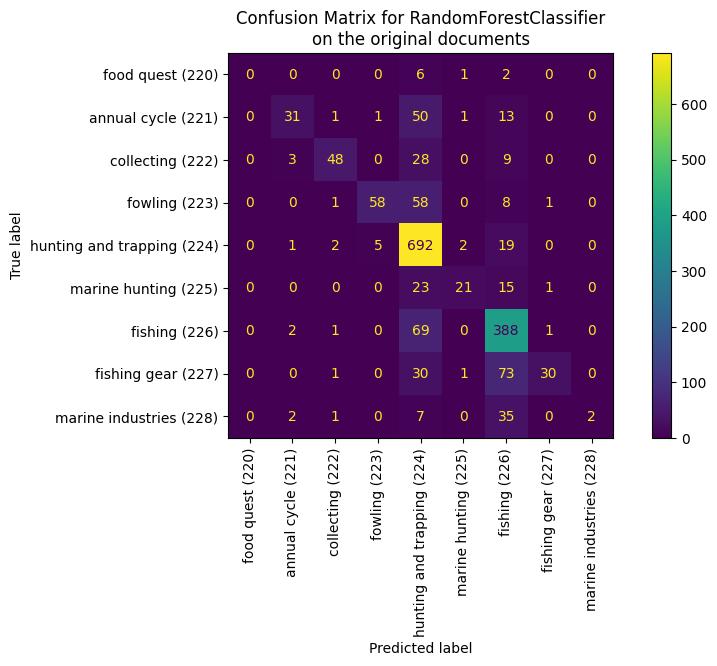

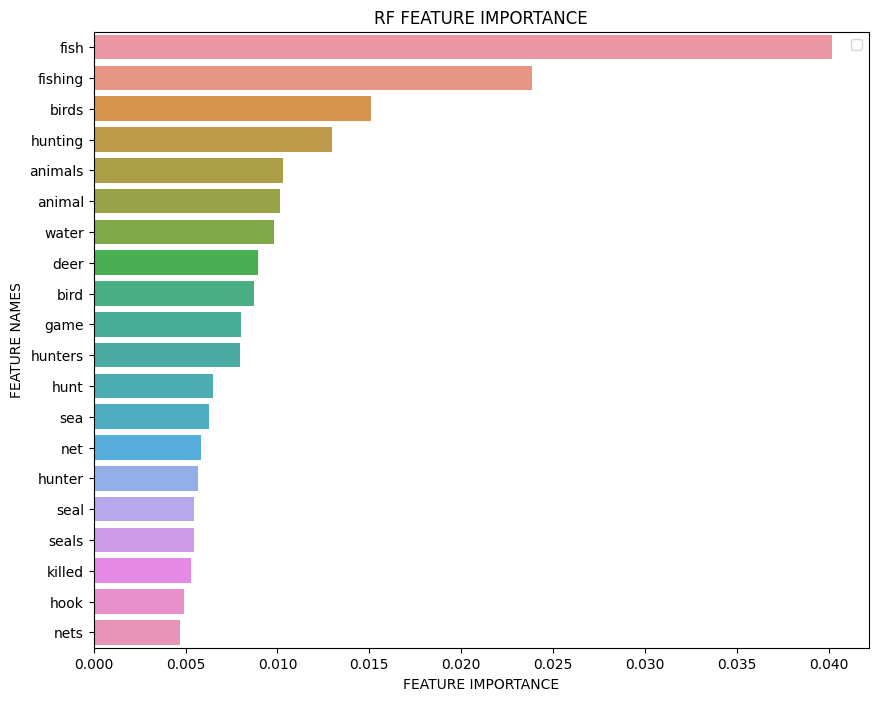

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 1.684s at 2.125MB/s
n_samples: 6546, n_features: 6097
n_samples: 1637, n_features: 6097


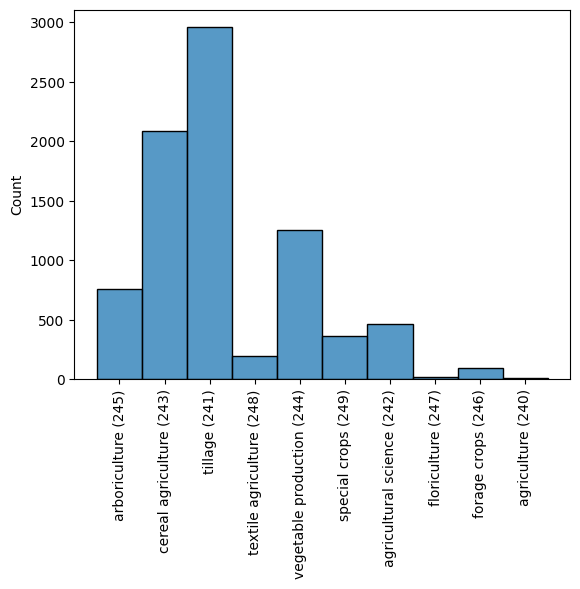

########## None LR 

########## Training LogisticRegression

########## 0.6023213194868662


ValueError: The number of FixedLocator locations (8), usually from a call to set_ticks, does not match the number of labels (10).

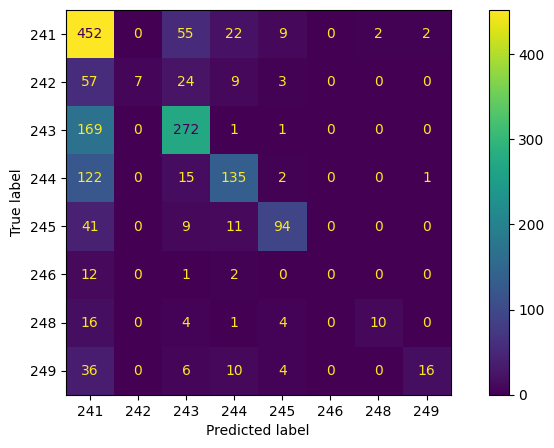

In [82]:

dfs = {}
for i in [220, 240]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=False, verbose=True)
    dfs[i] = df

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 2.097s at 1.840MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


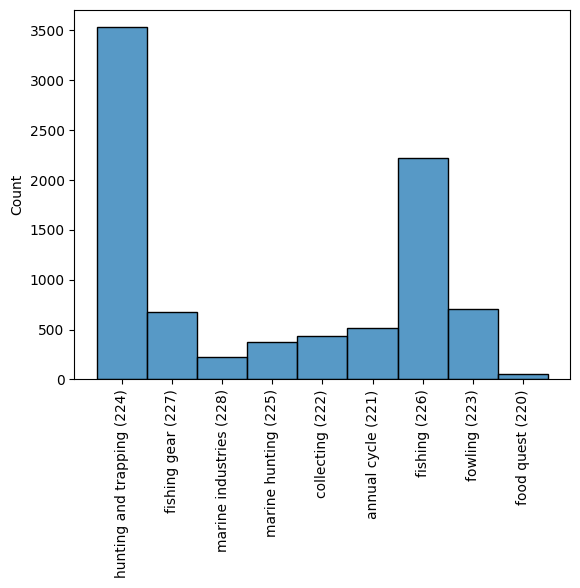

########## None LR 

########## Training LogisticRegression

########## 0.7597477064220184


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



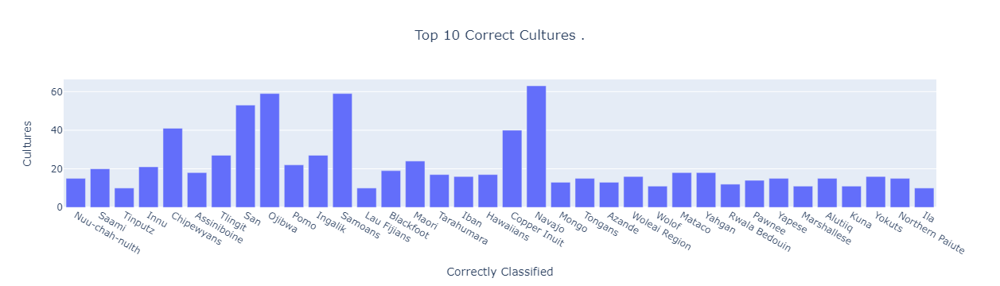

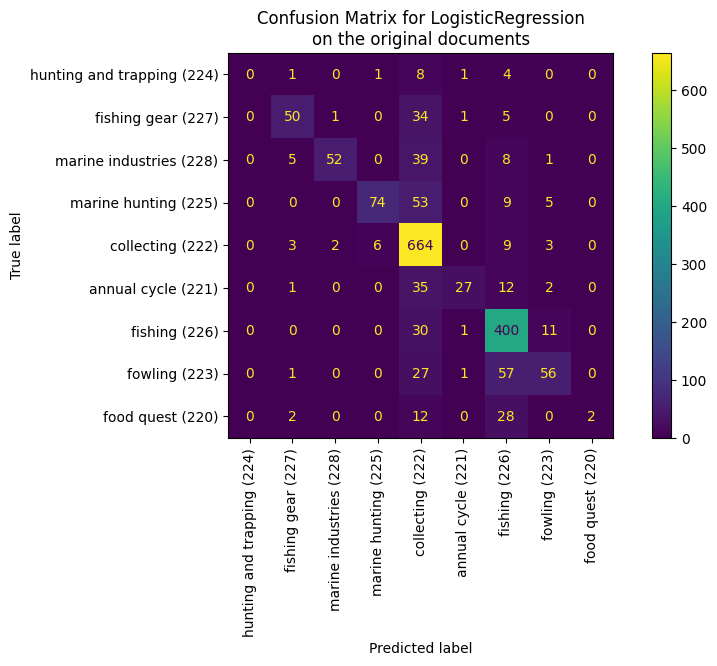

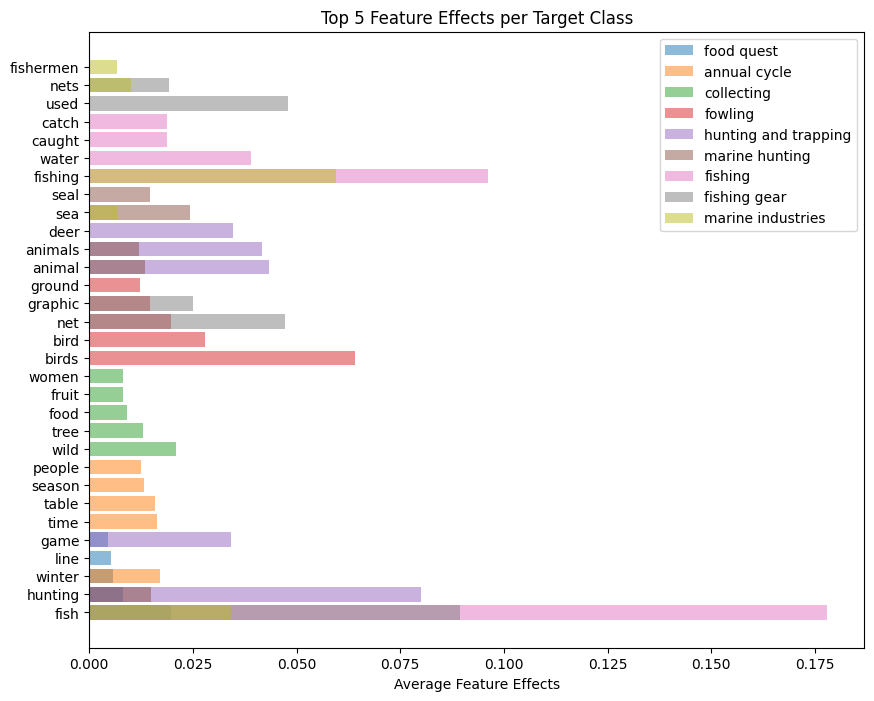

########## None RF 

########## Training RandomForestClassifier

########## 0.7339449541284404


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



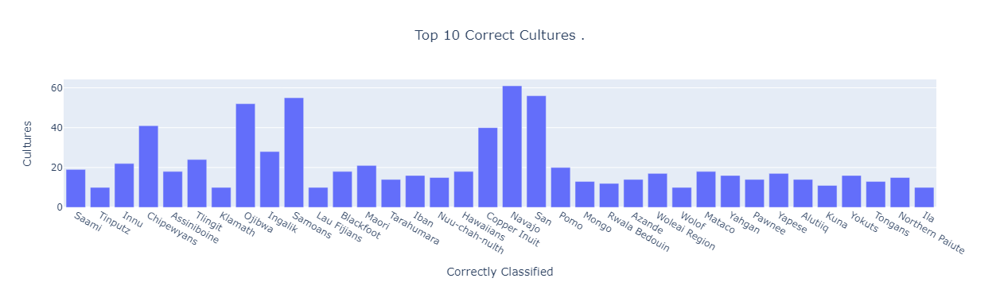

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


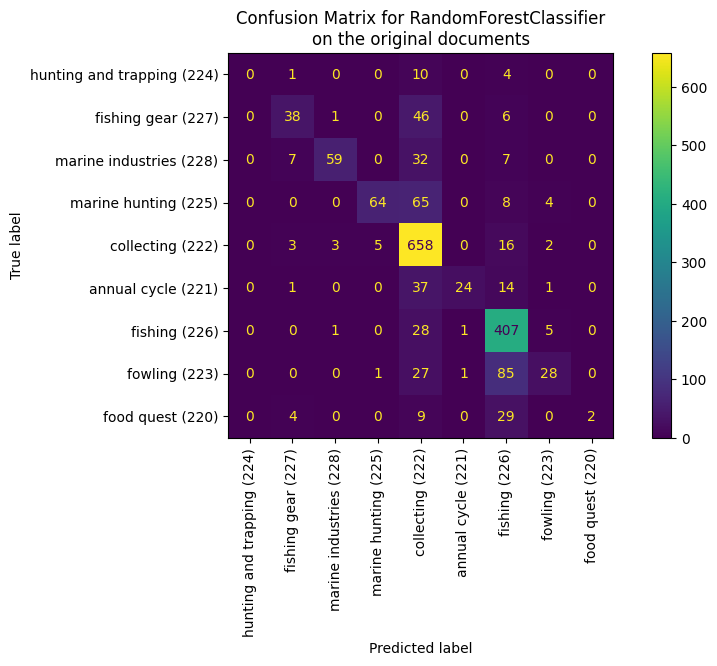

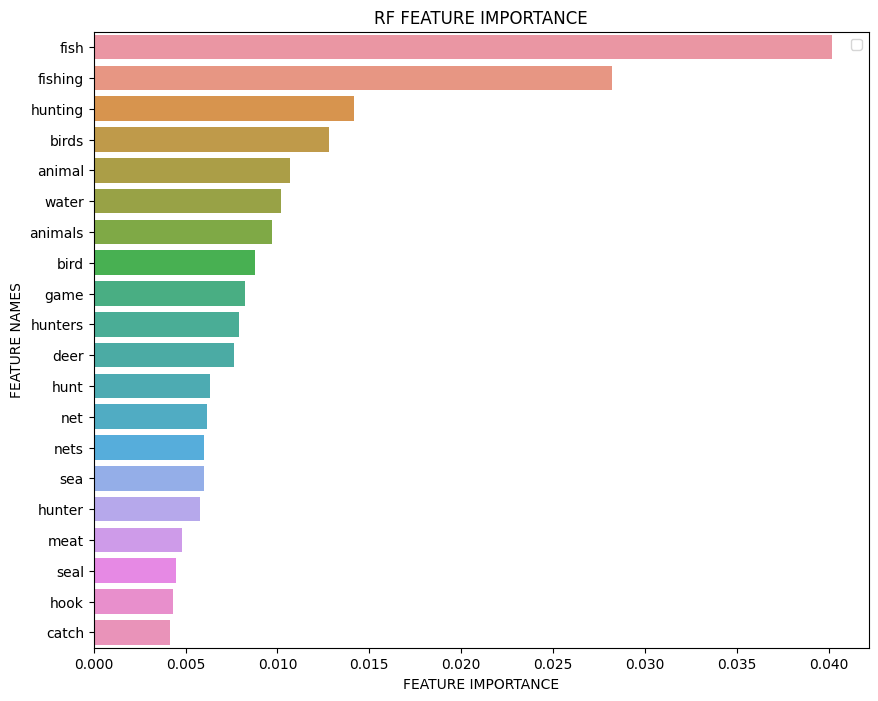

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 2.251s at 1.714MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


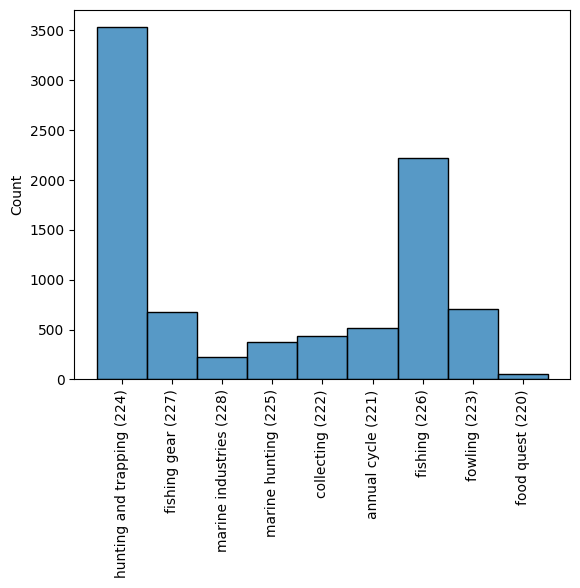

########## None LR 

########## Training LogisticRegression

########## 0.7746559633027523


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



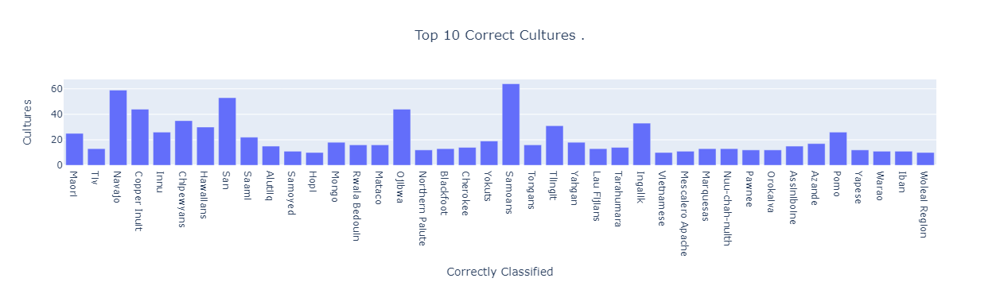

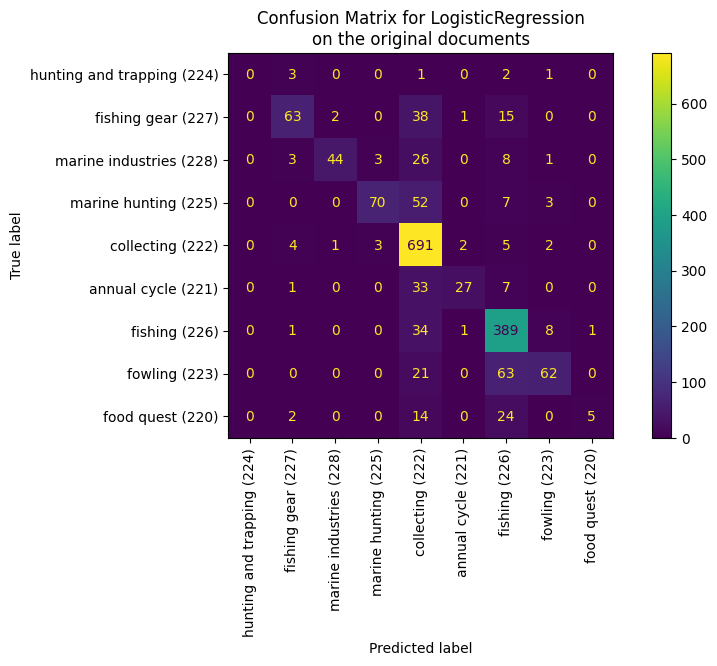

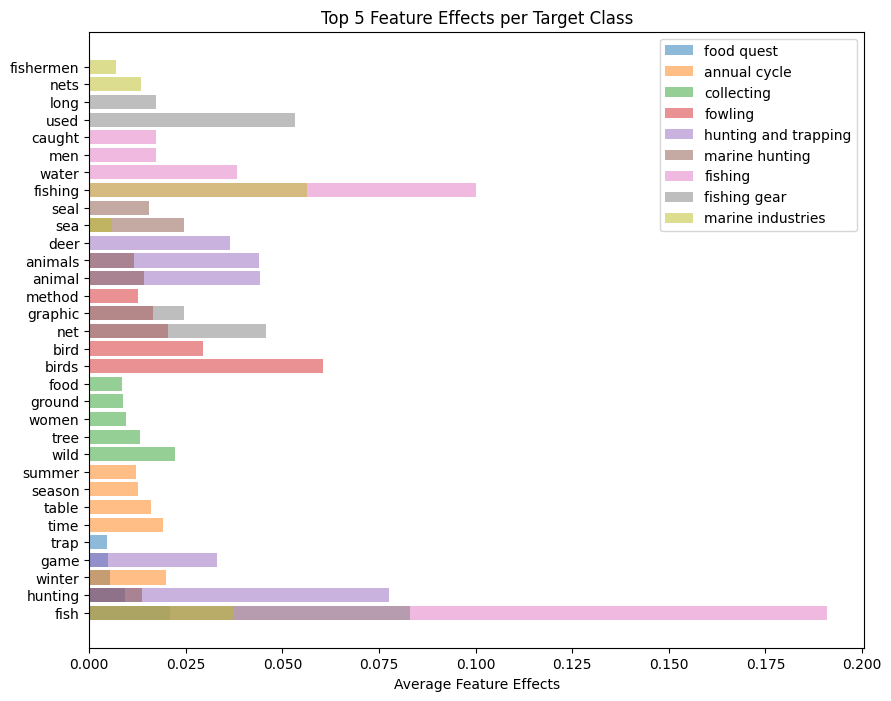

########## None RF 

########## Training RandomForestClassifier

########## 0.7442660550458715


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



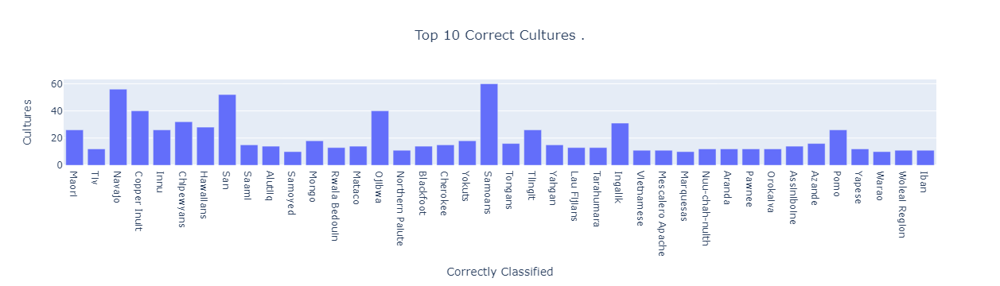

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


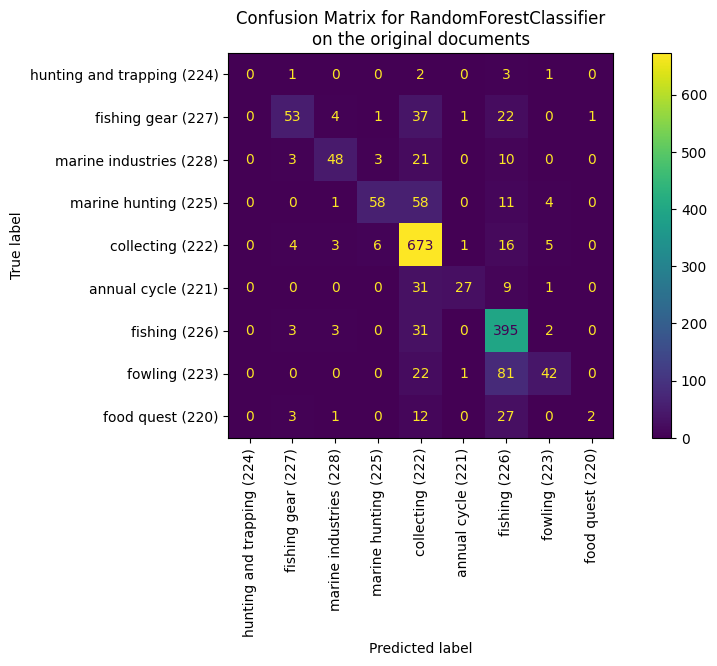

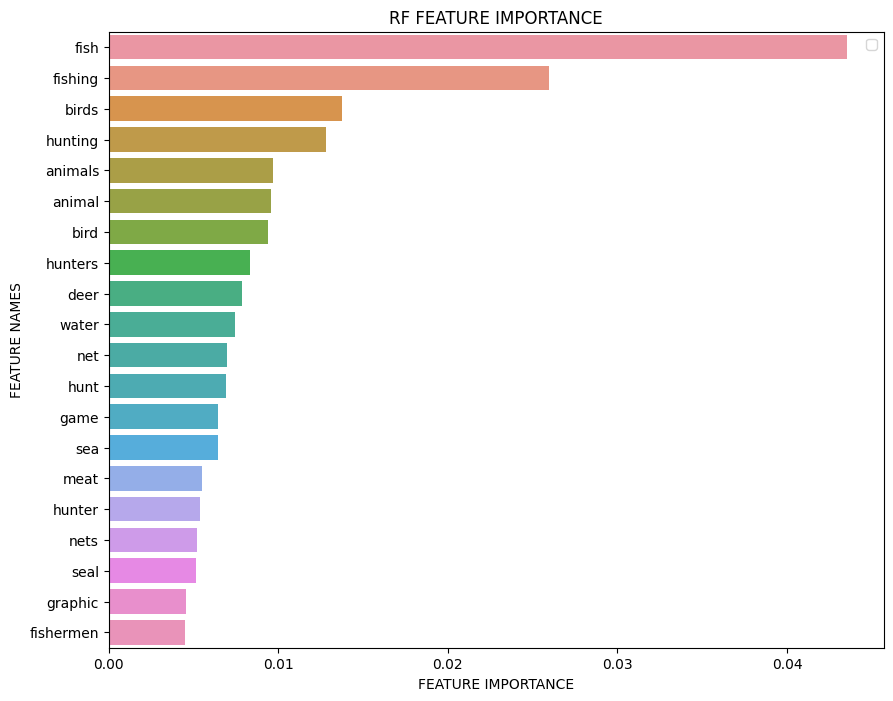

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 1.969s at 1.817MB/s
n_samples: 6546, n_features: 6404
n_samples: 1637, n_features: 6404


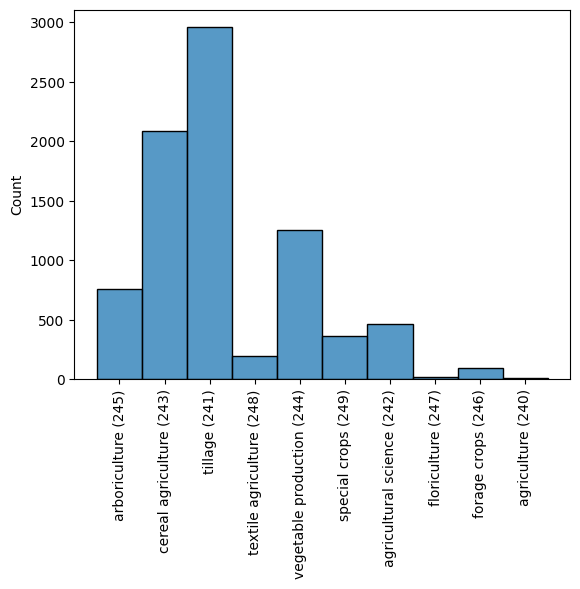

########## None LR 

########## Training LogisticRegression

########## 0.6713500305436775


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



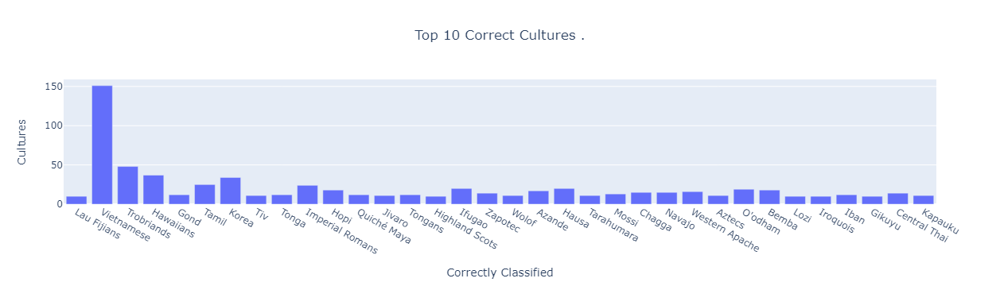

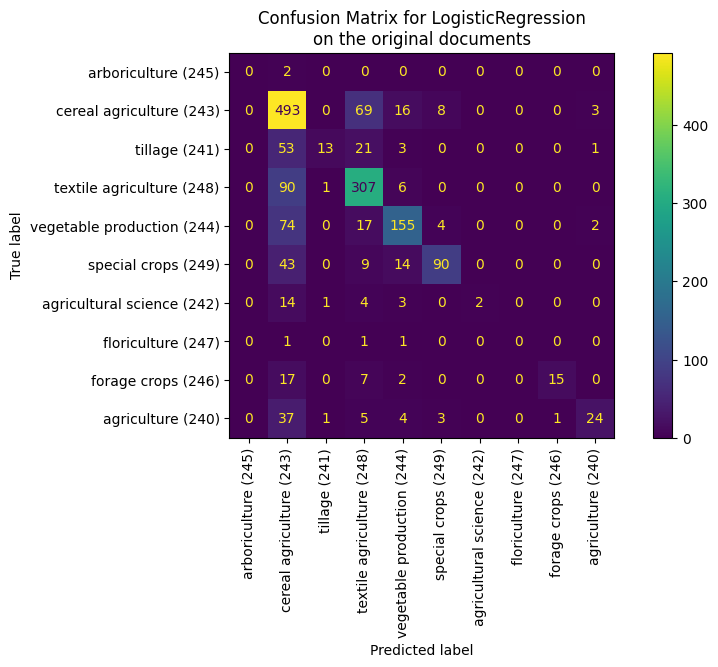

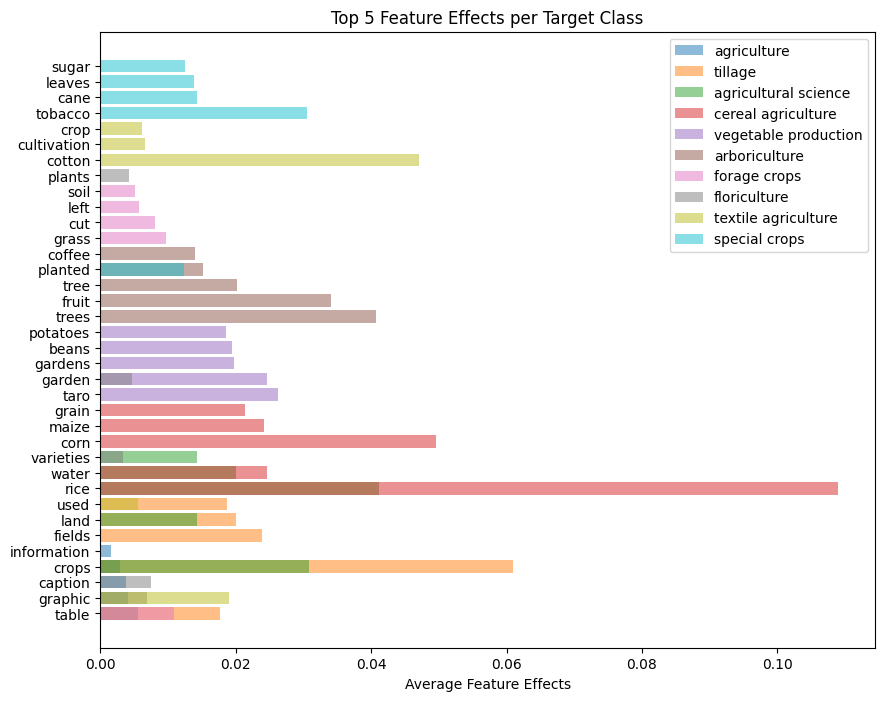

########## None RF 

########## Training RandomForestClassifier

########## 0.6481368356750152


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



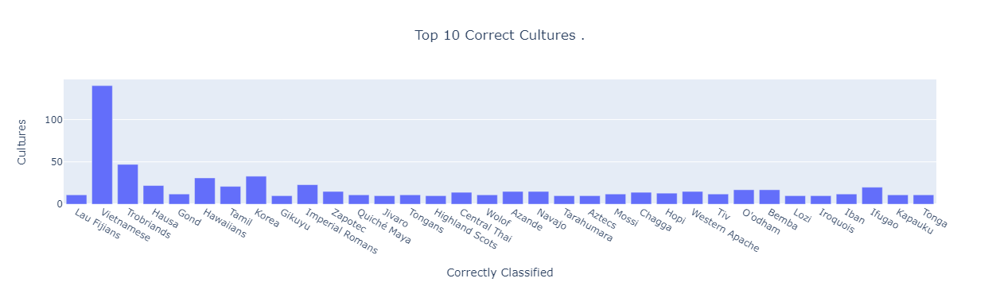

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


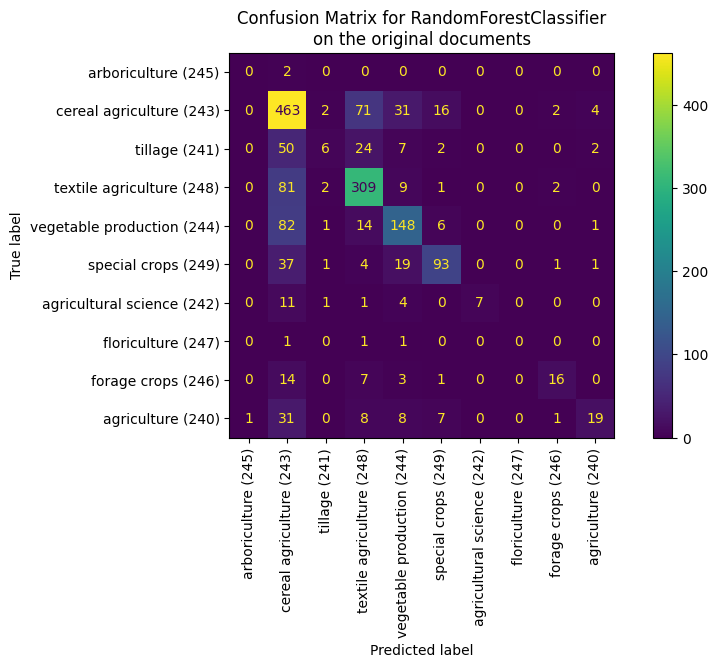

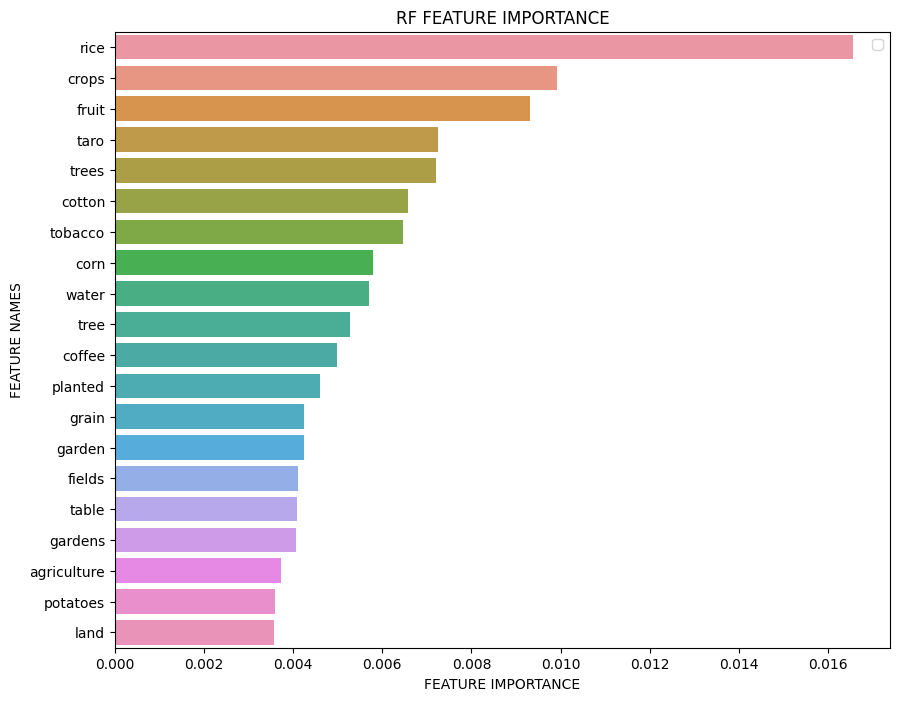

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 1.929s at 1.855MB/s
n_samples: 6546, n_features: 6404
n_samples: 1637, n_features: 6404


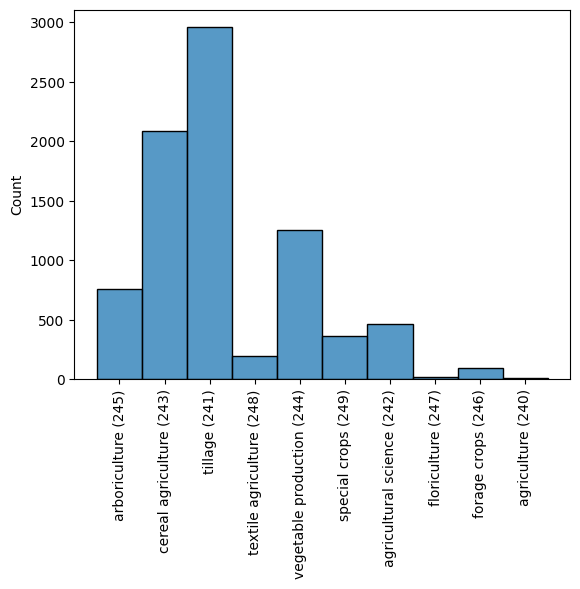

########## None LR 

########## Training LogisticRegression

########## 0.6682956627978008


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



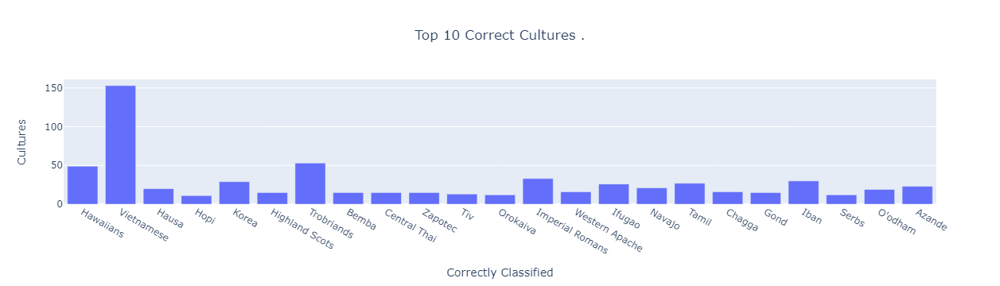

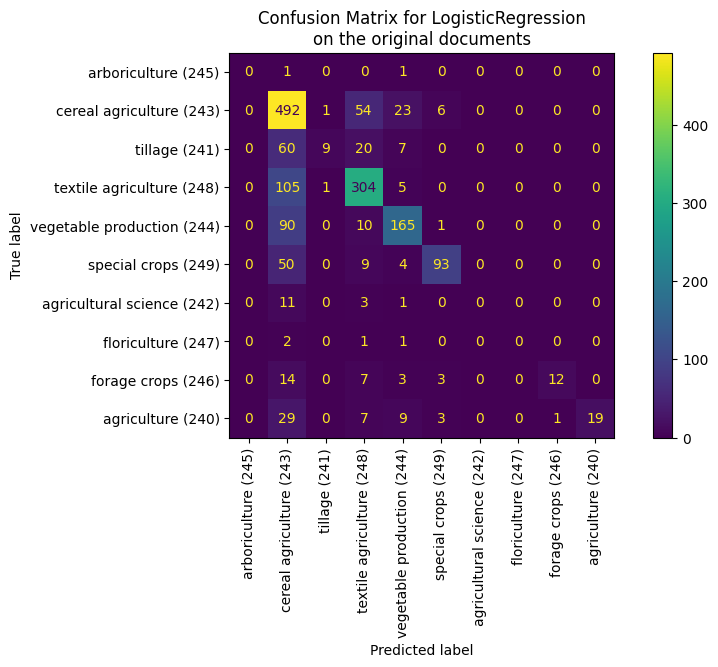

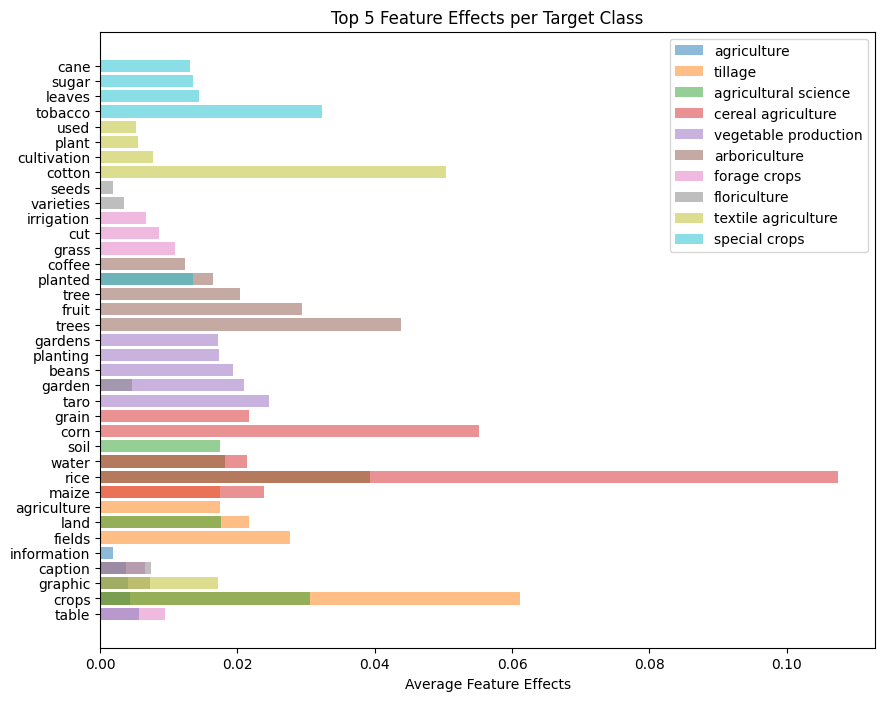

########## None RF 

########## Training RandomForestClassifier

########## 0.6481368356750152


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


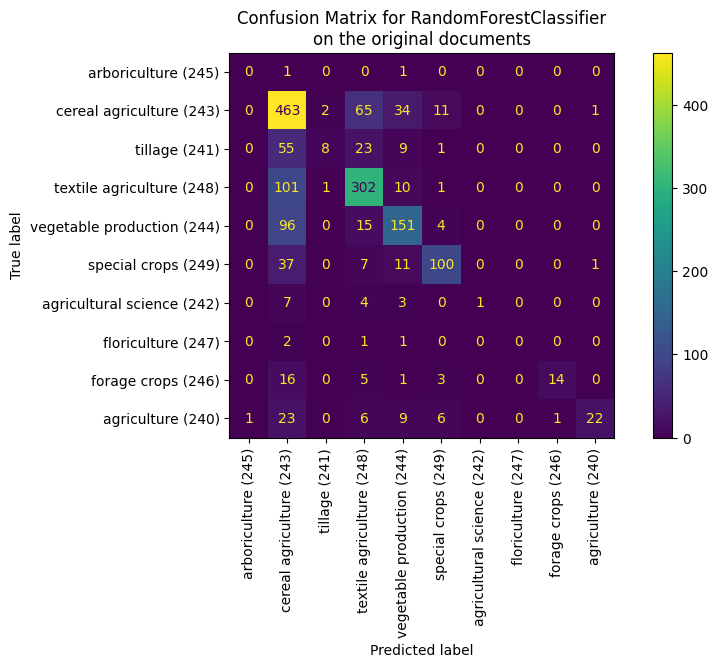

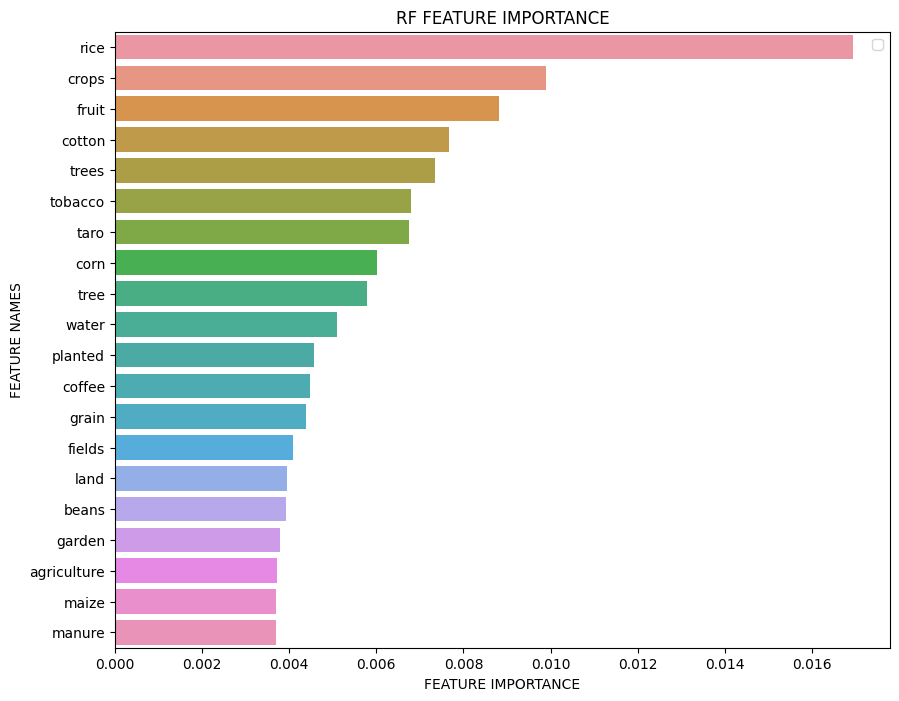

In [10]:

dfs = {}
for i in [224, 226, 241, 243]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=False, verbose=True)
    dfs[i] = df

- categorize features for each culture
- measure the sim between cultures based on these categories?
- this would allow comparing cultures based on the sim of these features across cultures based on some threshold (e.g. tfidf)
- they indicate the levels/types of the usage/facts of these cultures;
    - e.g. one culture is more advanced in using tools
    - e.g. en
    - 

# Archive

In [11]:
data = []
for i in [224, 226, 241, 243]:
    data.append(df[ df['ocms_list'].map(lambda x: len(x) == 1 and x[0] == i) ])
data = pd.concat(data)

<Axes: xlabel='ocms', ylabel='Count'>

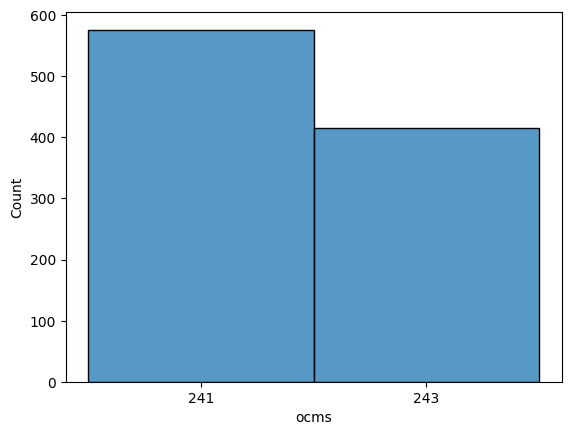

In [12]:
sns.histplot(data['ocms'])
# data.ocms.hist()

In [13]:
s = time.time()

tfidf_vec = TfidfVectorizer(min_df=3, # If a token appears fewer times than this, across all documents, it will be ignored
                             # tokenizer=nltk.word_tokenize, # we use the nltk tokenizer
                             tokenizer=preprocessing.tokenize_data, # we use the custom tokenizer
                             stop_words='english')#stopwords.words('english')) # stopwords are removed

tfidf_text = tfidf_vec.fit_transform(data['textrecord'])


e = time.time()
print("Elapsed time during the whole program in seconds:",
                                         e-s) 

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



Elapsed time during the whole program in seconds: 0.31963658332824707


## Random Forest

In [14]:
# clf = RandomForestClassifier(random_state=0)
# # cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)

# param_grid = {"max_depth": [3, None],
#               "min_samples_split": [5, 10],}

# search = HalvingGridSearchCV(clf, param_grid, resource='n_estimators',
#                              max_resources=10,
#                              cv=5,
#                              random_state=0).fit(X_train, y_train)
# search.best_params_  # {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 9}

In [15]:
# search.best_estimator_.score(X_test, y_test)

In [16]:
# Train a Random Forest model
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

NameError: name 'X_train' is not defined

In [ ]:
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)

# n_scores = cross_val_score(model, 
#                            tfidf_text, data['parent_ocms'], 
#                            scoring='accuracy', 
#                            cv=cv, 
#                            n_jobs=-1, 
#                            error_score='raise')

In [ ]:

# print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

In [ ]:
# Evaluate the model on the testing set
accuracy = model.score(X_test, y_test)
print("Accuracy:", accuracy)

In [ ]:
preds = model.predict(X_test)
print(preds)

In [ ]:
plots.make_cm(model, preds, y_test, data['ocms'].uniqueque())

In [ ]:
report = classification_report(y_test, preds, digits = 3)
print(report)

In [ ]:
_test = df['textrecord'][SELECTED*2:SELECTED*3]
_test = text_vec.transform(_test)

In [ ]:
rf.predict(_test)[100:300]

In [ ]:
# Evaluate the model on the testing set
accuracy = rf.score(X_test, y_test)
print("Accuracy:", accuracy)

## Logisitc Regression

In [ ]:

pipe = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(max_iter=10000))

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(tfidf_text, data['parent_ocms'], test_size=0.2)

In [ ]:
pipe.fit(X_train, y_train)

In [ ]:
pipe.score(X_test, y_test)

In [ ]:
clf.score(X_test, y_test)

In [ ]:
clf.score(X_test, y_test)

In [ ]:
clf.predict(X[:2, :])

In [ ]:
clf.predict_proba(X[:2, :]).shape

## KNN

In [ ]:
k_values = [i for i in range (1,31)]
scores = []

scaler = StandardScaler(with_mean=False)
X = scaler.fit_transform(X_train)

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X, y_train, cv=5)
    scores.append(np.mean(score))

In [ ]:
sns.lineplot(x = k_values, y = scores, marker = 'o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")

In [ ]:
pipe = make_pipeline(StandardScaler(with_mean=False),
                     KNeighborsClassifier(n_neighbors=16))

In [ ]:
pipe.fit(X_train, y_train)

In [ ]:
pipe.score(X_test, y_test)

In [ ]:
nlp = spacy.load("en_core_web_sm")

In [ ]:
# Define a function to preprocess a text record
def preprocess_text(text):
    doc = nlp(text)
    tokens = [token.lemma_.lower().strip() for token in doc 
              if not token.is_stop and not token.is_punct and token.lemma_ != '-PRON-']
    return tokens

In [ ]:
s = time.time()

# Apply the preprocess_text function to the textrecord column
df["processed_text"] = df["textrecord"].apply(preprocess_text)

    
e = time.time()


print("Elapsed time during the whole program in seconds:",
                                         e-s) 

In [ ]:
df.to_csv('data/splitted_preprocessed.csv')

In [ ]:
s = time.time()

nlp.pipe(df["textrecord"])


e = time.time()


print("Elapsed time during the whole program in seconds:",
                                         e-s) 

In [ ]:
# Preprocess data (e.g., remove missing values, encode categorical variables)

for doc in nlp.pipe(texts):
    # Do something with the doc here
    print([(ent.text, ent.label_) for ent in doc.ents])

    

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data.drop("dependency_strength", axis=1), data["dependency_strength"], test_size=0.2)

In [ ]:
# Train a Random Forest model
rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

In [ ]:
# Evaluate the model on the testing set
accuracy = rf.score(X_test, y_test)
print("Accuracy:", accuracy)

# Links
- https://www.datacamp.com/tutorial/random-forests-classifier-python
- https://machinelearningmastery.com/random-forest-ensemble-in-python/
- https://github.com/WillKoehrsen/Data-Analysis/tree/master/random_forest_explained
- https://www.kdnuggets.com/2017/06/7-techniques-handle-imbalanced-data.html
- https://towardsdatascience.com/methods-for-dealing-with-imbalanced-data-5b761be45a18
- **GREAT RESOURCE** https://scikit-learn.org/stable/auto_examples/text/plot_document_classification_20newsgroups.html#sphx-glr-auto-examples-text-plot-document-classification-20newsgroups-py
- https://scikit-learn.org/stable/modules/ensemble.html#subsampling